<a href="https://colab.research.google.com/github/ArturoSirvent/TFG_notebooks/blob/main/FINAL_NOTEBOOK/Final_RESULTS_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Última recopilación / prueba de resultados.

1. Modelos con una fuerte compresión de carterísticas 30 ó 40.
    
    a. Comparación con 1 telescopio, con varios y con autoencoder.

    b. Experimentar con varias arquitecturas.

    c. Probar con introducir al modelo solo la imagen comprimida por el autoencoder.
    
2. Hacer data augmentation con los datos rotándolos. 

3. Para la detección de energías usar nuevas metricas (rmse, N-rmse,R^2)

4. Atention layer??


#Ponemos datos 4 telescopios grandes en una imagen.
Tambien las rotamos para tener mas imagenes. O lo intentamos.

In [ ]:
import tensorflow as tf
import numpy as np 
import json
import time
import matplotlib.pyplot as plt
import os
import re
import glob
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.model_selection import RandomizedSearchCV

#NUMERO DE DATOS


In [ ]:
#numero de eventos, lo sacaremos con get_common_event
npy_base="/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/npy_data"
elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon']
runs=[40,40,40,40,20,40,40]
valores=[]
for k,l in enumerate(elementos):
    aux=0
    for i in range(1,1+runs[k]):
        aux+=len(get_common_events(f"{npy_base}/npy_{elementos[k]}",tels=[4,5,6,11,33,34],run=i)[1])
    valores.append(aux)

print(valores)

[24061, 1347, 992, 667, 21, 378, 274]


In [ ]:
a=[24324, 1406, 1014, 691, 26, 377, 304]
b=[23209, 1235, 889, 602, 23, 349, 278]
c=[24061, 1347, 992, 667, 21, 378, 274]

#Pruebas agrupaciones


In [ ]:
#funciones necesarias
def list_txts(base_txt_dir,elemento,run):
    regex=f"{base_txt_dir}/*/{elemento}_tel_*_run_{str(run).zfill(2)}.txt"
    return sorted(glob.glob(regex),key=lambda x: int(re.findall("tel_([0-9]*)_",x)[0]))
 
def id_events(base_txt_dir,elemento,run):
    #buscamos todos los txt todos los numeros de eventos y luego los contamos solo una vez
    eventos=np.array([])
    listatxt=list_txts(base_txt_dir,elemento,run)
    if len(listatxt)==0:
        print(f"Algún error, no se han encontrado archivos de run {run} y elemento {elemento}.")
    for i,j in enumerate(listatxt):
        eventos=np.concatenate((eventos,extract_info_txt(j,cols=0)))
 
    return np.asarray(sorted(np.unique(eventos)))
 
def eventos_y_telescopios(base_txt_dir,elemento,run):
    #esta funcion nos crea un disccionario con el numero de evento y con los telescopios que forman parte
    #cuando abrimos una txt vemos que eventos hay dentro y añadimos al total los telescopios segun toque
    event_tels={}
    listatxt=list_txts(base_txt_dir,elemento,run)
    if len(listatxt)==0:
        print(f"Algún error, no se han encontrado archivos de run {run} y elemento {elemento}.")
    for i,j in enumerate(listatxt):
        tel_aux=int(re.findall("tel_([0-9]*)_",j)[0])
        events_aux=extract_info_txt(j,cols=0)
        for k in events_aux:
            if k not in event_tels.keys():
                event_tels[k]=[tel_aux]
            else:
                event_tels[k].append(tel_aux)
    return event_tels

def eventos_y_energia(base_txt_dir,elemento,run):
    #esta funcion nos crea un disccionario con el numero de evento y la nergia o algo asi que forman parte
    #cuando abrimos una txt vemos que eventos hay dentro y añadimos al total los telescopios segun toque
    event_tels={}
    #buscamos para todos los telescopios
    listatxt=list_txts(base_txt_dir,elemento,run)
    if len(listatxt)==0:
        print(f"Algún error, no se han encontrado archivos de run {run} y elemento {elemento}.")
    for i,j in enumerate(listatxt):
        events_aux=extract_info_txt(j,cols=[0,2])
        for p,k in enumerate(events_aux[0]):
            if k not in event_tels.keys():
                event_tels[k]=events_aux[1][p]
                
    return event_tels

def extract_info_txt(txt_dir,cols=None,cols_order=True):
  #extraer la informacion relevante de un archivo .txt
  #si se le pasan ciertas columnas se devolvera una lista solo con esas columnas
    cols_names=["event"
    ,"telescope"
    ,"energy"
    ,"core distance to telescope"
    ,"image size (amplitude) [p.e.]"
    ,"number of pixels in image"
    ,"width [deg.]"
    ,"length [deg.]"
    ,"distance [deg.]"
    ,"miss [deg.]"
    ,"alpha [deg.]"
    ,"orientation [deg.]"
    ,"direction [deg.]"
    ,"image c.o.g. x [deg.]"
    ,"image c.o.g. y [deg.]"
    ,"Xmax [g/cm^2]"
    ,"Hmax [m]"
    ,"Npe (true number of photo-electrons)"
    ,"(19-23): Hottest pixel amplitudes)"]
    with open(txt_dir,"r") as file:
        text_aux=file.read()
        a=re.findall(r'@\+[\s\d.-]*\d',text_aux)
        a=[i.replace("@+ ","").split() for i in a]
    if cols is None:
        return np.array(a).astype("float")
    elif type(cols)==list or type(cols)==np.array:
        list_aux=[]
        if cols_order :
            for i in cols:
                list_aux.append(np.array([float(j[i]) for j in a]))
            return np.array(list_aux).astype("float")
        else:
            list_aux=[]
            for i in a:
                list_aux.append(np.array([i[j] for j in cols ]))
            return np.array(list_aux).astype("float")
 
    else:
        return np.array([float(j[cols]) for j in a]).astype("float")


#ahora tenemos que apañar esto a lo grande
#le decimos unos telescopios, un elemento y una run y que nos devuelva una listao array con muchas
#primero vamos a hacer que dados un id de evento y unos telescopios,
#se nos forma la imagen de input
def big_input_img(tels,element,run,base_txt_dir,base_npy_dir,return_energies=False):
    shape1=(55,93)
    list_tels_shape1=[4,5,6,11,58,59,60,61,85,86]

    aux_ids=eventos_y_telescopios(base_txt_dir,element,run)

    if return_energies:
        energias=eventos_y_energia(base_txt_dir,element,run)
    #solo dejamos los que tengan los 4 telescopios en la lista
    set_tels=set(tels)
    aux_keys=list(aux_ids.keys())
    for i in aux_keys:
        if set(aux_ids[i]).issuperset(set_tels):
            pass
        else:
            if return_energies:
                del energias[i]
            del aux_ids[i]
 
    num_eventos=len(aux_ids)
    if return_energies:
        if len(energias)!= num_eventos:
            print("Algun error con la lengitud de las labels y los eventos etc.. yo que se...")
    #ahora es cuando tenemos que hacer imagen final a base de los diferentes telescopios, 
    #primero lo vamos a hacer sencillo, uno detras de otro y dejamos ceros si sobra
    #tenemos que buscar los indices par aluego buscarlo en el npy de imagenes
 
 
    #primero de todo creamos el array inicial donde los vamos a ir metiendo
    alto=55*2
    largo=93*2
 
    final_array=np.zeros((num_eventos,alto,largo))
    #vamos telescopio por telescopio
    if return_energies:
        labels_energias=[]
    posiciones=[[0,0],[55,0],[55,93],[0,93]] #rellenadas desde la esquina sup izqr counterclokwise
    for j,i in enumerate(tels):
        pos_aux=posiciones[j]
 
        #si está seguimos adelante cargando el evento
        #tenemos que cargar la lista y ver el indice para luego cargar el evento
        indices_aux=np.load(f"{base_npy_dir}/npy_{element}/id_eventos_npy_sin_normal_{element}_tel_{i}_run_{str(run).zfill(2)}.npy")
        comprobar_shape_1=indices_aux.shape[0]
        img_aux=np.load(f"{base_npy_dir}/npy_{element}/npy_sin_normal_{element}_tel_{i}_run_{str(run).zfill(2)}_0.npy")
        comprobar_shape_2=img_aux.shape[0]
        if comprobar_shape_1 != comprobar_shape_2:
            print(f"Error con las dimensiones del array de indices y el de imagenes para {element}: run {run}, tel {i}.")
        for k,id_evento in enumerate(aux_ids.keys()):
            if i in aux_ids[id_evento]:
                num_indice=np.where(indices_aux==id_evento)[0][0]
                img_aux_2=img_aux[num_indice]

                final_array[k,pos_aux[0]:(pos_aux[0]+55),pos_aux[1]:(pos_aux[1]+93)]=img_aux_2
            else:
                print("Error, se suponia que todos los eventos tenia todosl ostelescopios")
                pass
            
            if return_energies:
                if j==0:
                    try:
                        labels_energias.append(energias[id_evento])
                    except:
                        print("Algun error con las keys de los eventos y las de las energias, nu se...")
 
                #para el primer telescopio solo, no hace falta mas
 
    if return_energies:
        return final_array, labels_energias
    else:
        return final_array




#ahora hacemos para que esto lo haga para varias runs y todas juntas
def mult_runs_big_input_img(tels,element,runs,base_txt_dir,base_npy_dir,return_energies=False):
    if not return_energies:
        final=big_input_img(tels,element,runs[0],base_txt_dir,base_npy_dir)
        for i in runs[1:]:
            final=np.concatenate((final,big_input_img(tels,element,i,base_txt_dir,base_npy_dir)))
        return final
    else:
        final_array,final_labels=big_input_img(tels,element,runs[0],base_txt_dir,base_npy_dir,return_energies=True)
        for i in runs[1:]:
            aux1,aux2=big_input_img(tels,element,i,base_txt_dir,base_npy_dir,return_energies=True)
            final_array=np.concatenate((final_array,aux1))
            final_labels.extend(aux2)
        return final_array,final_labels


#una funcion para crear la lista de list runs segun nos sea necesaria para indicar las runs a tomar de cada elemento
def create_lista_list_runs(num_events,init_events=None,random_select=False,elementos=None,max_runs=None):
    #solo tenemos que indicar la cantidad de runs que queremos de cada uno de los elementos
    #tambien podemos indicar el numero maximo de runs disponibles y si los queremos aleatorios
    if type(init_events)==int:
        if init_events==0:
            init_events=1
        init_events=np.ones(len(num_events))*init_events
    if elementos is None:
        elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon']
    if max_runs is None:
        max_runs=[41,40,40,40,20,40,40]
    lista_master=[]
    for i,j in enumerate(num_events):
        if random_select:
            if j> max_runs[i]:
                print("No hay tantas runs.")
                list_aux=np.random.randint(low=1,high=max_runs[i]+1,size=max_runs[i])
            else:
                list_aux=np.random.randint(low=1,high=max_runs[i]+1,size=j)
        else: 
            if init_events is not None:
                if (j+init_events[i]-1)> max_runs[i]:
                    print(f"Error, para el {i} te estas pasando de run, no hay runs {np.arange(max_runs[i]+1,init_events[i]+j+1,dtype=int)}")
                    if init_events[i] > max_runs[i]:
                        list_aux=np.random.randint(low=1,high=max_runs[i]+1,size=j)
                    else:
                        list_aux=np.arange(init_events[i],1+max_runs[i],dtype=int)
                else:
                    list_aux=np.arange(init_events[i],j+init_events[i],dtype=int)
 
 
            else:
                if (j) > max_runs[i]:
                    print(f"Error, para el \"{elementos[i]}\" te estas pasando de run, no hay run {np.arange(max_runs[i]+1,j+2,dtype=int)}")
                    list_aux=np.arange(1,max_runs[i]+1,dtype=int)
                else:
                    list_aux=np.arange(1,j+1,dtype=int)
        lista_master.append(list_aux)
    return np.array(lista_master,dtype=object)



#final dataset function
#le pasamos los elementos y las runs que queremos de cada y obtenemos el dataset 
#con sus labels y todo. Las labels tambien las personalizamos
 
def data_set_longinput(tels,runs_list,base_txt_dir,base_npy_dir,labels=None,elements=None,test_size=0.2):
    if elements is None:
        elements=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon']
        if labels is None:
            labels=[0,1,2,3,4,5,6]
    else:
        if labels is None:
            labels=np.arange(len(elements))
    if len(elements)!= len(labels):
        print("Error con la long de las labels y los elementos.")
        return None
    features_list=mult_runs_big_input_img(tels,elements[0],runs_list[0],base_txt_dir,base_npy_dir)
    labels_array=np.ones(features_list.shape[0])*labels[0]
    print(elements[0],features_list.shape[0],features_list.shape,labels_array.shape)
    for i,j in enumerate(elements[1:]):
        aux_element=mult_runs_big_input_img(tels,j,runs_list[i+1],base_txt_dir,base_npy_dir)
        features_list=np.concatenate((features_list,aux_element))
        labels_array=np.concatenate((labels_array,np.ones(aux_element.shape[0])*labels[i+1]))
        print(elements[i+1],aux_element.shape[0],features_list.shape,labels_array.shape)
    features_list=features_list[...,np.newaxis]
    labels_array=tf.keras.utils.to_categorical(labels_array)
    x_train,x_test,y_train,y_test=train_test_split(features_list,labels_array,random_state=42,test_size=test_size)
    return x_train,x_test,y_train,y_test

In [ ]:
"""
def print_conf_matrix(matrix,elements=None,sin_diag=True):
    if elements is None:
        elements=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon']
    if sin_diag:
        for i in range(len(elements)):
            matrix[i,i]=0
    plt.figure(figsize=(13,13))
    sns.heatmap(matrix,annot=True)

    plt.yticks(np.arange(len(elements))+0.25,elements,fontsize=14,rotation=45);
    plt.xticks(np.arange(len(elements))+0.25,elements,fontsize=14,rotation=45);
    plt.title("True label en el eje Y, predicted en el eje X", fontsize=15)


def comp_and_diplay_conf_matrix(y_test,y_predict,elements=None,sin_diag=True):
    matrix=confusion_matrix(np.argmax(y_test,axis=-1),np.argmax(y_predict,axis=-1))
    print_conf_matrix(matrix,elements=elements,sin_diag=sin_diag)
"""


def display_max_errores(x_test,y_test,y_predicted,true_index=None,predict_index=None,sort_max=False):
    #primero tenemos que sacar aquellos que tengan maxima discrepancia entre lo predicho y lo real
    #sort max seria para sortearlas segun los maximo errores cometidos
    indices={}
    a=0
    if (true_index is None) or (predict_index is None):
        print("Dime que elemento quieres ver sus errores")
        return None

    if sort_max:
        #solo tenemos que meter primero a los que tengan mayor certeza de prediccion y asi ya nos sacara los erroneos
        indices_sort=np.argsort(y_predicted[:,predict_index])[::-1]
        #los mayores iran delante
        y_test=y_test[indices_sort]
        y_predicted=y_predicted[indices_sort]


    for i,j in enumerate(y_test):
        true_ind=np.argmax(j)
        predict_ind=np.argmax(y_predicted[i])
        if (true_ind!=predict_ind) and ((true_ind==true_index) and (predict_ind==predict_index)):
            indices[i]=y_predicted[i][predict_index], y_predicted[i][true_index]
    return indices

def plot_errors(x_test,y_test,y_predicho,true_index,predict_index,elementos=None,sort_max=False):

    if elementos is None:
        elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon']
    a=display_max_errores(x_test,y_test,y_predicho,true_index=true_index,predict_index=predict_index,sort_max=sort_max)
    #vamos a ver algunos de los que se han confundido

    for i in range(0,8):
        fig=plt.figure(figsize=(10,8))
        indice=i #por orden natural
        indice_real= list(a)[indice]# el valor real en el x_test
        fig.suptitle(f"Se creyó que era {elementos[predict_index]} ({a[indice_real][0]*100:.2f}%), pero era {elementos[true_index]} ({a[indice_real][1]*100:.2f}%)",fontsize=15)
        for j in range(1,5):    
            plt.subplot(2,2,j)
            plt.imshow(x_test[j-1][indice_real][:,:,0])
            
        plt.tight_layout()

In [ ]:
def cargar_datos(labels,tels=None):
    txt_dir="/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21"
    npy_dir="/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/npy_data"
    if tels is None:
        tels=[4,11,5,6]
    a=create_lista_list_runs([1,7,7,8,8,8,8],init_events=np.ones(7),random_select=False)
    x_train,x_test,y_train,y_test=data_set_longinput(tels,a,txt_dir,npy_dir,labels=labels,elements=None)
    return x_train,x_test,y_train,y_test

/usr/local/lib/python3.7/dist-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


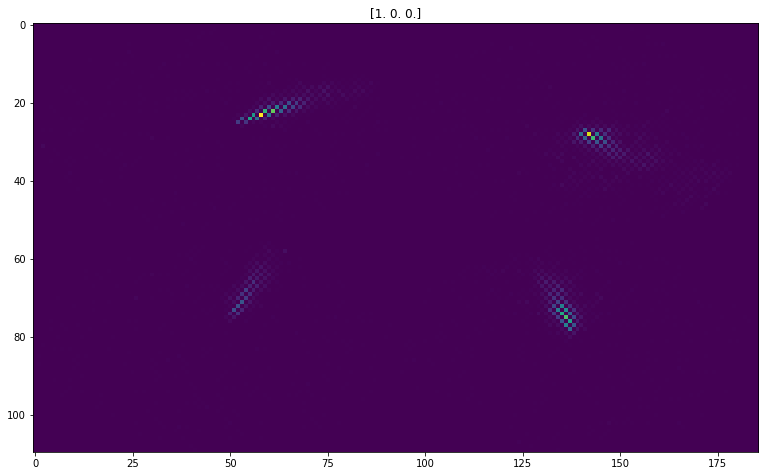

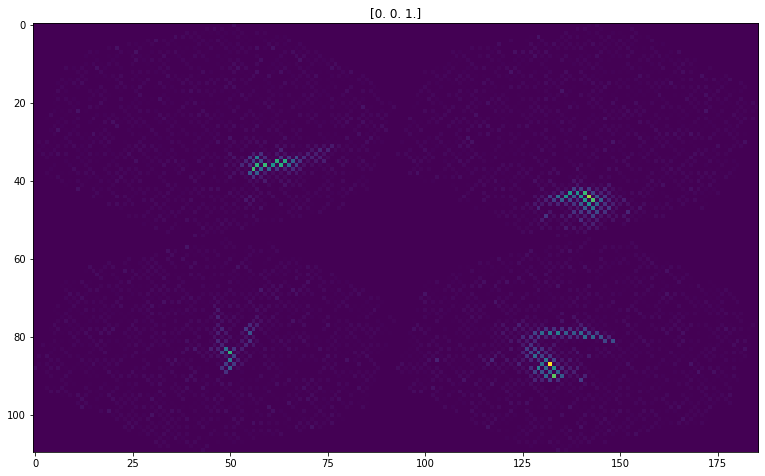

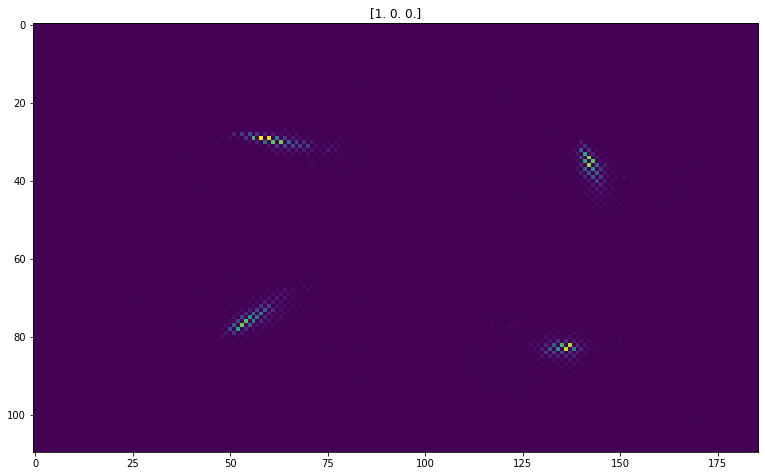

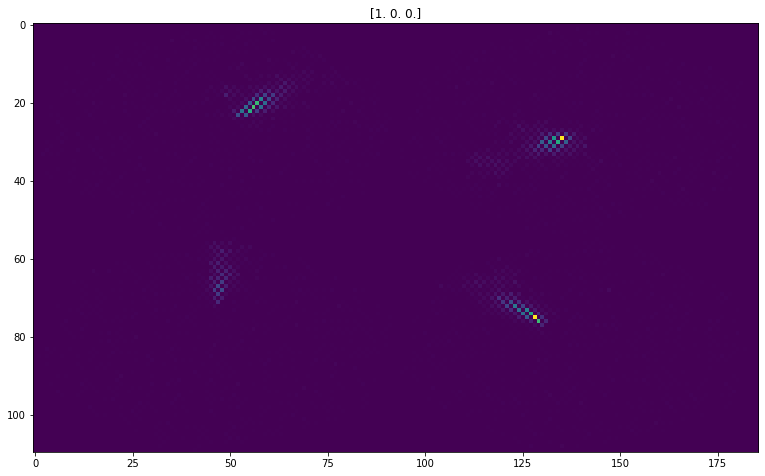

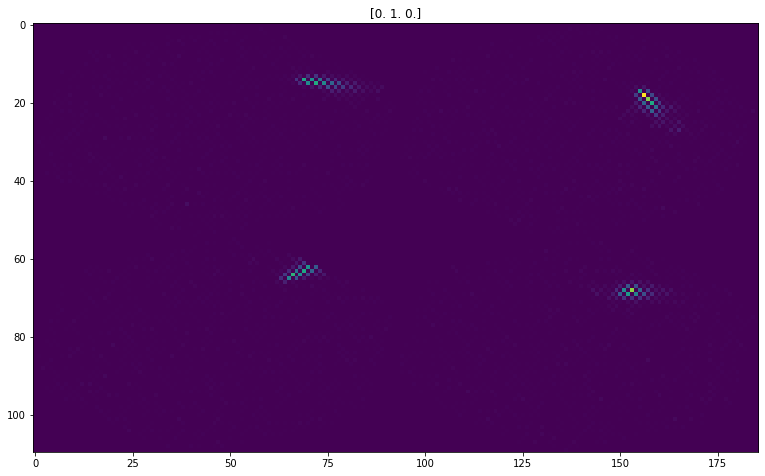

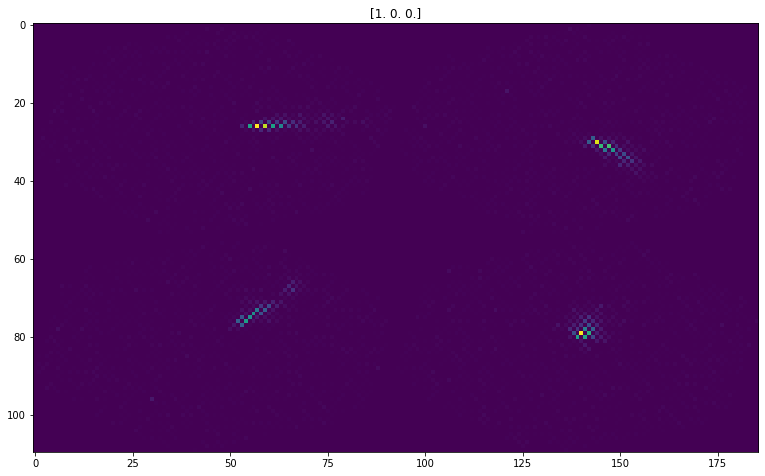

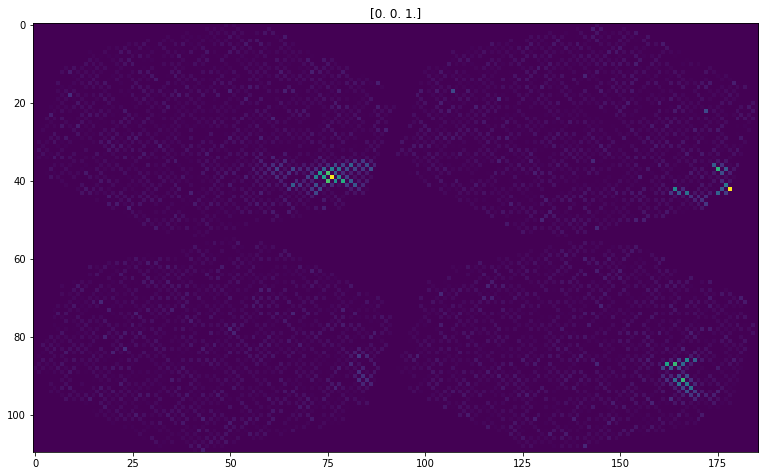

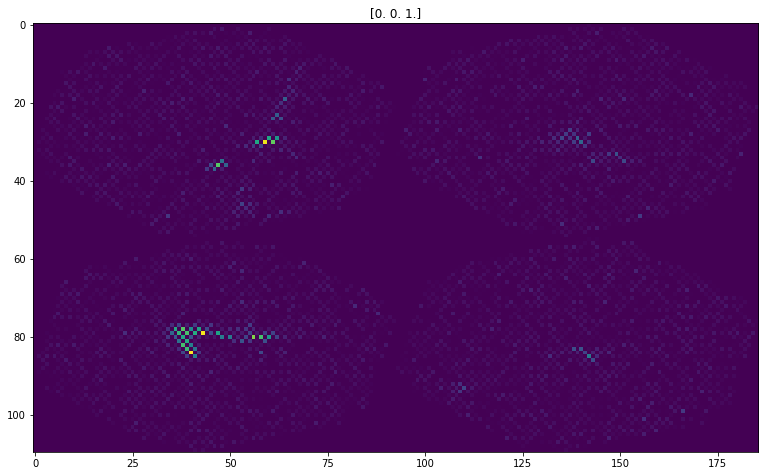

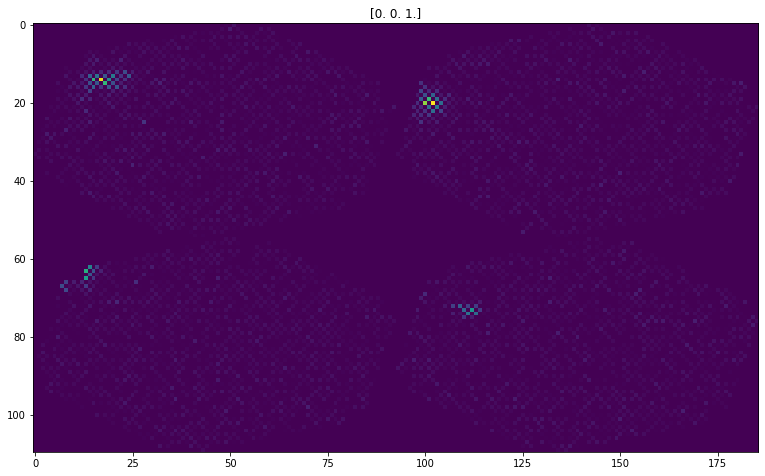

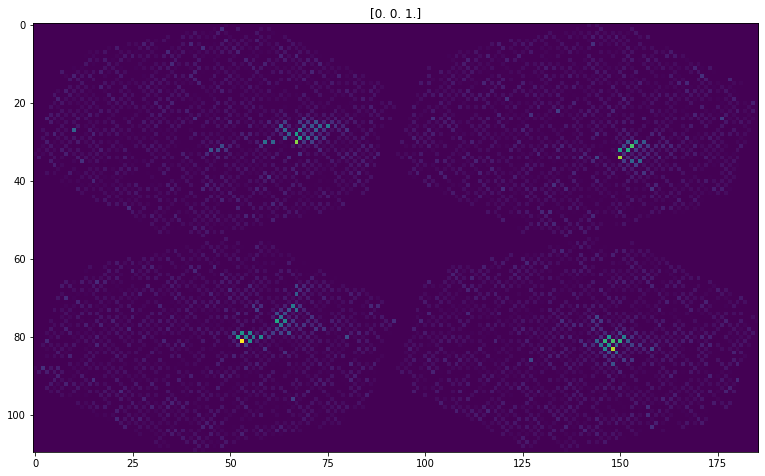

In [ ]:
for i in range(10):
    plt.figure(figsize=(13,13))
    plt.imshow(x_train[i][:,:,0])
    plt.title(y_train[i])

In [ ]:
def create_model():
    model=tf.keras.Sequential([tf.keras.Input(shape=(55*2,93*2,1))])
    filts=[[32,64],[128,128],[256,64]]
    kerns=[[5,3],[3,3],[3,3],[3,3]]

    for i in range(len(filts)):
        model.add(tf.keras.layers.Conv2D(filts[i][0],kerns[i][0],activation="relu"))
        model.add(tf.keras.layers.Conv2D(filts[i][1],kerns[i][1],activation="relu"))
        if i!= (len(filts)-1):
            model.add(tf.keras.layers.MaxPool2D(pool_size=(2,2)))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(100,activation="relu"))
    #model.add(tf.keras.layers.Dense(20,activation="relu"))
    model.add(tf.keras.layers.Dense(4,activation="softmax"))
    return model

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20 (Conv2D)           (None, 106, 182, 64)      1664      
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 104, 180, 64)      36928     
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 52, 90, 64)        0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 50, 88, 128)       73856     
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 48, 86, 128)       147584    
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 24, 43, 128)       0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 22, 41, 256)      

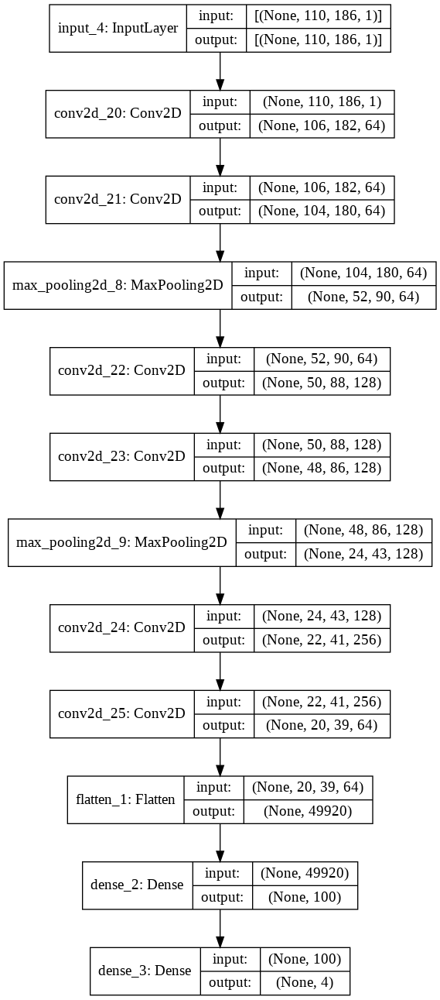

In [ ]:
model=create_model()
model.summary()
tf.keras.utils.plot_model(model,show_shapes=True)

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),loss="categorical_crossentropy",metrics=["accuracy"])

In [ ]:
model.fit(x_train,y_train,epochs=40,batch_size=64,validation_data=(x_test,y_test))

In [ ]:
#vamos a darle diferentes labels
elements=np.array(["gamma","electron",'proton', 'helium', 'iron', 'nitrogen', 'silicon'])
aux_save_dir="/content/drive/MyDrive/prediccion_datos_muchos_telescopios/aux_matrix/"
lista_labels=np.array([[0,1,3,3,3,2,2],[0,1,3,3,2,3,2],[0,1,3,3,2,2,3],[0,1,3,2,3,3,2],[0,1,3,2,3,2,3],[0,1,3,2,2,3,3],[0,1,2,3,3,3,2],[0,1,2,3,3,2,3],[0,1,2,3,2,3,3],[0,1,2,2,3,3,3]])#CON TRES
# Con dos lista_labels=np.array([[0,1,3,3,2,2,2],[0,1,3,2,3,2,2],[0,1,3,2,2,3,2],[0,1,3,2,2,2,3],[0,1,2,3,3,2,2],[0,1,2,3,2,3,2],[0,1,2,3,2,2,3],[0,1,2,2,3,3,2],[0,1,2,2,3,2,3],[0,1,2,2,2,3,3]])
hist_total=[]
for i,j in enumerate(lista_labels):
    model=create_model()
    model.compile(optimizer=tf.keras.optimizers.Adam(4e-4),loss="categorical_crossentropy",metrics=["accuracy"])
    x_train,x_test,y_train,y_test=cargar_datos(j)
    hist_aux=model.fit(x_train,y_train,epochs=65,batch_size=64,validation_data=(x_test,y_test))
    hist_total.append(hist_aux)
    comp_and_diplay_conf_matrix(y_test,model.predict(x_test),["gamma","electron","resto",str(elements[j==3])],sin_diag=False)
    plt.savefig(f"{aux_save_dir}prueba_{i}_matrix_4.png")

gamma 1999 (1999, 110, 186) (1999,)
electron 795 (2794, 110, 186) (2794,)
proton 2266 (5060, 110, 186) (5060,)
helium 1754 (6814, 110, 186) (6814,)
iron 657 (7471, 110, 186) (7471,)
nitrogen 811 (8282, 110, 186) (8282,)
silicon 849 (9131, 110, 186) (9131,)
Epoch 1/65
115/115 [==============================] - 25s 63ms/step - loss: 0.8441 - accuracy: 0.7014 - val_loss: 0.4765 - val_accuracy: 0.7942
Epoch 2/65
115/115 [==============================] - 6s 53ms/step - loss: 0.5030 - accuracy: 0.7830 - val_loss: 0.4566 - val_accuracy: 0.8002
Epoch 3/65
115/115 [==============================] - 6s 54ms/step - loss: 0.4434 - accuracy: 0.7933 - val_loss: 0.5059 - val_accuracy: 0.7926
Epoch 4/65
115/115 [==============================] - 6s 53ms/step - loss: 0.4167 - accuracy: 0.8035 - val_loss: 0.4675 - val_accuracy: 0.7953
Epoch 5/65
115/115 [==============================] - 6s 53ms/step - loss: 0.3684 - accuracy: 0.8186 - val_loss: 0.5440 - val_accuracy: 0.7947
Epoch 6/65
115/115 [=======

In [ ]:
"""
function ClickConnect(){
    console.log("Clicked on connect button"); 
    document.querySelector("colab-connect-button").click()
}
setInterval(ClickConnect,60000)
"""

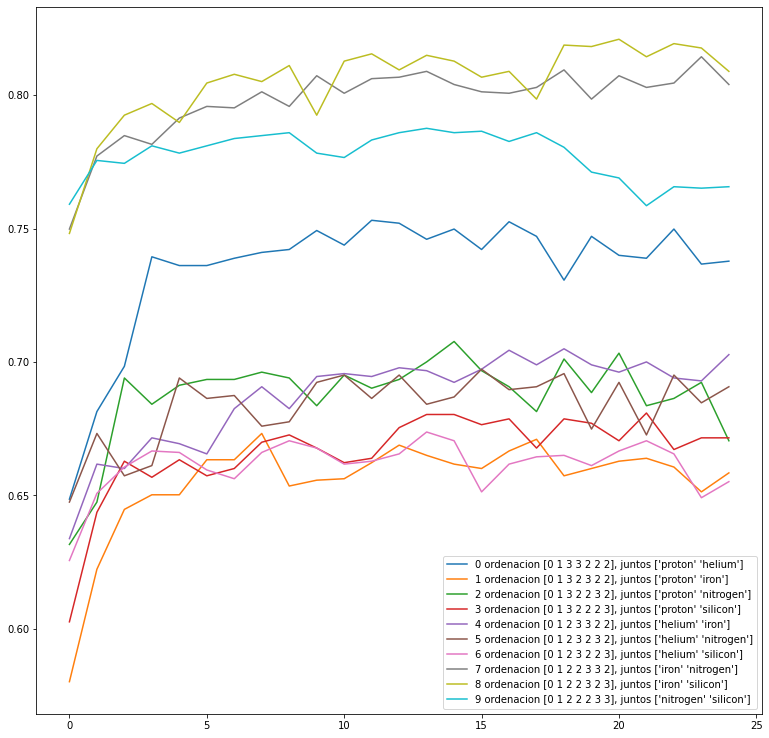

In [ ]:
elements=np.array(["gamma","electron",'proton', 'helium', 'iron', 'nitrogen', 'silicon'])

plt.figure(figsize=(13,13))
for j,i in enumerate(hist_total):
    aux=i.history["val_accuracy"]
    plt.plot(aux,label=f"{str(j)} ordenacion {lista_labels[j]}, juntos {elements[lista_labels[j]==3]}")
    plt.legend()
plt.savefig("/content/drive/MyDrive/prediccion_datos_muchos_telescopios/aux_matrix/ordenacion_accuracy_3juntos.png")

# Representacion bonita de resultados

In [ ]:
def hex_repre(matrix=None,npy_file=None,savedir=None):
  if npy_file is None and matrix is not None:
    matrix_aux=matrix
  elif npy_file is not None and matrix is None:
    datos=np.load(npy_file)
    matrix_aux=sum(datos)
  else:
    print("Error, debes pasar solo una de las dos cosas, matriz o ruta de archivo.")
    return
  plt.figure(figsize=(12,12))
  plt.scatter(*matrix_aux.nonzero(),s=280,c=matrix_aux[matrix_aux.nonzero()],marker="H",cmap="RdPu",alpha=0.75)
  plt.xticks([])
  plt.yticks([])
  plt.tight_layout()
  #plt.colorbar()
  if savedir is None:
    plt.show()
  else:
    plt.savefig(savedir)
  plt.close()

In [ ]:
#cargamos unos datos cualquiera
npy_dir="/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/npy_data/npy_proton"
lista_archivos=glob.glob(f"{npy_dir}/npy*tel_30_*")
data=np.load(lista_archivos[0])

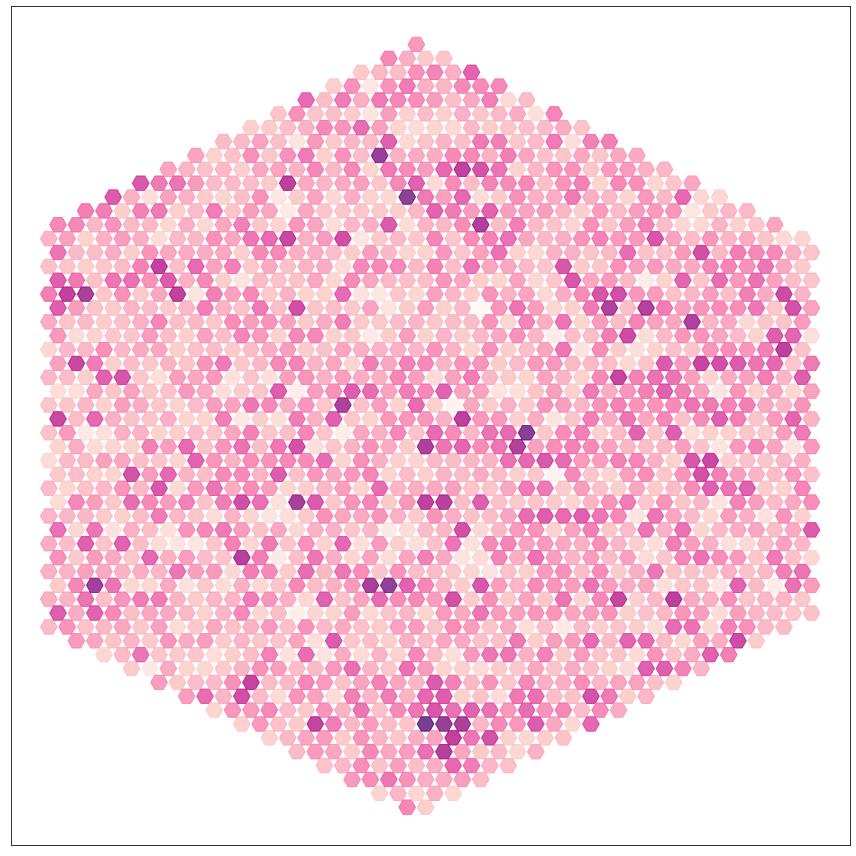

In [ ]:
hex_repre(np.sum(data[:45],axis=0))#,savedir="/content/drive/MyDrive/MAIN_TFG/final_results/telescopio_mediano.png")

([], <a list of 0 Text major ticklabel objects>)

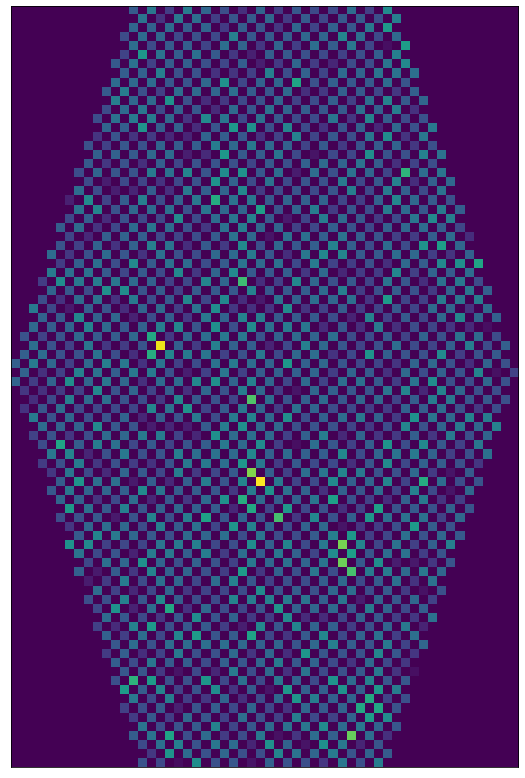

In [ ]:
plt.figure(figsize=(14,14))
plt.imshow(np.sum(data[5:17],axis=0))
plt.xticks([])
plt.yticks([])

In [ ]:
a=fill_holes(np.sum(data[:15],axis=0))


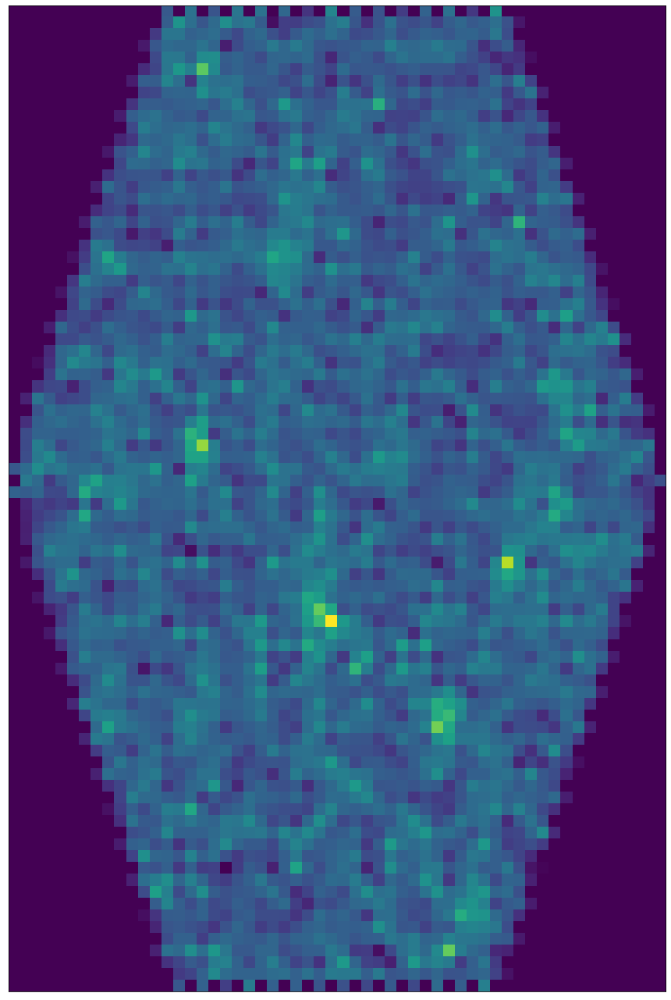

In [ ]:
plt.figure(figsize=(12,18))
plt.imshow(a)
plt.xticks([])
plt.yticks([])
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/telescopio_mediano_filled_holes.png")

# Resultados parte de autoencoder

In [ ]:
#funciones necesarias
#funcion que nos suaviza todo para que la red asimile mejor las cosicas
def fill_holes(npy):
    npy_aux=npy.copy()
    if type(npy)!=np.ndarray:
        print("Error input")
        return
    #para cada elemento que sea cero lo rellenamos con la media de los vecinos
    indices=np.where(npy[1:-1,1:-1]==0)
    indices_1=indices[1]+1
    indices_0=indices[0]+1
    for i in range(indices_1.shape[0]):
        media=(npy[indices_0[i]-1,indices_1[i]]+npy[indices_0[i],indices_1[i]-1]+npy[indices_0[i]+1,indices_1[i]]+npy[indices_0[i],indices_1[i]+1])/4
        npy_aux[indices_0[i],indices_1[i]]=media
    return npy_aux


#funcion para la carga de datos
def get_dirs_autoencoder(dir,tels=None,elementos=None,runs=None,fold_pref="extract_",same_quant=True,num_runs=None):
    #primero buscamos las dirs
    if elementos is None:
        elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon']
    dirs=[]
    for i,j in enumerate(elementos):
        for tel_aux,tel in enumerate(tels):
            if (tel_aux)*len(runs)>=num_runs[i]:
                pass
            else:
                for run_aux,run in enumerate(runs):
                    if num_runs is not None:
                        if num_runs[i]<=(run_aux):
                            pass
                        else:
                            regrex=f"{dir}/{fold_pref}{j}/{j}_tel_{tel}_run_{str(run).zfill(2)}.dt"
                            aux_glob=glob.glob(regrex)
                            if aux_glob:
                                dirs.extend(aux_glob)
                    else:
                        regrex=f"{dir}/{fold_pref}{j}/{j}_tel_{tel}_run_{str(run).zfill(2)}.dt"
                        aux_glob=glob.glob(regrex)
                        if aux_glob:
                            dirs.extend(aux_glob)
    return dirs


def get_data_autoencoder(dir,tels=None,elementos=None,runs=None,fold_pref="extract_",same_quant=True,num_runs=None,channel_dim=True):
    dirs=get_dirs_autoencoder(dir,tels=tels,elementos=elementos,runs=runs,fold_pref=fold_pref,same_quant=same_quant,num_runs=num_runs)

    #ahora lo que hacemos es cargar los datos tanto puro como sucios,
    # los pasamos por fill holes y los devolvemos
    lista_clean=[]
    lista_dirty=[]
    for i in dirs:
        print(i)
        file_clean=simple_load_dt_2_npy(i,truth_sim=True,use_only_relev_events=True)
        file_dirty=simple_load_dt_2_npy(i,truth_sim=False,use_only_relev_events=True)
        #aplicamos fillholes
        file_clean=np.array([fill_holes(i) for i in file_clean])
        file_dirty=np.array([fill_holes(i) for i in file_dirty])
        if channel_dim:
            file_clean=file_clean[...,np.newaxis]
            file_dirty=file_dirty[...,np.newaxis]

        lista_clean.append(file_clean)
        lista_dirty.append(file_dirty)
    return np.concatenate(lista_clean),np.concatenate(lista_dirty)
        

def simple_load_dt_2_npy(file,verbose=False,save=False,save_events_id=False,npy_dir_aux=None,truth_sim=True,use_only_relev_events=True):
    num_pix_x=0
    num_pix_y=0
    verbose_list=[]
    dt_list=[]  
    nombre_archivo=re.findall("([a-zA-Z]*_tel_[0-9]*_run_\d\d).dt",file)[0]
    aux_df=pd.read_csv(file,sep='  ',names=["1","2","3","4","5","6"],engine="python")
    #ahora la procesamos y la guardamos en un np

    if truth_sim:
        value_auf=aux_df.loc[aux_df["6"]==1,["1","3","4","5","6"]]
        x_minimo=min(aux_df['3'])
        y_minimo=min(aux_df['4'])
        num_pix_x_aux=aux_df["3"].unique().size
        num_pix_y_aux=aux_df["4"].unique().size
        events=aux_df["1"].unique()
        auxiliar=aux_df.loc[aux_df["1"]==events[0]][["3","4","5"]].to_numpy()
        size_pix_x=np.ceil((max(auxiliar[:,0])-min(auxiliar[:,0]))/(np.unique(auxiliar[:,0]).size-1))
        size_pix_y=np.ceil((max(auxiliar[:,1])-min(auxiliar[:,1]))/(np.unique(auxiliar[:,1]).size-1))
    else:
        value_auf=aux_df.loc[:,['1','3','4','5']]
        x_minimo=min(value_auf['3'])
        y_minimo=min(value_auf['4'])
        num_pix_x_aux=value_auf["3"].unique().size
        num_pix_y_aux=value_auf["4"].unique().size
        events=value_auf["1"].unique()
        auxiliar=value_auf.loc[aux_df["1"]==events[0]][["3","4","5"]].to_numpy()
        size_pix_x=np.ceil((max(auxiliar[:,0])-min(auxiliar[:,0]))/(np.unique(auxiliar[:,0]).size-1))
        size_pix_y=np.ceil((max(auxiliar[:,1])-min(auxiliar[:,1]))/(np.unique(auxiliar[:,1]).size-1))
    #tenemos que agupar los valores 
    if use_only_relev_events:
        events=aux_df.loc[aux_df["6"]==1,"1"].unique()
    else:
        events=value_auf["1"].unique()
    del aux_df,auxiliar
    
    value_auf.loc[value_auf["5"]<0,"5"]=0

    if verbose:
        #print(num_pix_x,num_pix_y)
        verbose_list.append((num_pix_x_aux,num_pix_y_aux))
    ##!!!esto puede dar problemas si resulta que para el primer evento faltan datos o algo...
    #ahora tenemos los datos de los pixeles, podemos obtener lo que ocupa cada pixel

    if verbose:
        #print(nombre_archivo,end="\n")
        verbose_list.append(nombre_archivo)

    value_auf.loc[:,'3']=value_auf['3'].apply(lambda x: round((x-x_minimo)/size_pix_x))
    value_auf.loc[:,'4']=value_auf['4'].apply(lambda x: round((x-y_minimo)/size_pix_y))
    #event_aux=value_auf["1"].unique()
    for k in range(np.shape(events)[0]):
        #cada evento tiene que ponerse en una imagen con sus valores
        array_aux=value_auf.loc[value_auf["1"]==events[k],["3","4","5"]]
        #lo que vamos a hacer es poner los valores en una matriz creada de antemano y guardar esa matrix
        #esos numeros vienen del maximo y el minimo valor para los pixeles, simplemente shifteamos todo
        matrix_aux=np.zeros((num_pix_x_aux,num_pix_y_aux)) #eran 60-5= 55 y 131-38
        matrix_aux[array_aux["3"].to_numpy(),array_aux["4"].to_numpy()]=array_aux["5"].to_numpy() 
        dt_list.append(matrix_aux)

    if save:
        name_npy=f"{npy_dir_aux}/npy_sin_normal_{nombre_archivo}_{contador_nombre}.npy"
        np.save(name_npy,np.array(dt_list))
    if save_events_id:
        name_npy_events=f"{npy_dir_aux}/id_eventos_npy_sin_normal_{nombre_archivo}.npy"
        np.save(name_npy_events,np.array(events))
    if verbose:
        return verbose_list, np.array(dt_list)
    else:
        return np.array(dt_list)

Model: "model_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 52, 92, 1)]       0         
_________________________________________________________________
model_9 (Functional)         (None, 20)                339908    
_________________________________________________________________
model_10 (Functional)        (None, 52, 92, 1)         301885    
Total params: 641,793
Trainable params: 641,793
Non-trainable params: 0
_________________________________________________________________


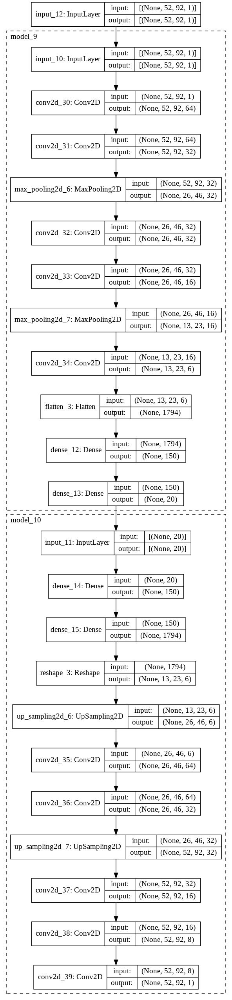

In [ ]:
#esta ha ido bastante bien
input_shape=(52,92,1)
input_img = tf.keras.Input(shape=input_shape)
x = tf.keras.layers.Conv2D(64, (5, 5),activation="relu", padding='same')(input_img)
x = tf.keras.layers.Conv2D(32, (5, 5), padding='same')(x)
x = tf.keras.layers.MaxPooling2D((2, 2),padding="same")(x)
x = tf.keras.layers.Conv2D(32, (3, 3), padding='same')(x)
x = tf.keras.layers.Conv2D(16, (3, 3),activation="relu", padding='same')(x)
x = tf.keras.layers.MaxPooling2D((2, 2),padding="same")(x)
x = tf.keras.layers.Conv2D(6, (3, 3), padding='same')(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(150,activation="relu")(x)
encoded=tf.keras.layers.Dense(20,activity_regularizer="l2")(x)
#encoder.summary()
decoder_input=tf.keras.Input(shape=(20,))
x=tf.keras.layers.Dense(150,activation="relu")(decoder_input)
x=tf.keras.layers.Dense(1794)(x)
x=tf.keras.layers.Reshape((13,23,6))(x)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(64, (3, 3), padding='same')(x)
x = tf.keras.layers.Conv2D(32, (3, 3), padding='same')(x)
x = tf.keras.layers.UpSampling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(16, (3, 3), padding='same')(x)
x = tf.keras.layers.Conv2D(8, (3, 3), padding='same')(x)
decoded = tf.keras.layers.Conv2D(1, (3, 3), activation='relu', padding='same')(x)

encoder = tf.keras.Model(input_img, encoded)

decoder=tf.keras.Model(decoder_input,decoded)

autoencoder_input=tf.keras.Input(shape=input_shape)
x=encoder(autoencoder_input)
autoencoder_output=decoder(x)
autoencoder = tf.keras.Model(autoencoder_input, autoencoder_output)
autoencoder.summary()
tf.keras.utils.plot_model(autoencoder,show_shapes=1,expand_nested=1)

In [ ]:
def create_autoencoder(activationfuns,mid_layer=20,prepost_layer=90,activityregul="l2",return_iner1=False,return_iner2=False,return_iner_full=False):
    #las activationfuns pueden ser 0 1 ó 2. 0 es None, 1 es relu y 2 es elu y 3 sigmoide
    #tenemos que meter 13, las 5 primeras son convs, las 3 sig son las internas y las 5 ultimas convs.
    #activityregul puede ser "l1", "l2" y None
    activationfuns=[None if i==0 else i for i in activationfuns]
    activationfuns=["relu" if i==1 else i for i in activationfuns]
    activationfuns=["elu" if i==2 else i for i in activationfuns]
    activationfuns=["sigmoid" if i==3 else i for i in activationfuns]

    input_shape=(52,92,1)
    input_img = tf.keras.Input(shape=input_shape)
    x = tf.keras.layers.Conv2D(64, (5, 5), padding='same',activation=activationfuns[0])(input_img)
    x = tf.keras.layers.Conv2D(32, (5, 5), padding='same',activation=activationfuns[1])(x)
    x = tf.keras.layers.MaxPooling2D((2, 2),padding="same")(x)
    x = tf.keras.layers.Conv2D(32, (3, 3), padding='same',activation=activationfuns[2])(x)
    x = tf.keras.layers.Conv2D(16, (3, 3), padding='same',activation=activationfuns[3])(x)
    x = tf.keras.layers.MaxPooling2D((2, 2),padding="same")(x)
    x = tf.keras.layers.Conv2D(6, (3, 3), padding='same',activation=activationfuns[4])(x)
    x = tf.keras.layers.Flatten()(x)
    pre_layer = tf.keras.layers.Dense(prepost_layer,activation=activationfuns[5])(x)
    encoded=tf.keras.layers.Dense(mid_layer,activation=activationfuns[6],activity_regularizer=activityregul)(pre_layer)
    #encoder.summary()
    decoder_input=tf.keras.Input(shape=(mid_layer,))
    x=tf.keras.layers.Dense(prepost_layer,activation=activationfuns[7])(decoder_input)
    x=tf.keras.layers.Dense(1794,activation="relu")(x)
    x=tf.keras.layers.Reshape((13,23,6))(x)
    x = tf.keras.layers.UpSampling2D((2, 2))(x)
    x = tf.keras.layers.Conv2D(64, (3, 3), padding='same',activation=activationfuns[8])(x)
    x = tf.keras.layers.Conv2D(32, (3, 3), padding='same',activation=activationfuns[9])(x)
    x = tf.keras.layers.UpSampling2D((2, 2))(x)
    x = tf.keras.layers.Conv2D(16, (3, 3), padding='same',activation=activationfuns[10])(x)
    x = tf.keras.layers.Conv2D(8, (3, 3), padding='same',activation=activationfuns[11])(x)
    decoded = tf.keras.layers.Conv2D(1, (3, 3),activation=activationfuns[12], padding='same')(x)

    encoder = tf.keras.Model(input_img, encoded)

    decoder=tf.keras.Model(decoder_input,decoded)

    autoencoder_input=tf.keras.Input(shape=input_shape)
    x=encoder(autoencoder_input)
    autoencoder_output=decoder(x)
    autoencoder = tf.keras.Model(autoencoder_input, autoencoder_output)
    #autoencoder.summary()
    #tf.keras.utils.plot_model(autoencoder,show_shapes=1,expand_nested=1)
    if return_iner1:
        return encoder,decoder
    elif return_iner2:
        encoder_new=tf.keras.Model(input_img, pre_layer)
        return encoder_new,decoder
    elif return_iner_full:
        return autoencoder,encoder,decoder
    else:
        return autoencoder

In [ ]:
#con traspose
input_shape=(52,92,1)
input_img = tf.keras.Input(shape=input_shape)
x = tf.keras.layers.Conv2D(64, (5, 5), padding='same')(input_img)
x = tf.keras.layers.Conv2D(32, (5, 5), padding='same')(x)
x = tf.keras.layers.Conv2D(16, (3, 3), padding='same')(x)
x = tf.keras.layers.MaxPooling2D((2, 2),padding="same")(x)
x = tf.keras.layers.Conv2D(16, (3, 3), padding='same')(x)
x = tf.keras.layers.Conv2D(8, (3, 3), padding='same')(x)
x = tf.keras.layers.MaxPooling2D((2, 2),padding="same")(x)
x = tf.keras.layers.Conv2D(8, (3, 3), padding='same')(x)
x = tf.keras.layers.Conv2D(6, (3, 3), padding='same')(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(80)(x)

encoded=tf.keras.layers.Dense(45)(x)
encoder = tf.keras.Model(input_img, encoded)
#encoder.summary()
x=tf.keras.layers.Dense(80)(encoded)
x=tf.keras.layers.Dense(1794)(x)
x=tf.keras.layers.Reshape((13,23,6))(x)
x = tf.keras.layers.Conv2DTranspose(32, (3, 3),strides=2, padding='same')(x)
x = tf.keras.layers.Conv2DTranspose(32, (3, 3),strides=2, padding='same')(x)
decoded = tf.keras.layers.Conv2D(1, (3, 3), activation='relu', padding='same')(x)
autoencoder = tf.keras.Model(input_img, decoded)
autoencoder.summary()


Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 52, 92, 1)]       0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 52, 92, 64)        1664      
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 52, 92, 32)        51232     
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 52, 92, 16)        4624      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 26, 46, 16)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 26, 46, 16)        2320      
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 26, 46, 8)         1160

In [ ]:
#compresion con stride
#con traspose
input_shape=(52,92,1)
input_img = tf.keras.Input(shape=input_shape)
x = tf.keras.layers.Conv2D(64, (5, 5),strides=(2,2), padding='same')(input_img)
x = tf.keras.layers.Conv2D(32, (5, 5), padding='same')(x)
x = tf.keras.layers.Conv2D(32, (3, 3),strides=(2,2), padding='same')(x)
x = tf.keras.layers.Conv2D(16, (3, 3), padding='same')(x)
x = tf.keras.layers.Conv2D(16, (3, 3), padding='same')(x)
x = tf.keras.layers.Conv2D(8, (3, 3),strides=(2,2), padding='same')(x)
x = tf.keras.layers.Conv2D(8, (3, 3), padding='same')(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(120)(x)

encoded=tf.keras.layers.Dense(30)(x)
encoder = tf.keras.Model(input_img, encoded)
#encoder.summary()
x=tf.keras.layers.Dense(120)(encoded)
x=tf.keras.layers.Dense(672)(x)
x=tf.keras.layers.Reshape((7,12,8))(x)
x = tf.keras.layers.Conv2DTranspose(16, (3, 3),strides=2, padding='same')(x)
x = tf.keras.layers.Conv2DTranspose(32, (3, 3),strides=2, padding='same')(x)
x = tf.keras.layers.Conv2DTranspose(32, (3, 3),strides=2, padding='same')(x)
x = tf.keras.layers.Conv2D(24, (5, 5), padding='valid')(x)
decoded = tf.keras.layers.Conv2D(1, (3, 3), activation='relu', padding='same')(x)
autoencoder = tf.keras.Model(input_img, decoded)
autoencoder.summary()


Model: "model_46"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_25 (InputLayer)        [(None, 52, 92, 1)]       0         
_________________________________________________________________
conv2d_203 (Conv2D)          (None, 26, 46, 64)        1664      
_________________________________________________________________
conv2d_204 (Conv2D)          (None, 26, 46, 32)        51232     
_________________________________________________________________
conv2d_205 (Conv2D)          (None, 13, 23, 32)        9248      
_________________________________________________________________
conv2d_206 (Conv2D)          (None, 13, 23, 16)        4624      
_________________________________________________________________
conv2d_207 (Conv2D)          (None, 13, 23, 16)        2320      
_________________________________________________________________
conv2d_208 (Conv2D)          (None, 7, 12, 8)          116

In [ ]:
import sys
remove=[]
for i in vars().keys():
    print(i, sys.getsizeof(vars()[i]))
    if sys.getsizeof(vars()[i])>2000:
        remove.append(i)

for i in remove:
    del vars()[i]

In [ ]:
#cargamos la data
base_dir="/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21"
out=get_data_autoencoder(base_dir,tels=[4,5,6,11],runs=[1,2,3,4,5],num_runs=[1,1,1,1,1,1,1])#num_runs=[1,4,4,4,6,6,6])

/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/extract_gamma/gamma_tel_4_run_01.dt
/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/extract_electron/electron_tel_4_run_01.dt
/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/extract_proton/proton_tel_4_run_01.dt
/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/extract_helium/helium_tel_4_run_01.dt
/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/extract_iron/iron_tel_4_run_01.dt
/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/extract_nitrogen/nitrogen_tel_4_run_01.dt
/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/extract_silicon/silicon_tel_4_run_01.dt


In [ ]:
print(x_train.shape,x_test.shape)

(14204, 52, 92, 1) (3551, 52, 92, 1)


In [ ]:
print(x_train.shape,x_test.shape)

(20241, 52, 92, 1) (5061, 52, 92, 1)


In [ ]:
#del x_train ,x_test,y_train ,y_test,out,out_salida,in_entrada

In [ ]:
#la salida el out[8] tiene que tener shape 54,92 y ahora tiene 55 93
out_salida=out[0]
out_salida=out_salida[:,1:-2,:-1]
in_entrada=out[1]
in_entrada=in_entrada[:,1:-2,:-1]
x_train ,x_test=train_test_split(in_entrada,test_size=0.2,random_state=42)
y_train ,y_test=train_test_split(out_salida,test_size=0.2,random_state=42)

In [ ]:
#vamos a ver como va el learning rate, lo actualizamos exponencialmente
def funcion_actualizacion(epoch,lr):
    #queremos que empiece en 10^-10 y vaya hasta 10^-1 
    return lr*10**(np.log(10**6)/300)

actualizar=tf.keras.callbacks.LearningRateScheduler(funcion_actualizacion)
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(1e-7),loss='mse')
aux2=autoencoder.fit(x_train,y_train,epochs=300,validation_data=(x_test,y_test),callbacks=[actualizar])

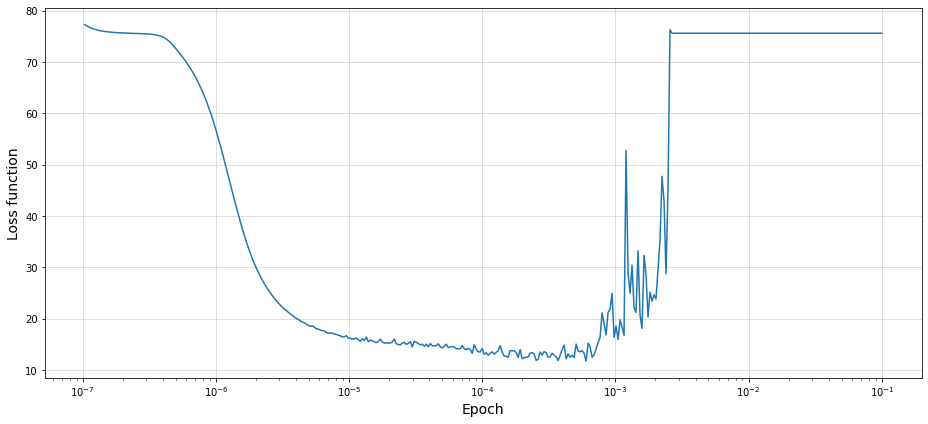

In [ ]:
lr_0=1e-7
epochs=400
lrates=[lr_0*10**(np.log10(10**6)*i/epochs) for i in range(1,epochs+1) ]
plt.figure(figsize=(13,6))
plt.plot(lrates,aux2.history["loss"])
plt.xscale("log")
plt.xlabel("Epoch",fontsize=14)
plt.ylabel("Loss function",fontsize=14)
plt.grid(alpha=0.5)
plt.tight_layout()
#plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/alpha_schedule2.png")

In [ ]:
import time
import json

In [ ]:
print((611*3*3*3*6)/3600, "HORAS")

27.495 HORAS


In [ ]:
#lista_cosas_probar={"interno":[25,35,45],
#                    "pre":[175,110,80],
#                    "activations":[[0,0,0,0,0,0,1,0,0,0,0,0,0],[0,0,0,0,0,1,1,1,0,0,0,0,0],
#                                   [1,0,1,0,0,1,1,1,0,1,0,0,1],[1,0,1,0,0,1,0,1,0,0,1,0,1],
#                                   [1,1,1,1,1,1,0,1,1,1,1,1,1],[1,1,1,1,1,1,1,1,1,1,1,1,1]],
#                    "actreguls":[None,"l1","l2"]} #25,

lista_cosas_probar={"interno":[5,10],
                    "pre":[220],
                    "activations":[[1,1,1,1,1,1,0,0,1,1,1,1,1],[1,1,1,1,1,1,0,1,1,1,1,1,1],
                                   [1,1,1,1,1,0,0,1,1,1,1,1,1],[1,1,1,1,1,1,1,1,1,1,1,1,1],
                                   [1,1,1,1,1,0,0,0,1,1,1,1,1]],
                    "actreguls":[None]} #25,


aux1=json.dumps(lista_cosas_probar)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/parametros4.json","w") as fil:
    fil.write(aux1)

for m,i in enumerate(lista_cosas_probar["interno"]):
    resultados={}
    for j in lista_cosas_probar["pre"]:
        for k in lista_cosas_probar["activations"]:
            for l in lista_cosas_probar["actreguls"]:
                start=time.time()
                print(i,j,k,l,"\n","_____________________","\n")
                autoencoder=create_autoencoder(activationfuns=k,mid_layer=i,prepost_layer=j,activityregul=l)
                autoencoder.compile(optimizer=tf.keras.optimizers.Adam(4e-4),loss='mse')
                hist=autoencoder.fit(x_train,y_train,epochs=80,validation_data=(x_test,y_test))
                resultados[f"{i}, {j}, {k}, {l}"]=hist.history
                stop=time.time()
                print(stop-start,"\n")
    #despues de cada una de estas lo ponemos a guardar
    aux2=json.dumps(resultados)
    with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/resultados4_parte{m+1}.json","w") as fil2:
        fil2.write(aux2)


5 220 [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1] None 
 _____________________ 

Epoch 1/80
444/444 [==============================] - 9s 17ms/step - loss: 62.1614 - val_loss: 34.5496
Epoch 2/80
444/444 [==============================] - 7s 17ms/step - loss: 34.2770 - val_loss: 33.8325
Epoch 3/80
444/444 [==============================] - 7s 17ms/step - loss: 38.3283 - val_loss: 28.8604
Epoch 4/80
444/444 [==============================] - 7s 17ms/step - loss: 27.1638 - val_loss: 28.7681
Epoch 5/80
444/444 [==============================] - 7s 17ms/step - loss: 24.3864 - val_loss: 23.4826
Epoch 6/80
444/444 [==============================] - 7s 17ms/step - loss: 23.4889 - val_loss: 20.6493
Epoch 7/80
444/444 [==============================] - 7s 17ms/step - loss: 23.4274 - val_loss: 21.0682
Epoch 8/80
444/444 [==============================] - 7s 17ms/step - loss: 19.9418 - val_loss: 21.6647
Epoch 9/80
444/444 [==============================] - 7s 17ms/step - loss: 20.7223 - val_loss: 16.9

In [ ]:
ultimos=[resultados1[i]["val_loss"][-1] for i in resultados1]
ultimo_max=np.amax(ultimos)
ultimos_ponderado=[1.6-i/ultimo_max for i in ultimos]
for i,j in zip(ultimos,ultimos_ponderado):
    print(i,j,"\n")

Text(0, 0.5, 'MSE')

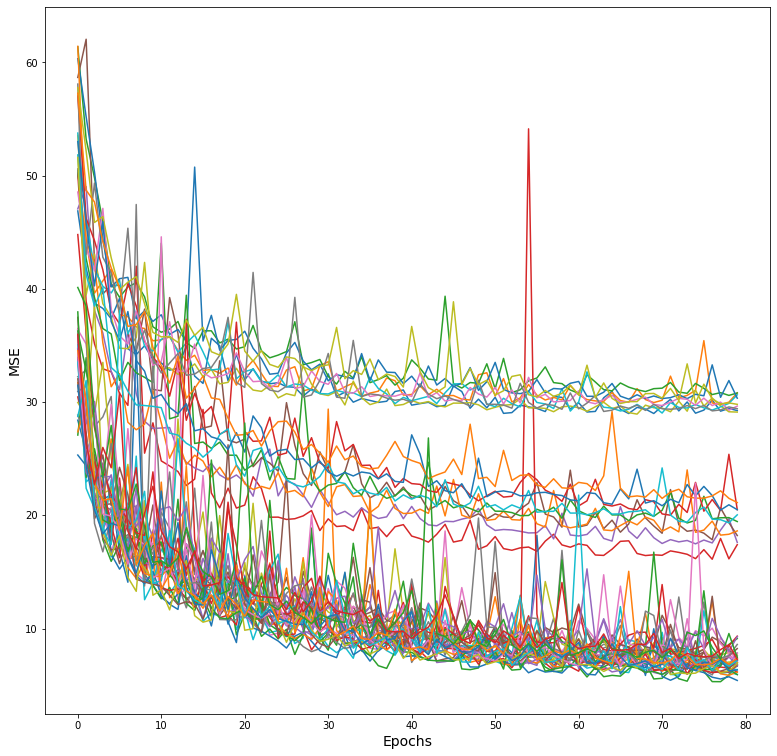

In [ ]:
pos_aux=np.arange(20,9,-(20-9)/15)
indices_sort=np.argsort(ultimos)[::-1]
plt.figure(figsize=(13,13))
for j,i in enumerate(resultados1):
    plt.plot(resultados1[i]["val_loss"],alpha=1,label=i)
    #plt.text(110,pos_aux[indices_sort[j]],i,fontsize=14)
    #plt.arrow(110,pos_aux[j]+0.25,(100-110),(-pos_aux[j]+ultimos[indices_sort[j]]),head_width=0.3,width=0.0005)
plt.xlabel("Epochs",fontsize=14)
plt.ylabel("MSE",fontsize=14)
#plt.ylim([7.8,45])
#plt.xlim([-1.5,120])
#plt.legend(fontsize=15)
#plt.savefig(f"/content/drive/MyDrive/MAIN_TFG/final_results/plot_multipleplots_ultimo11mayo.png")

Text(0, 0.5, 'MSE')

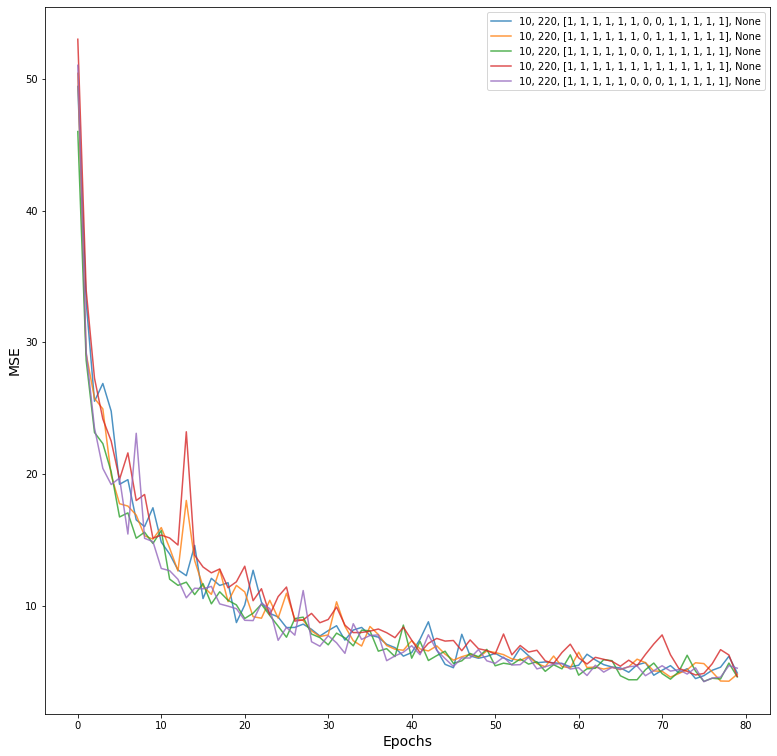

In [ ]:
plt.figure(figsize=(13,13))

for j,i in enumerate(resultados):
    #if "[1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]" in i:
    plt.plot(resultados[i]["loss"],alpha=0.8,label=i)
    #elif "[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]" in i:
    #    plt.plot(resultados[i]["loss"],"r--",alpha=0.7)
plt.legend()
plt.xlabel("Epochs",fontsize=14)
plt.ylabel("MSE",fontsize=14)

In [ ]:
import json
#vamos a guardas las cosas otra ve

#aux1=json.dumps(lista_cosas_probar)
#with open("/content/drive/MyDrive/MAIN_TFG/final_results/parametros2_muchosdatos.json","w") as fil:
#    fil.write(aux1)


#aux2=json.dumps(resultados)
#with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados2_muchosdatos.json","w") as fil2:
#    fil2.write(aux2)
with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/resultados1_parte1.json","r") as json_file:
    resultados1 = json.load(json_file)

with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/resultados1_parte2.json","r") as json_file:
    resultados2 = json.load(json_file)

with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/resultados1_parte3.json","r") as json_file:
    resultados3 = json.load(json_file)

with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/parametros1.json","r") as json_file:
    parametros = json.load(json_file)


Text(0, 0.5, 'MSE')

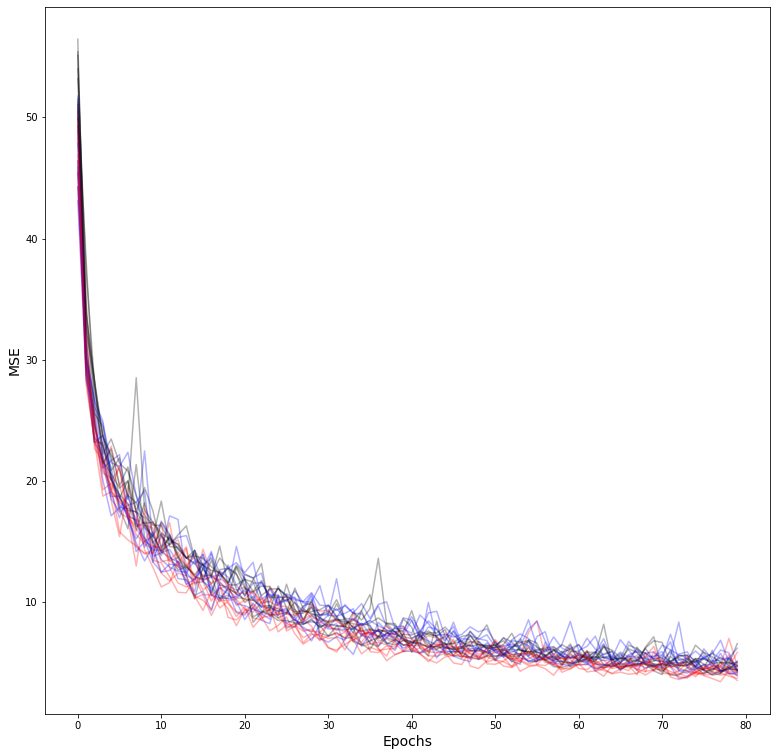

In [ ]:
plt.figure(figsize=(13,13))
for j,i in enumerate(resultados1):
    if "[1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]," in i:
        plt.plot(resultados1[i]["loss"],"r",alpha=0.3)
    elif "[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]," in i:
        plt.plot(resultados1[i]["loss"],"k",alpha=0.3)
    elif "[1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1]," in i:
        plt.plot(resultados1[i]["loss"],"b",alpha=0.3)
        
plt.xlabel("Epochs",fontsize=14)
plt.ylabel("MSE",fontsize=14)

Text(0, 0.5, 'MSE')

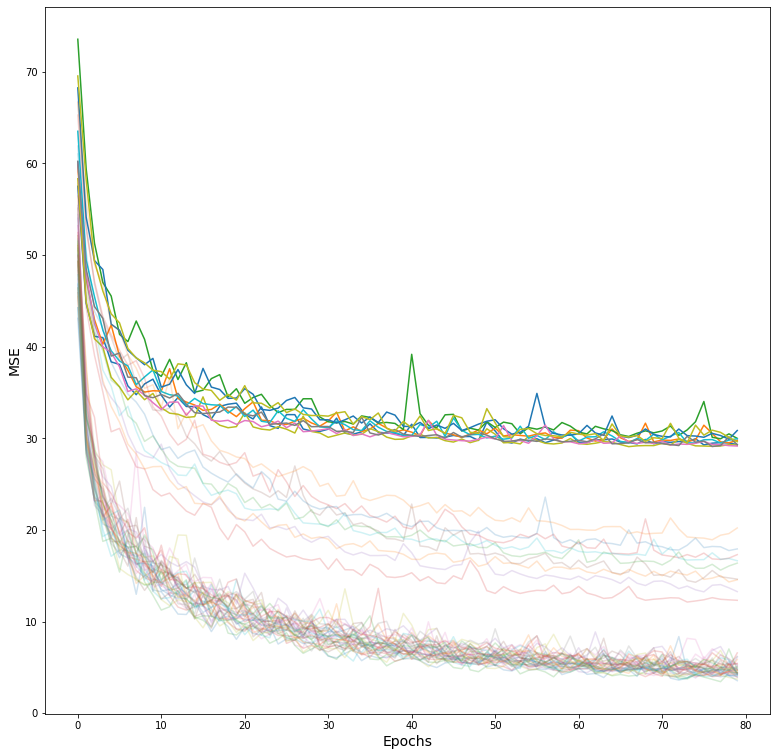

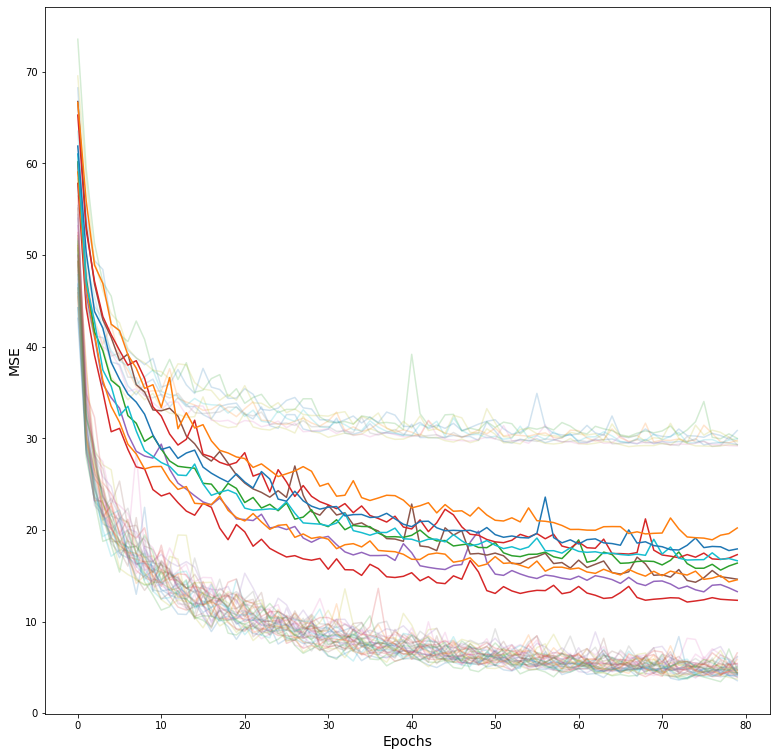

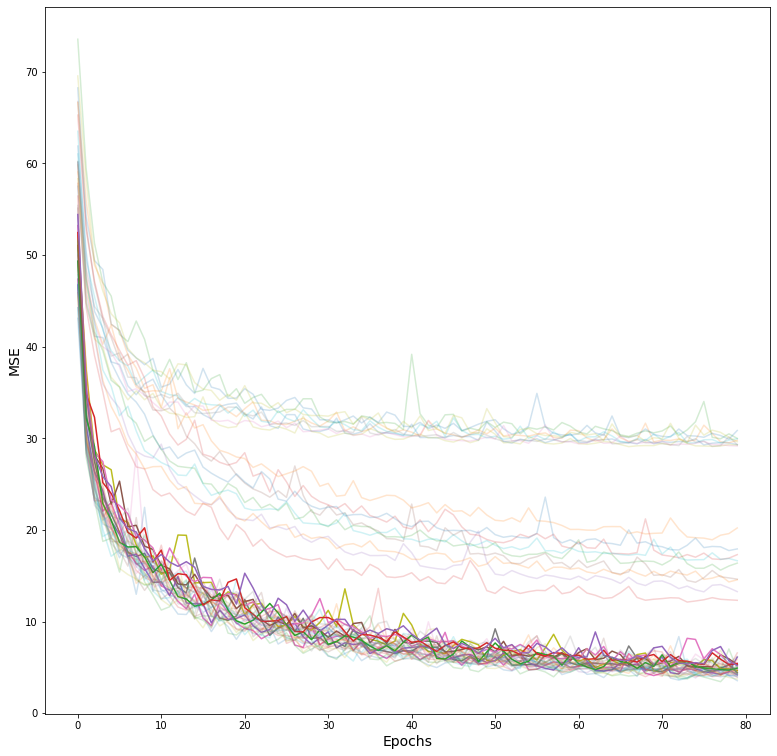

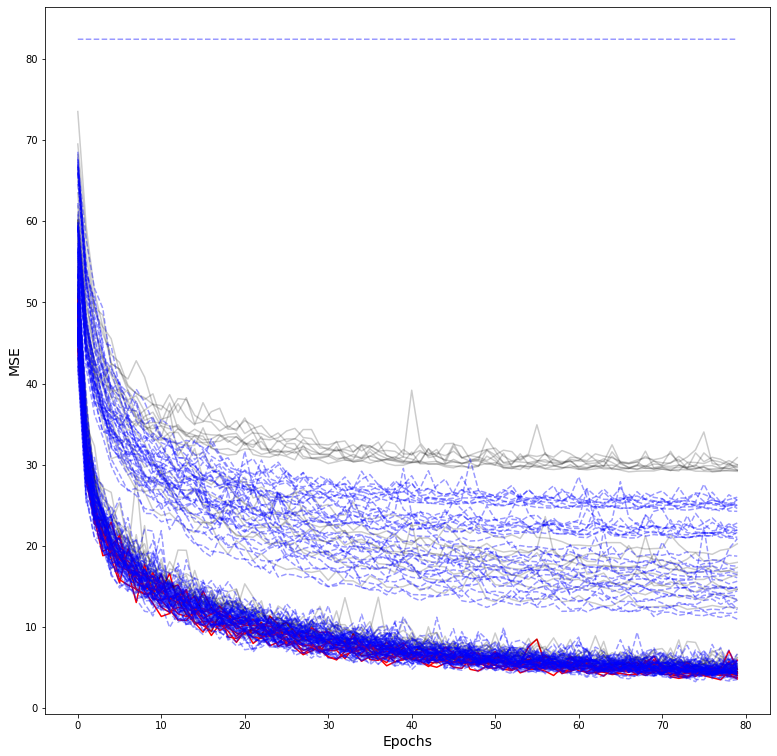

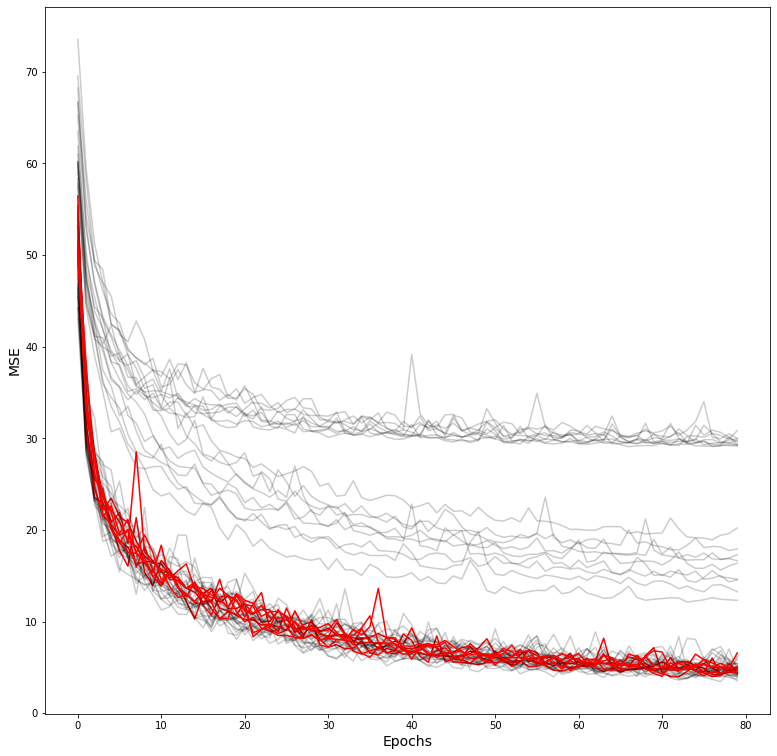

In [ ]:
plt.figure(figsize=(13,13))

for j,i in enumerate(resultados1):
    if "[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]," in i:
        plt.plot(resultados1[i]["loss"],alpha=1)
    else:
        plt.plot(resultados1[i]["loss"],alpha=0.2)
plt.xlabel("Epochs",fontsize=14)
plt.ylabel("MSE",fontsize=14)

plt.figure(figsize=(13,13))
for j,i in enumerate(resultados1):
    if "[0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0]," in i:
        plt.plot(resultados1[i]["loss"],alpha=1)
    else:
        plt.plot(resultados1[i]["loss"],alpha=0.2)
plt.xlabel("Epochs",fontsize=14)
plt.ylabel("MSE",fontsize=14)

plt.figure(figsize=(13,13))
for j,i in enumerate(resultados1):
    if "[1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1]," in i:
        plt.plot(resultados1[i]["loss"],alpha=1)
    else:
        plt.plot(resultados1[i]["loss"],alpha=0.2)
plt.xlabel("Epochs",fontsize=14)
plt.ylabel("MSE",fontsize=14)

plt.figure(figsize=(13,13))
for j,i in enumerate(resultados1):
    if "[1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]," in i:
        plt.plot(resultados1[i]["loss"],"r",alpha=1)
    else:
        plt.plot(resultados1[i]["loss"],"k",alpha=0.2)
for j,i in enumerate(resultados2):
    plt.plot(resultados2[i]["loss"],"b--",alpha=0.4)
for j,i in enumerate(resultados3):
    plt.plot(resultados3[i]["loss"],"b--",alpha=0.4)
plt.xlabel("Epochs",fontsize=14)
plt.ylabel("MSE",fontsize=14)


plt.figure(figsize=(13,13))
for j,i in enumerate(resultados1):
    if "[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]," in i:
        plt.plot(resultados1[i]["loss"],"r",alpha=1)
    else:
        plt.plot(resultados1[i]["loss"],"k",alpha=0.2)
plt.xlabel("Epochs",fontsize=14)
plt.ylabel("MSE",fontsize=14)

In [ ]:
#vamos a entrenar un modelo que comprime a CINCO!!!! elementos centrales, como puede ser estoo....
autoencoder=create_autoencoder(activationfuns=[1,1,1,1,1,1,0,1,1,1,1,1,1],mid_layer=45,prepost_layer=220,activityregul=None)
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(4e-4),loss='mse')
history=autoencoder.fit(x_train,y_train,epochs=100,validation_data=(x_test,y_test))

Epoch 1/100
444/444 [==============================] - 25s 19ms/step - loss: 56.5600 - val_loss: 29.7960
Epoch 2/100
444/444 [==============================] - 8s 17ms/step - loss: 31.3540 - val_loss: 23.9535
Epoch 3/100
444/444 [==============================] - 8s 17ms/step - loss: 23.5395 - val_loss: 22.2772
Epoch 4/100
444/444 [==============================] - 8s 17ms/step - loss: 21.5341 - val_loss: 16.6618
Epoch 5/100
444/444 [==============================] - 8s 17ms/step - loss: 19.7120 - val_loss: 16.3362
Epoch 6/100
444/444 [==============================] - 8s 17ms/step - loss: 18.5522 - val_loss: 16.9329
Epoch 7/100
444/444 [==============================] - 8s 17ms/step - loss: 14.6115 - val_loss: 16.8930
Epoch 8/100
444/444 [==============================] - 8s 17ms/step - loss: 16.3153 - val_loss: 17.8447
Epoch 9/100
444/444 [==============================] - 8s 17ms/step - loss: 15.4915 - val_loss: 13.6190
Epoch 10/100
444/444 [==============================] - 8s 17ms

In [ ]:
#autoencoder.save("/content/drive/MyDrive/MAIN_TFG/final_results/autoencoder_buenosresultados_5.h5")

In [ ]:
#voy a ponerlo a entrenar con muchisimos datos y lo dejo entrenando
#cargamos la data
save_dir="/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21"
base_dir="/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21"
autoencoder.compile(optimizer='adam', loss='mse')
stop=tf.keras.callbacks.EarlyStopping(patience=15)
h_m=[]
for i in range(1,18):
    if i==9:
        autoencoder.compile(optimizer=tf.keras.optimizers.Adam(5e-6), loss='mse')
    elif i==13:
        autoencoder.compile(optimizer=tf.keras.optimizers.Adam(1e-6), loss='mse')
    elif i==16:
        autoencoder.compile(optimizer=tf.keras.optimizers.Adam(5e-7), loss='mse')

    out=get_data_autoencoder(base_dir,tels=[4,5,6,11],runs=[i],num_runs=[1,4,4,4,4,4,4])
    #la salida el out[0] tiene que tener shape 52,92 y ahora tiene 55 93
    out_salida=out[0]
    out_salida=out_salida[:,1:,2:-1]
    in_entrada=out[1]
    #in_entrada=in_entrada[:,1:,1:]
    x_train ,x_test=train_test_split(in_entrada,test_size=0.2,random_state=42)
    y_train ,y_test=train_test_split(out_salida,test_size=0.2,random_state=42)
    del out, out_salida
    hist=autoencoder.fit(x_train,y_train,epochs=55,validation_data=(x_test,y_test),callbacks=[stop])
    h_m.append(hist)

#autoencoder.save(f"{save_dir}/autoencoder_ground_truth_2_largetrain_out5292.h5")
#encoder.save(f"{save_dir}/encoder_ground_truth_2_largetrain.h5")

In [ ]:
#autoencoder=tf.keras.models.load_model("/content/drive/MyDrive/MAIN_TFG/final_results/autoencoder_buenosresultados_3_regularized.h5")

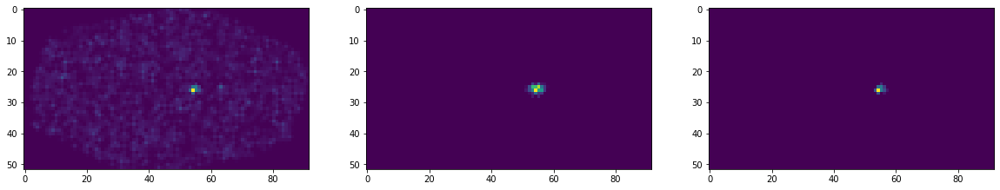

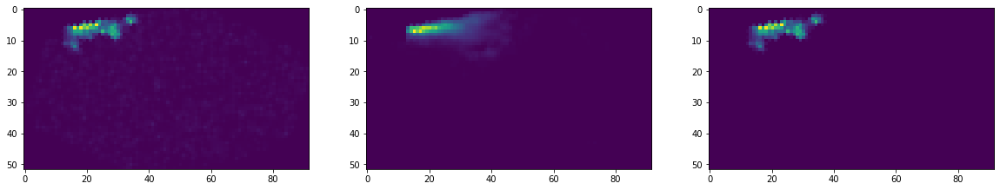

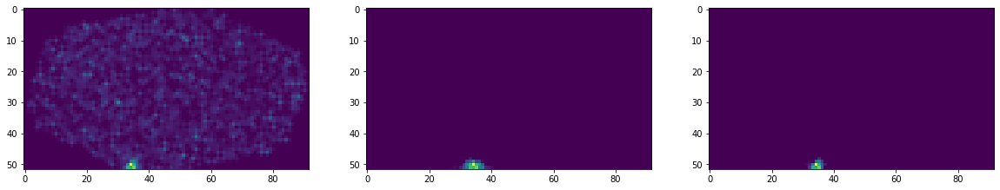

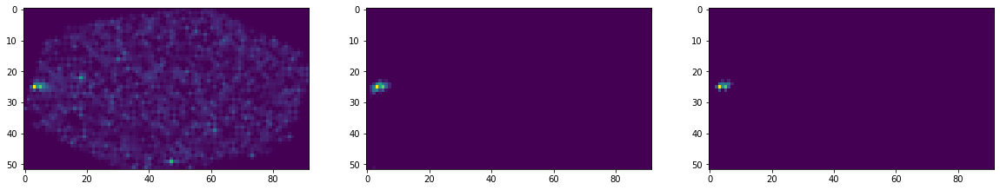

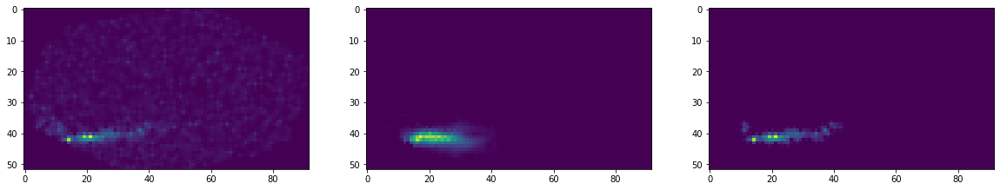

...

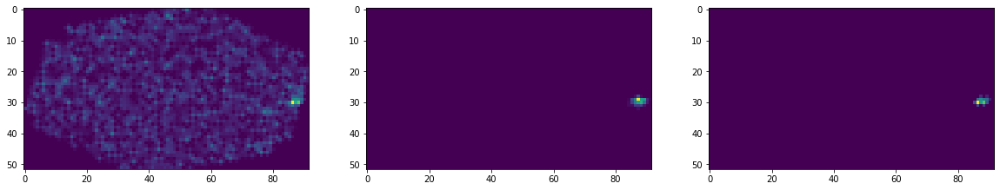

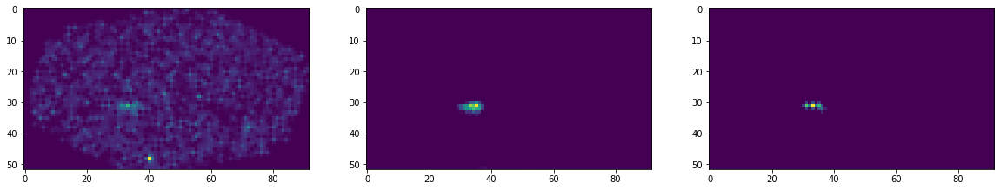

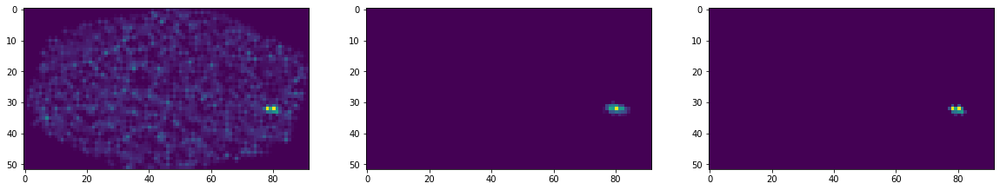

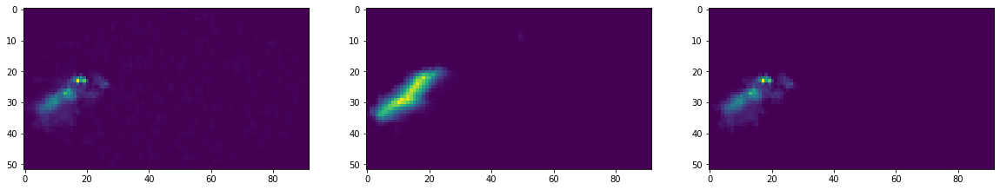

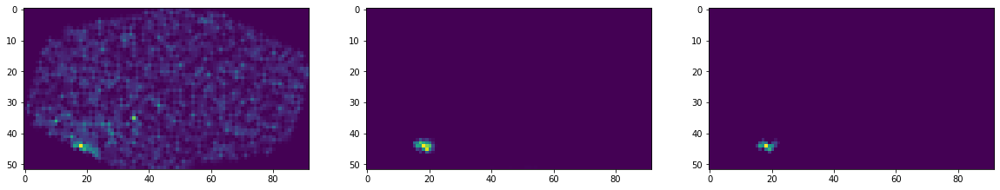

In [ ]:
#predict_encod=encoder.predict(x_test[:78])
predict=autoencoder.predict(x_test[:78])
for i in range(60,78):
    plt.figure(figsize=(20,23))
    plt.subplot(2,3,1)
    plt.imshow(x_test[i][:,:,0])
    plt.subplot(2,3,2)
    plt.imshow(predict[i][:,:,0])
    plt.subplot(2,3,3)
    plt.imshow(y_test[i][:,:,0])
    #plt.subplot(2,3,5)
    #plt.imshow(predict_encod[i].reshape((1,30)))
    #plt.yticks([])
    #plt.xticks([])
    #plt.tight_layout()

#plt.figure(figsize=(13,13))
#plt.imshow(predict_encod)

#Ultima prueba Autoencoders [PUTO FRACASO]
En la que congelo media capaintermedia y luego la pongo a entrenar, asi pretendo que aprenda mas detalles eso.

In [ ]:
#autoencoder=create_autoencoder(activationfuns=[1,1,1,1,1,1,0,1,1,1,1,1,1],mid_layer=10,prepost_layer=220,activityregul=None)

In [ ]:
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(1e-5),loss='mse')
history=autoencoder.fit(x_train,y_train,epochs=2,validation_data=(x_test,y_test))

Epoch 1/2
444/444 [==============================] - 8s 17ms/step - loss: 2.9018 - val_loss: 5.7359
Epoch 2/2
444/444 [==============================] - 7s 17ms/step - loss: 2.8382 - val_loss: 5.7374


In [ ]:
encoder1,decoder1=create_autoencoder(activationfuns=[1,1,1,1,1,1,0,1,1,1,1,1,1],mid_layer=10,prepost_layer=220,activityregul=None,return_iner2=True)
encoder2,decoder2=create_autoencoder(activationfuns=[1,1,1,1,1,1,0,1,1,1,1,1,1],mid_layer=17,prepost_layer=220,activityregul=None,return_iner1=True)

In [ ]:
#ahora creamos un hibrido monstruoso
input=tf.keras.Input(shape=(52,92,1))
x=encoder1(input)
x1=tf.keras.layers.Dense(10,activation="relu")(x)
x2=tf.keras.layers.Dense(7,activation="relu")(x)
x=tf.keras.layers.Concatenate()([x1,x2])
final=decoder2(x)
autoencoder_mix=tf.keras.Model(inputs=input,outputs=final)

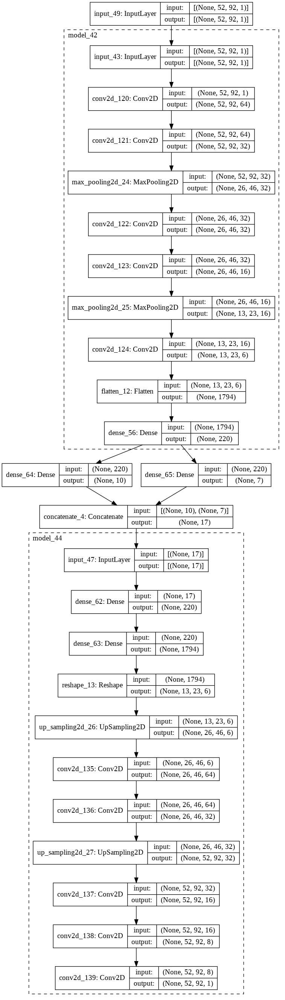

In [ ]:
tf.keras.utils.plot_model(autoencoder_mix,show_shapes=1,expand_nested=1)

In [ ]:
autoencoder.layers[1].layers[-1].get_weights()[0].shape

(220, 10)

In [ ]:
autoencoder.layers[1].layers

In [ ]:
autoencoder_mix.compile(optimizer=tf.keras.optimizers.Adam(2e-2),loss='mse')

for i, j in enumerate(autoencoder.layers[1].layers[:-1]):
    #autoencoder_mix.layers[1].layers[i].set_weights(j.get_weights())
    autoencoder_mix.layers[1].layers[i].trainable=True
for i, j in enumerate(autoencoder.layers[2].layers[2:]):
    #autoencoder_mix.layers[5].layers[i+2].set_weights(j.get_weights())
    autoencoder_mix.layers[5].layers[i+2].trainable=True

#autoencoder_mix.layers[2].set_weights(autoencoder.layers[1].layers[-1].get_weights())
autoencoder_mix.layers[2].trainable=True

In [ ]:
autoencoder_mix.compile(optimizer=tf.keras.optimizers.Adam(1e-3),loss='mse')

history=autoencoder_mix.fit(x_train,y_train,epochs=10,validation_data=(x_test,y_test))

Epoch 1/10
444/444 [==============================] - 4s 8ms/step - loss: 18.6623 - val_loss: 25.9895
Epoch 2/10
444/444 [==============================] - 4s 8ms/step - loss: 17.0705 - val_loss: 26.0247
Epoch 3/10
444/444 [==============================] - 4s 8ms/step - loss: 17.4033 - val_loss: 25.9969
Epoch 4/10
444/444 [==============================] - 4s 8ms/step - loss: 19.0699 - val_loss: 25.9445
Epoch 5/10
444/444 [==============================] - 4s 8ms/step - loss: 18.4872 - val_loss: 25.9555
Epoch 6/10
444/444 [==============================] - 4s 8ms/step - loss: 17.7774 - val_loss: 25.8521
Epoch 7/10
444/444 [==============================] - 4s 8ms/step - loss: 18.8251 - val_loss: 25.8988
Epoch 8/10
444/444 [==============================] - 4s 8ms/step - loss: 17.5790 - val_loss: 25.8890
Epoch 9/10
444/444 [==============================] - 4s 8ms/step - loss: 18.6106 - val_loss: 25.9618
Epoch 10/10
444/444 [==============================] - 4s 8ms/step - loss: 19.2003

In [ ]:
autoencoder.evaluate(x_train,y_train)

444/444 [==============================] - 2s 5ms/step - loss: 2.8080


2.8080203533172607

In [ ]:
autoencoder2.evaluate(x_train,y_train)

444/444 [==============================] - 2s 5ms/step - loss: 83.5765


82.47059631347656

#Intento de recosntruir a partir de modelos

In [ ]:
encoder=tf.keras.Sequential()
encoder.add(tf.keras.Input(shape=(52,92,1)))
for i in autoencoder.layers[1:12]:
    encoder.add(i)
decoder=tf.keras.Sequential()
decoder.add(tf.keras.layers.Input(shape=(35)))
for i in autoencoder.layers[12:]:
    decoder.add(i)


In [ ]:
decoder.layers

In [ ]:
for j,i in enumerate(autoencoder.layers[1:12]):
    encoder.layers[j].set_weights(i.get_weights())

In [ ]:
for j,i in enumerate(autoencoder.layers[12:]):
    decoder.layers[j].set_weights(i.get_weights())

In [ ]:
encoder.summary()

Model: "sequential_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_11 (Conv2D)           (None, 52, 92, 64)        1664      
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 52, 92, 32)        51232     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 26, 46, 32)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 26, 46, 16)        4624      
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 26, 46, 8)         1160      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 13, 23, 8)         0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 13, 23, 8)       

In [ ]:
decoder.summary()

Model: "sequential_40"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 100)               3600      
_________________________________________________________________
dense_7 (Dense)              (None, 1794)              181194    
_________________________________________________________________
reshape_1 (Reshape)          (None, 13, 23, 6)         0         
_________________________________________________________________
up_sampling2d_2 (UpSampling2 (None, 26, 46, 6)         0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 26, 46, 32)        1760      
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 26, 46, 32)        9248      
_________________________________________________________________
up_sampling2d_3 (UpSampling2 (None, 52, 92, 32)      

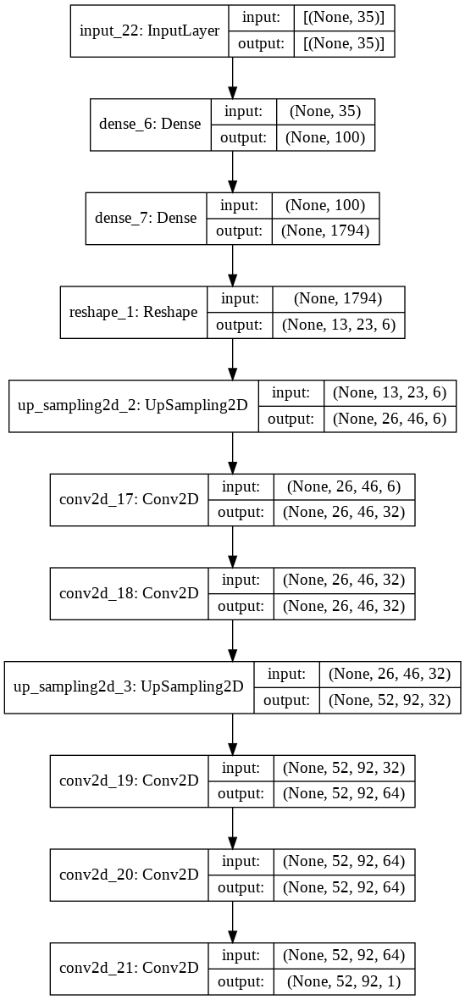

In [ ]:
tf.keras.utils.plot_model(decoder,show_shapes=1)

In [ ]:
aux_out=encoder.predict(x_train[3][np.newaxis,...])
aux_out2=decoder.predict(aux_out)

In [ ]:
aux_out

array([[ 2.0436546e-01,  1.8090768e-01,  4.0857963e-02,  7.7508941e-02,
         6.8301417e-02,  2.2408213e-02, -3.5112143e-02, -6.3319735e-02,
        -2.9890239e-04,  2.9825225e-02,  4.2725095e-01, -4.3487084e-01,
        -7.4680366e-02,  1.9507672e-01,  2.3941307e-01,  2.1295813e-01,
         2.8006327e-01,  6.2695503e-02, -2.0995960e-01,  3.8784599e-01,
         4.6678457e-01, -2.9585460e-01,  4.8445612e-02, -2.4442889e-02,
        -2.8779611e-01,  7.9102710e-02,  4.5596741e-02, -6.0985632e-02,
        -2.3583901e-01,  1.4104690e-01, -3.8451269e-02, -4.4858080e-01,
         2.6184356e-01,  1.5373117e-01,  1.8665303e-01]], dtype=float32)

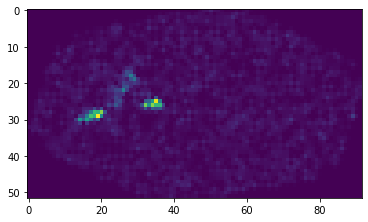

In [ ]:
plt.imshow(x_train[3][:,:,0])

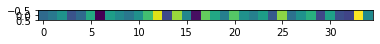

In [ ]:
plt.imshow(aux_out)

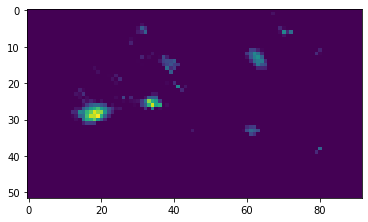

In [ ]:
plt.imshow(aux_out2[0][:,:,0])

# Resultados sacados de autoencoders

In [ ]:
import json

In [ ]:
#archivos
os.listdir("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder")

['parametros1.json',
 'resultados1_parte1.json',
 'resultados1_parte2.json',
 'resultados1_parte3.json',
 'parametros2_partiunicaint15.json',
 'resultados2_parteunicaint15.json',
 'parametros3.json',
 'resultados3_parte1.json',
 'resultados3_parte2.json']

In [ ]:
#cargamos los resultados
with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/resultados1_parte1.json","r") as json_file:
    resultados1_1 = json.load(json_file)

with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/resultados1_parte2.json","r") as json_file:
    resultados1_2 = json.load(json_file)

with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/resultados1_parte3.json","r") as json_file:
    resultados1_3 = json.load(json_file)

with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/parametros1.json","r") as json_file:
    parametros1 = json.load(json_file)

with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/resultados2_parteunicaint15.json","r") as json_file:
    resultados2 = json.load(json_file)

with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/parametros2_partiunicaint15.json","r") as json_file:
    parametros2 = json.load(json_file)

with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/resultados3_parte1.json","r") as json_file:
    resultados3_1 = json.load(json_file)

with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/resultados3_parte2.json","r") as json_file:
    resultados3_2 = json.load(json_file)

with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/parametros3.json","r") as json_file:
    parametros3 = json.load(json_file)



In [ ]:
combinaciones_labels=[]
combinaciones_labels.extend(resultados1_1.keys())
combinaciones_labels.extend(resultados1_2.keys())
combinaciones_labels.extend(resultados1_3.keys())

combinaciones_labels.extend(resultados2.keys())

combinaciones_labels.extend(resultados3_1.keys())
combinaciones_labels.extend(resultados3_2.keys())
print(len(combinaciones_labels))

184


In [ ]:
combinaciones_labels

In [ ]:
resultados=resultados1_1
resultados.update(resultados1_2)
resultados.update(resultados1_3)

resultados.update(resultados2)

resultados.update(resultados3_1)
resultados.update(resultados3_2)
len(resultados)

184

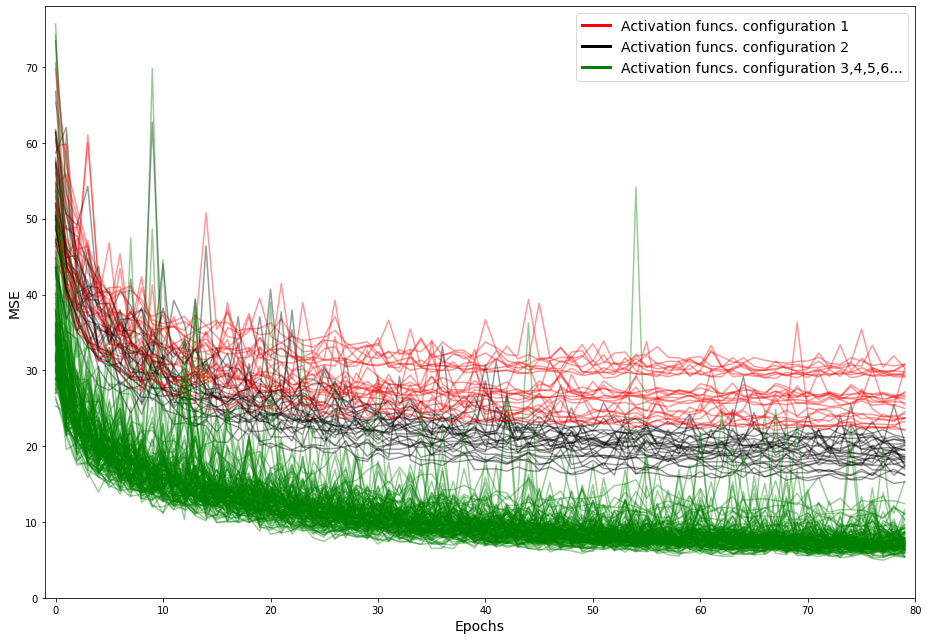

In [ ]:
#primer resultado
from matplotlib.lines import Line2D

custom_lines = [Line2D([0], [0], color="r", lw=3),
                Line2D([0], [0], color="k", lw=3),
                Line2D([0], [0], color="g", lw=3)]

plt.figure(figsize=(13,9))
for j,i in enumerate(resultados):
    if "[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]," in i:
        plt.plot(resultados[i]["val_loss"],"r",alpha=0.4)
    elif "[0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0]," in i:
        plt.plot(resultados[i]["val_loss"],"k",alpha=0.4)
    else:
        plt.plot(resultados[i]["val_loss"],"g",alpha=0.4)
        
plt.legend(custom_lines,['Activation funcs. configuration 1','Activation funcs. configuration 2',
                         'Activation funcs. configuration 3,4,5,6...'],fontsize=14)
plt.xlabel("Epochs",fontsize=14);
plt.xlim([-1,80])
plt.ylim([0,78])
plt.ylabel("MSE",fontsize=14);
plt.tight_layout()
#plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/resultados_autoencoder_plot_actsfuncs_2.png")

In [ ]:
raw_last=[]
for i in resultados:
    raw_last.append(np.mean(resultados[i]["val_loss"][-5:]))
indices=list(resultados.keys())

In [ ]:
raw_sort=sorted(raw_last)
indices_sorted=np.argsort(raw_last)


In [ ]:
aux=[]
for i in indices_sorted[:10]:
    aux.append(indices[i])
    print(indices[i])

45, 175, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None
25, 110, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None
35, 110, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None
35, 175, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None
25, 175, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None
45, 110, [1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1], None
25, 175, [1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1], None
45, 110, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None
35, 175, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], l2
25, 110, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], None


In [ ]:
for i in range(len(aux)):
    print(aux[i],aux2[i])

45, 175, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None 45, 175, configuration 4, None
25, 110, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None 25, 110, configuration 4, None
35, 110, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None 35, 110, configuration 4, None
35, 175, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None 35, 175, configuration 4, None
25, 175, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None 25, 175, configuration 4, None
45, 110, [1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1], None 45, 110, configuration 3, None
25, 175, [1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1], None 25, 175, configuration 3, None
45, 110, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None 45, 110, configuration 4, None
35, 175, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], l2 35, 175, configuration 4, l2
25, 110, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], None 25, 110, configuration 5, None


In [ ]:
aux2=[]

a=[ "[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]","[0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0]",
    "[1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1]","[1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1]",
    "[1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]"]
for i in aux:
    done=False
    for j,k in enumerate(a):
        if k in i:
            aux2.append(i.replace(k,f"configuration {1+j}"))
            done=True
    if not done:
        print("Problema")

In [ ]:
import matplotlib.transforms as a
zona=a.Bbox([[0,0],[84,86]])

25, 175, [1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1], None
25, 175, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None
25, 110, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None
25, 110, [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], None
35, 175, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None
35, 175, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], l2
35, 110, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None
45, 175, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None
45, 110, [1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1], None
45, 110, [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], None


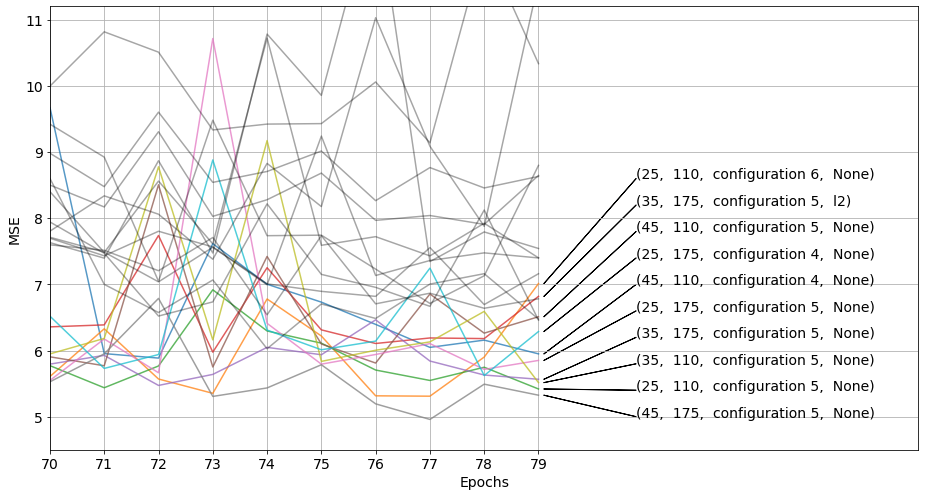

In [ ]:
raw_sort_last=[]
for i in aux:
    raw_sort_last.append(resultados[i]["val_loss"][-1])
raw_sort_last=sorted(raw_sort_last)


plt.figure(figsize=(13,7))
for j,i in enumerate(resultados):
    if i in aux:
        print(i)
        plt.plot(resultados[i]["val_loss"],alpha=0.75)
    elif "15," in i:
        plt.plot(resultados[i]["val_loss"],"k",alpha=0.35)
#plot eamos las flechas y las labels
pos_texto_x=np.ones(10)*80.8
pos_texto_y=np.arange(5,9,(9-5)/10)



for j,i in enumerate(aux2):
    text_aux=i.split(",")
    plt.text(pos_texto_x[j],pos_texto_y[j],f"({text_aux[0]}, {text_aux[1]}, {text_aux[2]}, {text_aux[-1]})",fontsize=14)
    plt.arrow(pos_texto_x[j],pos_texto_y[j],(-pos_texto_x[j]+79.1),(-pos_texto_y[j]+raw_sort_last[j]))


plt.xlabel("Epochs",fontsize=14);
plt.xlim([70,86])
plt.ylim([4.5,11.2])
plt.xticks([70,71,72,73,74,75,76,77,78,79],fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel("MSE",fontsize=14);
plt.tight_layout()
plt.grid(b=1)
#plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/resultados_autoencoder_plot_10_better_2.png")

In [ ]:
#ejemplito de como reconstruye un mismo ejemplo
opciones=[5,10,15,20,25,30,35,40,45,50,55,60]

for j,i in enumerate(opciones):
    autoencoder=create_autoencoder(activationfuns=[1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1],mid_layer=i,prepost_layer=110,activityregul=None)
    autoencoder.compile(optimizer=tf.keras.optimizers.Adam(4e-4),loss='mse')
    hist=autoencoder.fit(x_train,y_train,epochs=90,validation_data=(x_test,y_test))
    autoencoder.compile(optimizer=tf.keras.optimizers.Adam(1e-5),loss='mse')
    autoencoder.fit(x_train,y_train,epochs=20,validation_data=(x_test,y_test))
    #autoencoder.save(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/autoencoder_{i}_mid.h5")

Epoch 1/90
444/444 [==============================] - 9s 18ms/step - loss: 68.4055 - val_loss: 38.3352
Epoch 2/90
444/444 [==============================] - 7s 16ms/step - loss: 41.8975 - val_loss: 27.6681
Epoch 3/90
444/444 [==============================] - 7s 16ms/step - loss: 35.0635 - val_loss: 28.4611
Epoch 4/90
444/444 [==============================] - 7s 16ms/step - loss: 27.3209 - val_loss: 28.8077
Epoch 5/90
444/444 [==============================] - 7s 16ms/step - loss: 25.3468 - val_loss: 25.2849
Epoch 6/90
444/444 [==============================] - 7s 16ms/step - loss: 23.6083 - val_loss: 22.6281
Epoch 7/90
444/444 [==============================] - 7s 16ms/step - loss: 22.1323 - val_loss: 19.2657
Epoch 8/90
444/444 [==============================] - 7s 16ms/step - loss: 19.9485 - val_loss: 20.2055
Epoch 9/90
444/444 [==============================] - 7s 16ms/step - loss: 17.9156 - val_loss: 22.5097
Epoch 10/90
444/444 [==============================] - 7s 16ms/step - los

In [ ]:
#vamos a cargar los modelos 
modelos={}
keys=np.arange(5,55,5)
for i in keys:
    modelos[str(i)]=tf.keras.models.load_model(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/autoencoder_{i}_mid.h5")

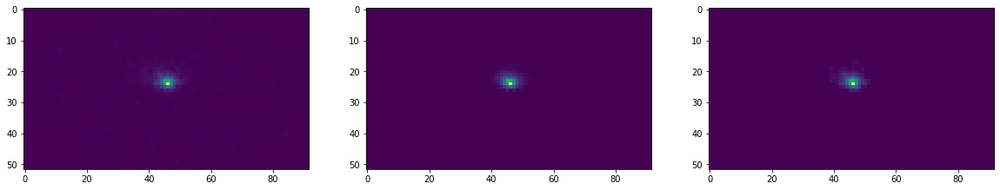

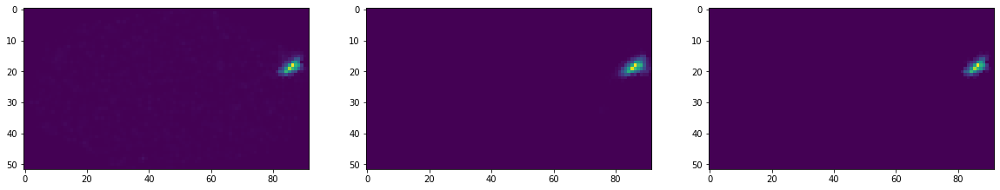

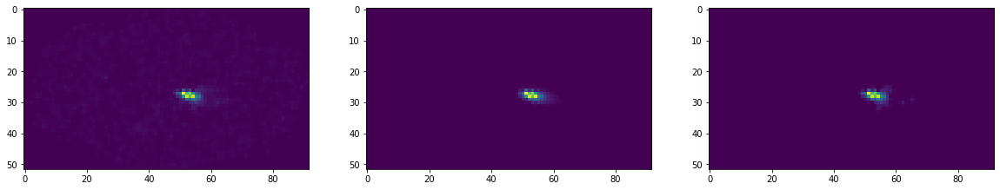

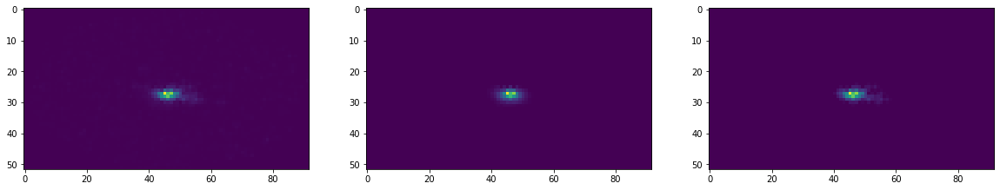

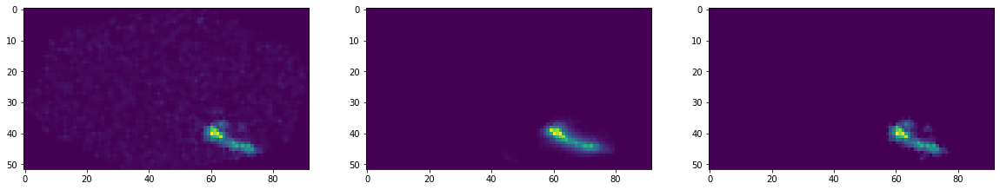

...

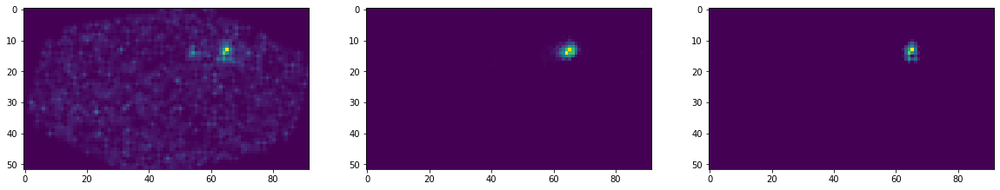

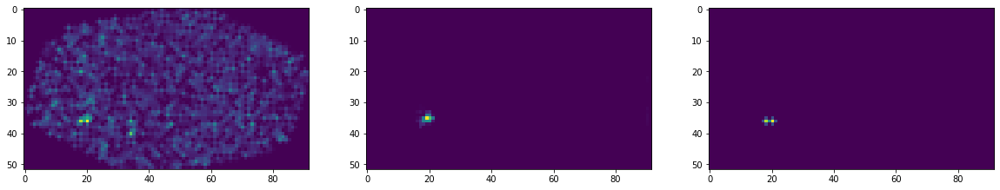

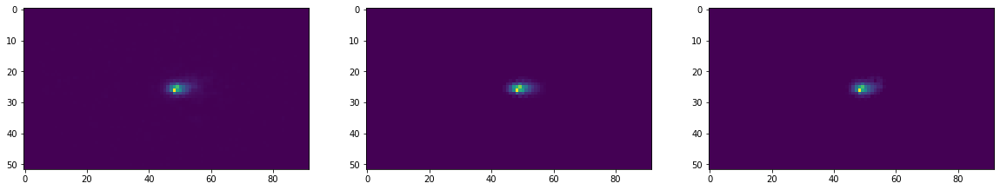

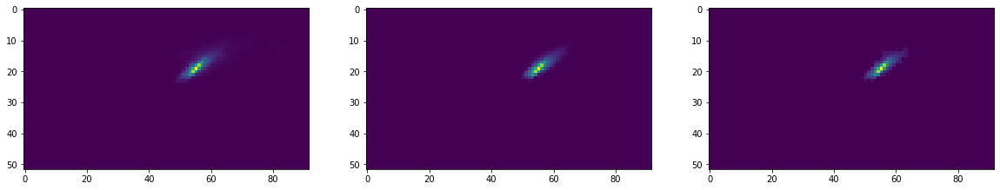

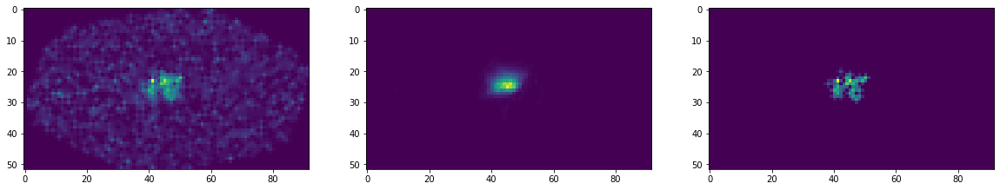

In [ ]:
predict=modelos["50"].predict(x_test[100:198])
for i in range(80,98):
    plt.figure(figsize=(20,23))
    plt.subplot(2,3,1)
    plt.imshow(x_test[100+i][:,:,0])
    plt.subplot(2,3,2)
    plt.imshow(predict[i][:,:,0])
    plt.subplot(2,3,3)
    plt.imshow(y_test[100+i][:,:,0])

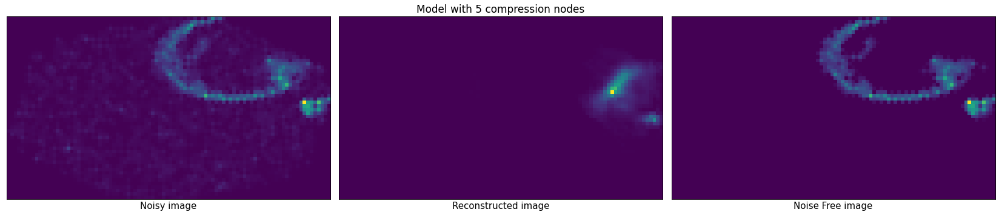

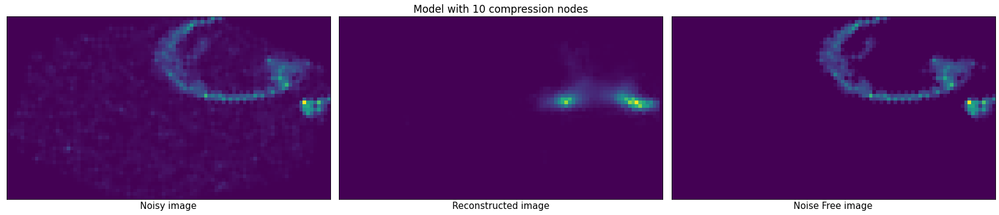

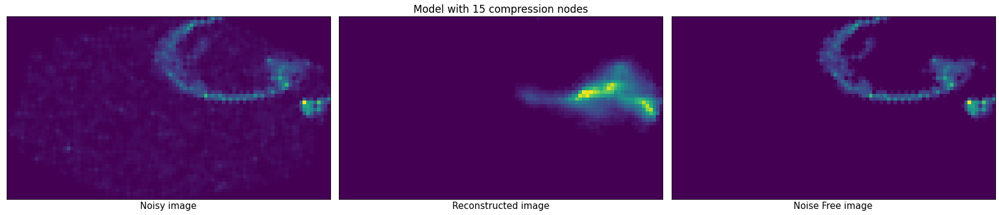

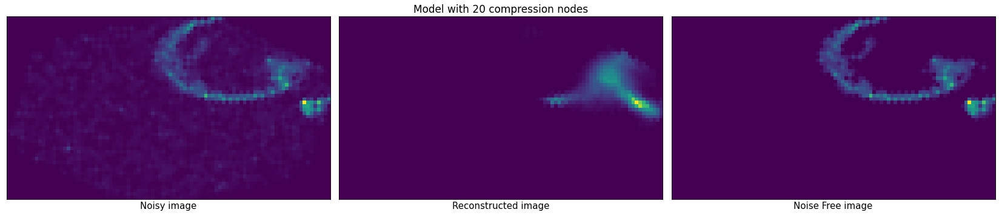

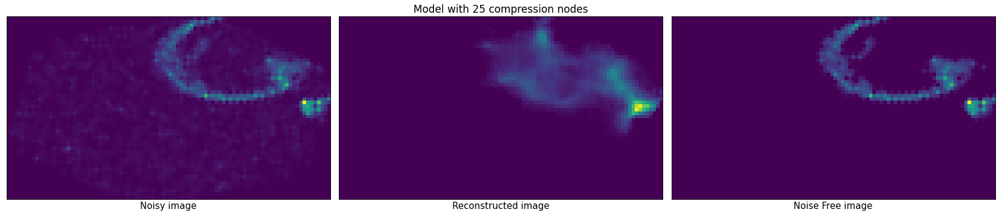

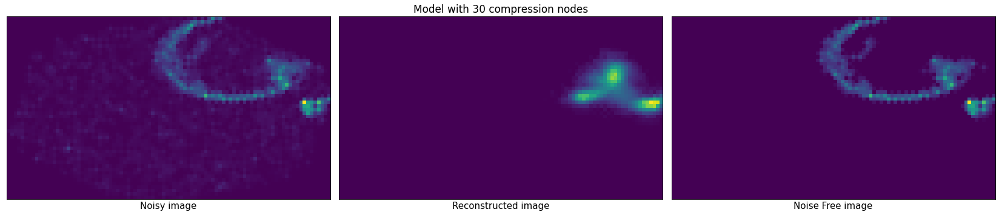

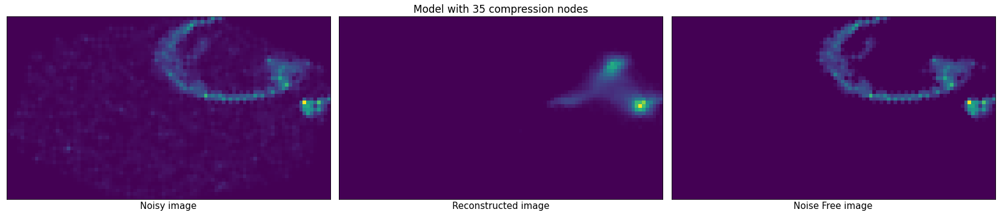

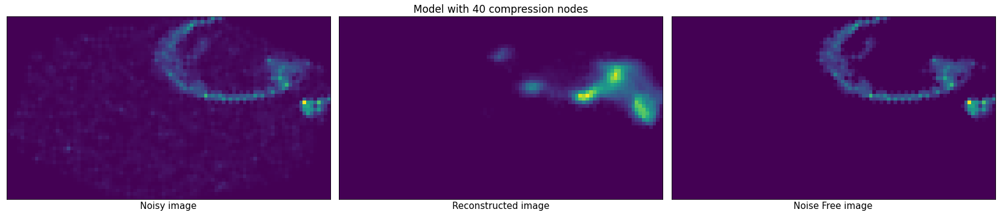

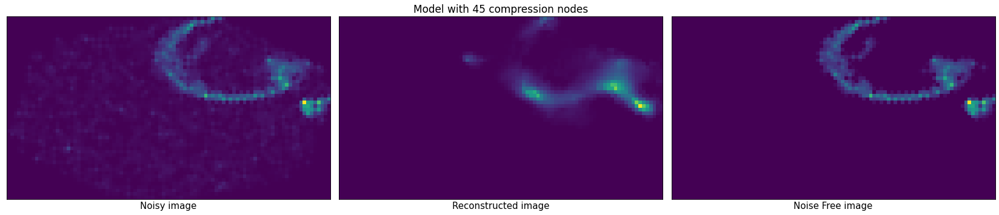

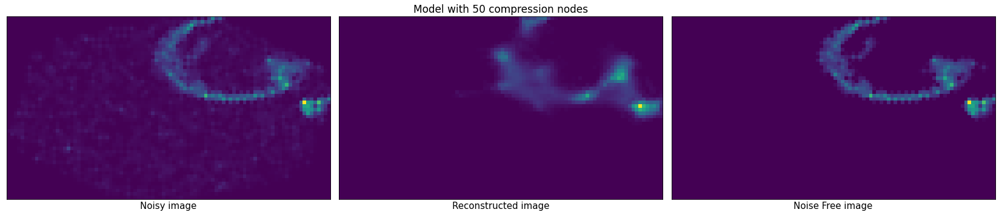

In [ ]:
i=85
for j in keys:
    predict=modelos[str(j)].predict(x_test[100:198])
    plt.figure(figsize=(23,6))
    plt.subplot(1,3,1)
    plt.imshow(x_test[100+i][:,:,0])
    plt.xlabel("Noisy image",fontsize=15)
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1,3,2)
    plt.title(f"Model with {j} compression nodes",fontsize=17)
    plt.imshow(predict[i][:,:,0])
    plt.xlabel("Reconstructed image",fontsize=15)
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1,3,3)
    plt.imshow(y_test[100+i][:,:,0])
    plt.xlabel("Noise Free image",fontsize=15)
    plt.xticks([])
    plt.yticks([])
    
    plt.tight_layout()
    plt.savefig(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/autoencoder_{j}_reconstruccion1.png")

0
1
2
3
4
5
6


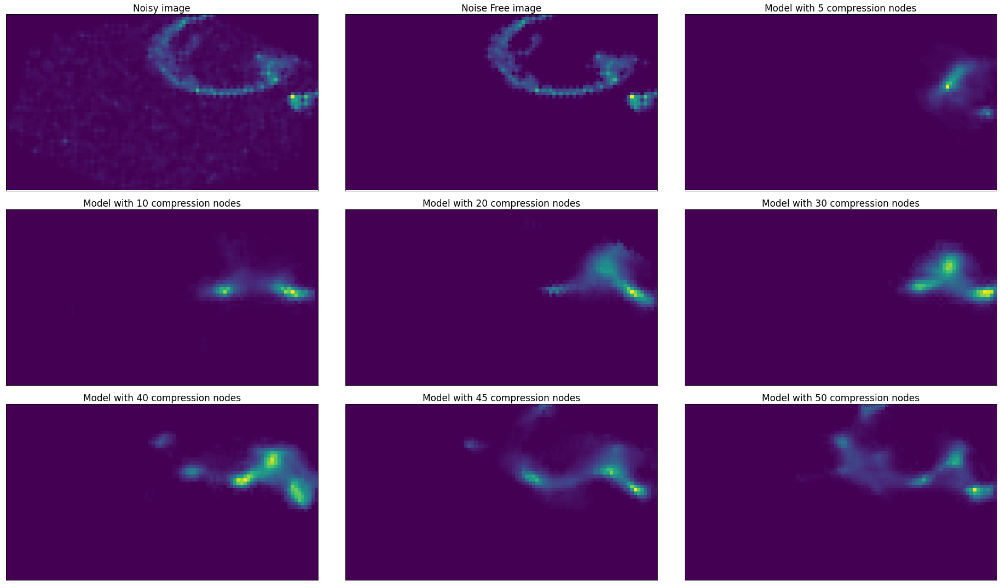

In [ ]:
plt.figure(figsize=(26,15))

i=85
plt.subplot(3,3,2)
plt.imshow(y_test[100+i][:,:,0])
plt.title("Noise Free image",fontsize=17)
plt.xticks([])
plt.yticks([])
plt.subplot(3,3,1)
plt.imshow(x_test[100+i][:,:,0])
plt.title("Noisy image",fontsize=17)
plt.xticks([])
plt.yticks([])
for k,j in enumerate([5,10,20,30,40,45,50]):
    predict=modelos[str(j)].predict(x_test[100:198])
    print(k)
    plt.subplot(3,3,k+3)
    plt.title(f"Model with {j} compression nodes",fontsize=17)
    plt.imshow(predict[i][:,:,0])
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
plt.savefig(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/autoencoder_reconstrucciontotal.png")

#probamos con el PCA Y TSNE

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


In [ ]:
data=encoder.predict(x_train)
data.shape

(16751, 20)

In [ ]:
pca = PCA(n_components=3)
pca_result = pca.fit_transform(data)
pca_one = pca_result[:,0]
pca_two = pca_result[:,1] 
pca_three = pca_result[:,2]
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))


Explained variation per principal component: [0.09732859 0.08453738 0.0734926 ]


# Carga de datos Classificador:

In [ ]:
#funciones para la carga de datos

def get_common_events(npy_dir_base,tels=None,run=None):
    #esta funcion nos sirve para obtener los indices de eventos comunes tal que 
    #esto es necesario para que las imagenes sean del mismo evento

    #TENEMOS QUE MIRAR PARA UNA RUN, TODOS LOS TELESCOPIOS QUE NOS INTERESEN,
    #SIN IMPORTAR EL ELEMENTO, SOLO LOS TELESCOPIOS DE LA RUN Y EL EMENTO QUE TOQUE
    lista=[]
    if (type(tels)==list) or (type(tels)==np.ndarray):
        #primero miramos a ver si es una lista los telescopios
        for i in tels:
            regex=f"{npy_dir_base}/id_eventos_*_tel_{i}_run_{str(run).zfill(2)}.npy"
            aux=glob.glob(regex)
            if aux:
                lista.append(np.load(aux[0]))
            else:
                #si no lo encuentra entonces nos saldra mal la cosa
                print("ERROR")
                print(f"Para {os.path.basename(npy_dir_base)} no se encuentra el {os.path.basename(regex)}.")
                return None
    else:
        print("ERROR")
        return None
    if len(tels)==1:
        eventos_comunes=lista[0]
    else:
        sets=[set(i) for i in lista]
        #devolvemos una lista de los INDICES de los eventos que SON COMUNES y podemos coger
        eventos_comunes=sorted(list(sets[0].intersection(*sets[1:])))
        del sets
    indices_master=[]
    for i,j in enumerate(tels):
        indices=[]
        for k in eventos_comunes:
            indices.append(np.where(lista[i]==k)[0][0])
        indices_master.append(np.array(indices))
    #nos devuelve un array con tantas listas como telescopios con el indice donde estan los eventos con 
    #igual numero de evento
    #indices_master=[tel1:[eventos para la run],tel2:[eventos para la run]...]
    return np.array(indices_master)




def fill_holes(npy):
    npy_aux=npy.copy()
    if type(npy)!=np.ndarray:
        print("Error input")
        return
    #para cada elemento que sea cero lo rellenamos con la media de los vecinos
    indices=np.where(npy[1:-1,1:-1]==0)
    indices_1=indices[1]+1
    indices_0=indices[0]+1
    for i in range(indices_1.shape[0]):
        #esto se podría vectorizar
        media=(npy[indices_0[i]-1,indices_1[i]]+npy[indices_0[i],indices_1[i]-1]+npy[indices_0[i]+1,indices_1[i]]+npy[indices_0[i],indices_1[i]+1])/4
        npy_aux[indices_0[i],indices_1[i]]=media
    del npy
    return npy_aux


def load_data(npy_dir,tels=None,runs=None,indices_runs=None,only_names=False,ending=".npy"):
    #aplicamos regular expresions para extraer los documentos deseados
    #usamos glob
    #si no pasamos ni los tesls ni las runs, deolvemos todos los archivos
    #es poco optimo este uso de glob, pero es mas flexivo porque le puedo pasar los tels concretos y los runs concretos
    #si es return sin labels, nos devuelve todo, sin separar siquiera
    #el indices runs es para que solo nos devuelva los que queremos de cada archivo

    lista=[]
    if ((type(tels)==list) or (type(tels)==np.ndarray)):
        #primero miramos a ver si es una lista los telescopios
        for i in tels:
            for j in runs:
                regex=f"{npy_dir}/*_tel_{i}_run_{str(j).zfill(2)}_?{ending}"
                aux=glob.glob(regex)
                if aux:
                    lista.extend(aux)
                else:
                    #si no lo encuentra entonces nos saldra mal la cosa
                    print("ERROR")
                    print(f"Para {os.path.basename(npy_dir)} no se encuentra el {os.path.basename(regex)}.")
                    return None
    else:
        for j in runs:
            regex=f"{npy_dir}/*_tel_{tels}_run_{str(j).zfill(2)}_?{ending}"
            aux=glob.glob(regex)
            if aux:
                lista.extend(aux)
            else:
                #si no lo encuentra entonces nos saldra mal la cosa
                print("ERROR")
                print(f"Para {os.path.basename(npy_dir)} no se encuentra el {os.path.basename(regex)}.")
                return None


    if only_names:
        return lista
    else:
        if indices_runs != None:
            
            if indices_runs[0].size==0:
            #Esta comprobacion la hacemos porque no sabemos si no comportarten ningun evento para esa primera run
                no_salir=True
                i=1
                while no_salir:
                    if indices_runs[i].size==0:
                        i+=1
                        if i==len(indices_runs):
                            return None
                    else:
                        lista_npy=np.load(lista[i])[indices_runs[i]]
                        no_salir=False
                        i+=1
                for m,k in enumerate(lista[i:]):
                    if indices_runs[m+i].size!= 0:
                        lista_npy=np.concatenate((lista_npy,np.load(k)[indices_runs[m+i]]),axis=0)
                return lista_npy
            else:
                lista_npy=np.load(lista[0])[indices_runs[0]]
                for m,k in enumerate(lista[1:]):
                    if indices_runs[m+1].size!= 0:
                        lista_npy=np.concatenate((lista_npy,np.load(k)[indices_runs[m+1]]),axis=0)
                return lista_npy

        else:
            lista_npy=np.load(lista[0])
            for m,k in enumerate(lista[1:]):
                lista_npy=np.concatenate((lista_npy,np.load(k)),axis=0)
            return lista_npy



#esta es la funcion master que lo junta todo en uno
#aqui indicamos los elementos que queremos que estén diferenciados en la clasificacion, así
#como las runs que queremos de cada uno de ellos
def load_dataset_ensemble(base_dir,elementos_clasif,pre_name_folders="npy_",telescopios=None,lista_list_runs=None,elementos=None,test_size=0.2,same_quant=False):
    #telescopios deb ser una lista , aunque solo haya uno 1
    #esta funcion es una version de load_dataset donde puedes escoger cuantas runs de cada elemento,
    #tambien (como en la otra, puedes decidir que haya mas o menos las mismas de todas same_quant)
    #list_RUNS Ahora es una lista de listas indicando para cada telescopio los indices de las runs 
    #indicamos los elementos que queremos que sean tomados en cuenta, pero el resto se les pone una label igual

    if elementos==None:
        elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon']
    #para cada elemento y para cada RUN tenemos que indicar los eventos validos
    eventos_elementos=[]
    numero_eventos=[]
    for i,j in enumerate(elementos):
        dir_aux=f"{base_dir}/{pre_name_folders}{j}"
        eventos_runs=[]
        list_runs=lista_list_runs[i]
        aux_num_events=0
        for l,k in enumerate(list_runs):
            aux_events=get_common_events(dir_aux,tels=telescopios,run=k)
            print(j,k,list_runs,aux_events.shape)
            eventos_runs.append(aux_events)
            aux_num_events+=aux_events.shape[1]
        numero_eventos.append(aux_num_events)
        eventos_elementos.append(eventos_runs)
    #ahora tenemos los eventos que sí nos valen porque estan en todos los telescopios a considerar 
    x_train_list=[]
    x_test_list=[]
    print("_______________")
    last_aux_decider=0
    for l,k in enumerate(telescopios):
        for i,j in enumerate(elementos):
            dir_aux=f"{base_dir}/{pre_name_folders}{j}"
            list_runs=lista_list_runs[i]
            #TENEMOS QUE TENER UNA LISTA DE LOS INDICES QUE SÍ COMPARTEN ID, EL RESTO NO NOS INTERESA
            #lo que hacemos es pasarle una lista de los indices PARA:
            #PARA el elemento que toca y el telescopio qeu toca, para todas las runs que queremos 
            data_aux=load_data(dir_aux,tels=k,runs=list_runs,indices_runs=[m[l,:] for m in eventos_elementos[i]],only_names=False)
            if data_aux != None:
                if same_quant:
                    media=int(np.median(numero_eventos))
                    data_aux=data_aux[:media]
                print(j,k,data_aux.shape)
                if l==0:
                    if j in elementos_clasif:
                        aux_decider=last_aux_decider+1
                        last_aux_decider+=1
                    else:
                        aux_decider=0
                if (i==0) :
                    if l==0:
                        label_size=data_aux.shape[0]
                        labels=np.ones(label_size)*aux_decider
                    data=data_aux
                else:
                    if l==0:
                        label_size=data_aux.shape[0]
                        labels=np.concatenate((labels,np.ones(label_size)*aux_decider),axis=0)
                    data=np.concatenate((data,data_aux),axis=0)
                    del data_aux
        #print(data.shape)
        #ahora le aumentamos el canal y las labels las volvemos categorical
        data=data[...,np.newaxis]
        if l==0:
            labels=tf.keras.utils.to_categorical(labels)
            x_train,x_test,y_train,y_test =train_test_split(data,labels,test_size=test_size,random_state=42)
            del data,labels
            y_train_list=y_train
            y_test_list=y_test
            x_train_list.append(x_train)
            x_test_list.append(x_test)
            #del y_train,y_test
        else:
            x_train,x_test =train_test_split(data,test_size=test_size,random_state=42)
            x_train_list.append(x_train)
            x_test_list.append(x_test)
            del data
        #del x_train,x_test

    if (x_train.shape[0]!=y_train.shape[0]) or (x_test.shape[0]!=y_test.shape[0]):
        print("Ha habido algún problema con las dimensiones y eso...te jodes lo siento")
        return None
    else:
        print("EXITO")
        if len(telescopios)==1:
            return x_train_list[0],x_test_list[0],y_train_list,y_test_list
        else:
            return x_train_list,x_test_list,y_train_list,y_test_list

#lo que nosotros necesitamos ahora es, poder indicar el telescopio del que queremos las runs
#los elementos que deben ir a la misma clasificación (mismo label), e indicar cuantas runs queremos de cada uno de ellos
#tambíen es importante que se pueda testar con un numero igual de features y asi tener un porcentaje de acierto real y no sesgado.

def load_dataset_completo(base_dir,labels_asign=None,elementos=None,lista_list_runs=None,pre_name_folders="npy_",telescopios=None,test_size=0.2,same_quant="same",verbose=True,fill=False,categorical=True):
    #LOS TELESCOPIOS EN UNA LISTA AUNQUE SEA 1
    #la estructura de datos esperada es una carpeta contenedora de las carpetas con los archivos npy
    #y prename folder es eso que va delante del nombre de la carpeta que tiene el nombre del elemento

    #poniendo las labels nosotros podemos escoger que dos entren dentro de la misma categoria 
    #a la hora de poner las labels_asign hay que tener en cuenta que si ponemos [0,1,2,6]
    #aunque solo haya 4 clases, se pensara que hay 7 pues va de 0 hasta 6. Siempre empieza en 0 y no puede saltarse ningun numero.

    #en él se indica los elementos que vamos a usar así como las labels que van a tener 
    #por ultimo da igual qeu tomemos muchas runs de uno si ponemos same_quant=same se nos quedará la cantidad exacata de cada
    #si ponemos same_quant=aprox mas o menos igual de cada uno  (se toma la mediana de la cantidad total de datos de cada clase considerada)
    #same_quant = "element" existe porque no es lo mis que haya la misma cantida por cada elemento qeu por cada label, entonces hay que tener eso en cuenta

    if elementos==None:
        elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon']

    if labels_asign==None:
        labels_asign=np.array([0,1,2,3,4,5,6])
    else:
        labels_asign=np.array(labels_asign)

    if len(labels_asign)!=len(elementos):
        print("Error con la long de los elementos y los elementos")
        return None

    if len(lista_list_runs)!=len(elementos):
        #como lista_list_runs es una lista de las runs que vamos a tomar, pues deber haber una para cada elemento
        print("Error con la long de los elementos y las runs")
        return None


    #para cada elemento y para cada RUN tenemos que indicar los eventos validos
    eventos_elementos=[]
    numero_eventos=[]
    for i,j in enumerate(elementos):
        dir_aux=f"{base_dir}/{pre_name_folders}{j}"
        eventos_runs=[]
        list_runs=lista_list_runs[i]
        aux_num_events=0
        for l,k in enumerate(list_runs):
            #todo esto es para aplicar el get_common events a todas las runs que debemos comprobar
            aux_events=get_common_events(dir_aux,tels=telescopios,run=k)
            if verbose:
                print(j,k,list_runs,aux_events.shape)
            eventos_runs.append(aux_events)
            aux_num_events+=aux_events.shape[1]
        numero_eventos.append(aux_num_events)
        eventos_elementos.append(eventos_runs)
    #esto es lo mas lioso
    #eventos_elementos=[gamma:[run1:[tel1:[eventos en tel1 comunes entre telescopios en run 1 para gamma],tel2:[eventos],...],
                              #run2:[tel1:[eventos],tel2:[ev...]],run3:[...]] ,electron:[run1:[...],run2:[...]],....]


    #ahora tenemos los eventos que sí nos valen porque estan en todos los telescopios a considerar 
    x_train_list=[]
    x_test_list=[]

    if verbose:
        print("_______________")

    
    if (same_quant=="approx") :
        cantidad=int(np.median(numero_eventos))
            
    elif (same_quant=="same") :
        cantidad=int(np.amin(numero_eventos))
    elif same_quant=="element":
        #entonces tenemos que ver cual es el numero maximo de eventos que podemos tomar para cada elemento!!
        #tal que al final haya el mismo numero para cada label
        #esto es sabe quant per label
        #debemos sumar lo que tengan misma label y ver cual es el menor de ellos
        #cual es el menor de los numeros sumados con mismo label?
        numero_eventos=np.array(numero_eventos)
        unique_class=np.unique(labels_asign)
        num_class=len(unique_class)
        suma_labels=[np.sum(numero_eventos[i==labels_asign]) for i in unique_class]
        min_val_label=np.amin(suma_labels)
        cantidad=[]
        for i,j in enumerate(labels_asign):
            #contamos cuantas veces esta la cantidad esa minima y dividimos por el
            #numero de elementos que conforman esa clase
            cantidad.append(min_val_label//np.sum([j==aux_i for aux_i in labels_asign]))

    num_eventos_labels=[]
    for l,k in enumerate(telescopios):
        for i,j in enumerate(elementos):
            dir_aux=f"{base_dir}/{pre_name_folders}{j}"
            list_runs=lista_list_runs[i]
            #TENEMOS QUE TENER UNA LISTA DE LOS INDICES/eventos QUE SÍ COMPARTEN ID, EL RESTO NO NOS INTERESA
            #lo que hacemos es pasarle una lista de los indices PARA:
            #PARA el elemento que toca y el telescopio qeu toca, para todas las runs que queremos 
            data_aux=load_data(dir_aux,tels=k,runs=list_runs,indices_runs=[m[l,:] for m in eventos_elementos[i]],only_names=False)

            #el tema del numero de eventos eta complicado porque ahora queremos el mismo de eventos para elementos con la misma label,
            #entonces por eso debemos de tener todos los de una misma label antes de reducirlo
            #pero por otro lado tambien debe haber la misma cantidad de subclases dentro de una misma label
            if same_quant=="element":
                #esto es sabe quant per label
                data_aux=data_aux[:cantidad[i]]
            elif same_quant in ["same","approx"]:
                data_aux=data_aux[:cantidad]
            elif same_quant=="all":
                pass

            if fill:
                #aplicamos la funcion que nos rellena todo
                for p in range(data_aux.shape[0]):
                    data_aux[p,:,:]=fill_holes(data_aux[p])

            if verbose:
                print(j,k,data_aux.shape)

            if i==0 :
                if l==0:
                    label_size=data_aux.shape[0]
                    labels=np.ones(label_size)*labels_asign[i]
                data=data_aux
            else:
                if l==0:
                    label_size=data_aux.shape[0]
                    labels=np.concatenate((labels,np.ones(label_size)*labels_asign[i]),axis=0)
                data=np.concatenate((data,data_aux),axis=0)
                del data_aux
        #ahora le aumentamos el canal y las labels las volvemos categorical
        data=data[...,np.newaxis]
        if l==0:
            if categorical:
                labels=tf.keras.utils.to_categorical(labels)
            x_train,x_test,y_train,y_test =train_test_split(data,labels,test_size=test_size,random_state=42)
            
            del data,labels
            y_train_list=y_train
            y_test_list=y_test
            x_train_list.append(x_train)
            x_test_list.append(x_test)
        else:
            x_train,x_test =train_test_split(data,test_size=test_size,random_state=42)
            x_train_list.append(x_train)
            x_test_list.append(x_test)
            del data

        if (x_train.shape[0]!=y_train.shape[0]) or (x_test.shape[0]!=y_test.shape[0]):
            print("Ha habido algún problema con las dimensiones y eso...te jodes lo siento")
            return None
        del x_train,x_test

    print("EXITO")
    if len(telescopios)==1:
        return x_train_list[0],x_test_list[0],y_train_list,y_test_list
    else:
        return x_train_list,x_test_list,y_train_list,y_test_list





#una funcion para crear la lista de list runs segun nos sea necesaria para indicar las runs a tomar de cada elemento
def create_lista_list_runs(num_events,init_events=None,random_select=False,elementos=None,max_runs=None):
    #solo tenemos que indicar la cantidad de runs que queremos de cada uno de los elementos
    #tambien podemos indicar el numero maximo de runs disponibles y si los queremos aleatorios
    if type(init_events)==int:
        if init_events==0:
            init_events=1
        init_events=np.ones(len(num_events))*init_events
    if elementos is None:
        elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon']
    if max_runs is None:
        max_runs=[41,40,40,40,20,40,40]
    lista_master=[]
    for i,j in enumerate(num_events):
        if random_select:
            if j> max_runs[i]:
                print("No hay tantas runs.")
                list_aux=np.random.randint(low=1,high=max_runs[i]+1,size=max_runs[i])
            else:
                list_aux=np.random.randint(low=1,high=max_runs[i]+1,size=j)
        else: 
            if init_events is not None:
                if (j+init_events[i]-1)> max_runs[i]:
                    print(f"Error, para el {i} te estas pasando de run, no hay runs {np.arange(max_runs[i]+1,init_events[i]+j+1,dtype=int)}")
                    if init_events[i] > max_runs[i]:
                        list_aux=np.random.randint(low=1,high=max_runs[i]+1,size=j)
                    else:
                        list_aux=np.arange(init_events[i],1+max_runs[i],dtype=int)
                else:
                    list_aux=np.arange(init_events[i],j+init_events[i],dtype=int)


            else:
                if (j) > max_runs[i]:
                    print(f"Error, para el \"{elementos[i]}\" te estas pasando de run, no hay run {np.arange(max_runs[i]+1,j+2,dtype=int)}")
                    list_aux=np.arange(1,max_runs[i]+1,dtype=int)
                else:
                    list_aux=np.arange(1,j+1,dtype=int)
        lista_master.append(list_aux)
    return np.array(lista_master,dtype=object)


#funcion que nos ayuda a mostar la matrix de confusion, necesita seaborn as sns
def print_conf_matrix(matrix,elements=None,sin_diag=True,save_dir=None):
    if elements is None:
        elements=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon']
    if sin_diag:
        for i in range(len(elements)):
            matrix[i,i]=0
    plt.figure(figsize=(13,9))
    sns.heatmap(matrix,annot=True,annot_kws={'size':16})

    plt.yticks(np.arange(len(elements))+0.25,elements,fontsize=14,rotation=25);
    plt.xticks(np.arange(len(elements))+0.25,elements,fontsize=14,rotation=25);
    plt.title("True label in Y-axis, predicted label in X-axis", fontsize=15)
    if save_dir != None:
        plt.tight_layout()
        plt.savefig(save_dir)


def comp_and_diplay_conf_matrix(y_test,y_predict,elements=None,sin_diag=True,norm="true",save_dir=None):
    matrix=confusion_matrix(np.argmax(y_test,axis=-1),np.argmax(y_predict,axis=-1),normalize=norm)
    print_conf_matrix(matrix,elements=elements,sin_diag=sin_diag,save_dir=save_dir)



def display_max_errores(x_test,y_test,y_predicted,true_index=None,predict_index=None,sort_max=False):
    #primero tenemos que sacar aquellos que tengan maxima discrepancia entre lo predicho y lo real
    #sort max seria para sortearlas segun los maximo errores cometidos
    indices={}
    a=0
    if (true_index is None) or (predict_index is None):
        print("Dime que elemento quieres ver sus errores")
        return None

    if sort_max:
        #solo tenemos que meter primero a los que tengan mayor certeza de prediccion y asi ya nos sacara los erroneos
        indices_sort=np.argsort(y_predicted[:,predict_index])[::-1]
        #los mayores iran delante
        y_test=y_test[indices_sort]
        y_predicted=y_predicted[indices_sort]


    for i,j in enumerate(y_test):
        true_ind=np.argmax(j)
        predict_ind=np.argmax(y_predicted[i])
        if (true_ind!=predict_ind) and ((true_ind==true_index) and (predict_ind==predict_index)):
            indices[i]=y_predicted[i][predict_index], y_predicted[i][true_index]
    return indices

def plot_errors(x_test,y_test,y_predicho,true_index,predict_index,elementos=None,sort_max=False):

    if elementos is None:
        elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon']
    a=display_max_errores(x_test,y_test,y_predicho,true_index=true_index,predict_index=predict_index,sort_max=sort_max)
    #vamos a ver algunos de los que se han confundido

    for i in range(0,8):
        fig=plt.figure(figsize=(10,8))
        indice=i #por orden natural
        indice_real= list(a)[indice]# el valor real en el x_test
        fig.suptitle(f"Se creyó que era {elementos[predict_index]} ({a[indice_real][0]*100:.2f}%), pero era {elementos[true_index]} ({a[indice_real][1]*100:.2f}%)",fontsize=15)
        for j in range(1,5):    
            plt.subplot(2,2,j)
            plt.imshow(x_test[j-1][indice_real][:,:,0])
            
        plt.tight_layout()

In [ ]:
npy_base="/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/npy_data"

a=create_lista_list_runs(num_events=[4,39,39,39,20,39,39],random_select=False)
x_train,x_test,y_train,y_test=load_dataset_completo(npy_base,elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon'],labels_asign=[0,1,2,2,2,2,2],lista_list_runs=a,telescopios=[4],test_size=0.2,same_quant="approx",fill=True,verbose=True)

gamma 1 [1 2 3 4] (1, 1999)
gamma 2 [1 2 3 4] (1, 1999)
gamma 3 [1 2 3 4] (1, 1999)
gamma 4 [1 2 3 4] (1, 1998)
electron 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39] (1, 214)
electron 2 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39] (1, 194)
electron 3 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39] (1, 172)
electron 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39] (1, 210)
electron 5 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39] (1, 203)
electron 6 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39] (1, 205)
electron 7 [ 1  2  3  4  5  6  7  8  9 10 11 12 

# Estudio Classificador 1 telescopio

Vamos a hacer un clasificador solo con el output del encoder,

Otro con el autoencoder entero,

luego vamos a compararlo con un clasificador que no lo tenga implementado

y entre medio varias combianciones de hyperparametros.

In [ ]:
def model_1_tel(input_shape=(55,93,1),filtros=None,batch_init=True,last_layers=None,avg_pooling=False,classes=3,learning_rate=1e-5,first_model=None,first_part=False):
    if filtros is None:
        filtros=[[64,32],[128,64,64],[32,16]]
    if last_layers is None:
        last_layers=[35,20]
    #lo vamos a hacer super customizable para probar esa vaina de entrenar muchos hiperparametros
    #estructura lo que nos mete son el numero de filtros conv y maxpool
    model=tf.keras.Sequential([tf.keras.layers.InputLayer(input_shape=input_shape)])
    if first_model:
        first_model.trainable=False
        model.add(first_model)
    if batch_init:
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.Activation("relu"))
    for i,j in enumerate(filtros):
        #aqui se alterna entre conv y maxpool(1) o average pool(-1)
        for k in j:
            model.add(tf.keras.layers.Conv2D(k,3,activation="relu",padding="same"))
        if avg_pooling:
            model.add(tf.keras.layers.AveragePooling2D((2,2)))
        else:
            model.add(tf.keras.layers.MaxPool2D((2,2)))
    model.add(tf.keras.layers.Flatten())
    if first_part:
        return model
    for j,i in enumerate(last_layers):
        model.add(tf.keras.layers.Dense(i,activation="relu"))
    model.add(tf.keras.layers.Dense(classes,activation="softmax"))
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),loss="categorical_crossentropy",metrics=["accuracy"])

    return model


In [ ]:
#un modelo que nos crea un classificador con parametros
def create_model(input_shape=(55,93,1),filts=None,kerns=None):
    input=tf.keras.Input(shape=input_shape)
    if filts is None:
        filts=[[32,64],[128,256],[64,12],[12,4]]
    if kerns is None:
        kerns=[[3,3],[3,3],[3,3],[3,3]]

    for i in range(len(filts)):
        if i==0:
            x=tf.keras.layers.Conv2D(filts[i][0],kerns[i][0],activation="relu",padding="same")(input)
        else:
            x=tf.keras.layers.Conv2D(filts[i][0],kerns[i][0],activation="relu",padding="same")(x)

        x=tf.keras.layers.Conv2D(filts[i][1],kerns[i][1],activation="relu",padding="same")(x)

        x=tf.keras.layers.MaxPool2D(pool_size=(2,2))(x)
    x=tf.keras.layers.Flatten()(x)
    x=tf.keras.layers.Dense(100,activation="relu")(x)
    #model.add(tf.keras.layers.Dense(20,activation="relu"))
    final=tf.keras.layers.Dense(3,activation="softmax")(x)
    model=tf.keras.Model(inputs=input,outputs=final)
    return model

In [ ]:
#estudio rapido del learning rate tipico ahora
model1=create_model(input_shape=(55,93,1))


In [ ]:
#vamos a ver como va el learning rate, lo actualizamos exponencialmente
def funcion_actualizacion(epoch,lr):
    #queremos que empiece en 10^-10 y vaya hasta 10^-1 
    return lr*10**(np.log(10**7)/100)

actualizar=tf.keras.callbacks.LearningRateScheduler(funcion_actualizacion)
model1.compile(optimizer=tf.keras.optimizers.Adam(1e-7),loss='mse')
aux2=model1.fit(x_train,y_train,epochs=100,validation_data=(x_test,y_test),callbacks=[actualizar])

Epoch 1/100
778/778 [==============================] - 13s 16ms/step - loss: 0.2364 - val_loss: 0.2269
Epoch 2/100
778/778 [==============================] - 12s 16ms/step - loss: 0.2240 - val_loss: 0.2180
Epoch 3/100
778/778 [==============================] - 12s 16ms/step - loss: 0.2152 - val_loss: 0.2095
Epoch 4/100
778/778 [==============================] - 12s 16ms/step - loss: 0.2072 - val_loss: 0.2036
Epoch 5/100
778/778 [==============================] - 12s 16ms/step - loss: 0.2003 - val_loss: 0.1964
Epoch 6/100
778/778 [==============================] - 12s 16ms/step - loss: 0.1912 - val_loss: 0.1784
Epoch 7/100
778/778 [==============================] - 12s 16ms/step - loss: 0.1584 - val_loss: 0.0789
Epoch 8/100
778/778 [==============================] - 12s 16ms/step - loss: 0.0636 - val_loss: 0.0512
Epoch 9/100
778/778 [==============================] - 12s 16ms/step - loss: 0.0492 - val_loss: 0.0492
Epoch 10/100
778/778 [==============================] - 12s 16ms/step - l

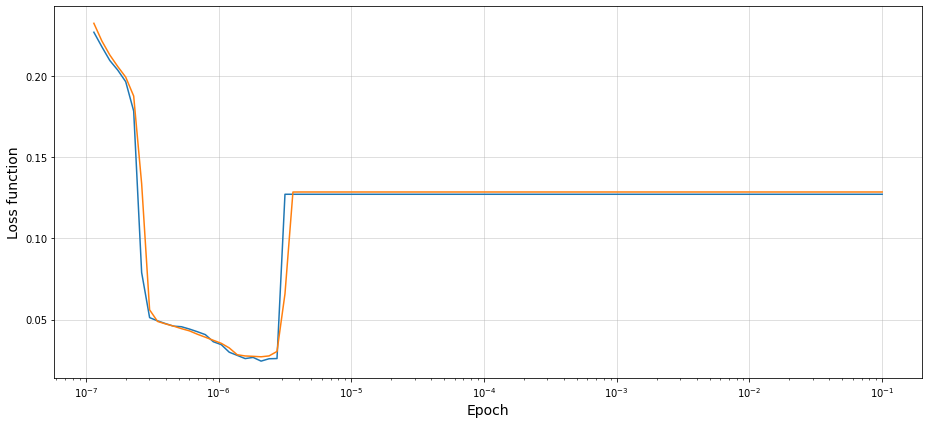

In [ ]:
lr_0=1e-7
epochs=100
lrates=[lr_0*10**(np.log10(10**6)*i/epochs) for i in range(1,epochs+1) ]
plt.figure(figsize=(13,6))
plt.plot(lrates,aux2.history["val_loss"])
plt.plot(lrates,aux2.history["loss"])

plt.xscale("log")
plt.xlabel("Epoch",fontsize=14)
plt.ylabel("Loss function",fontsize=14)
plt.grid(alpha=0.5)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/alpha_schedule_untelescopio.png")

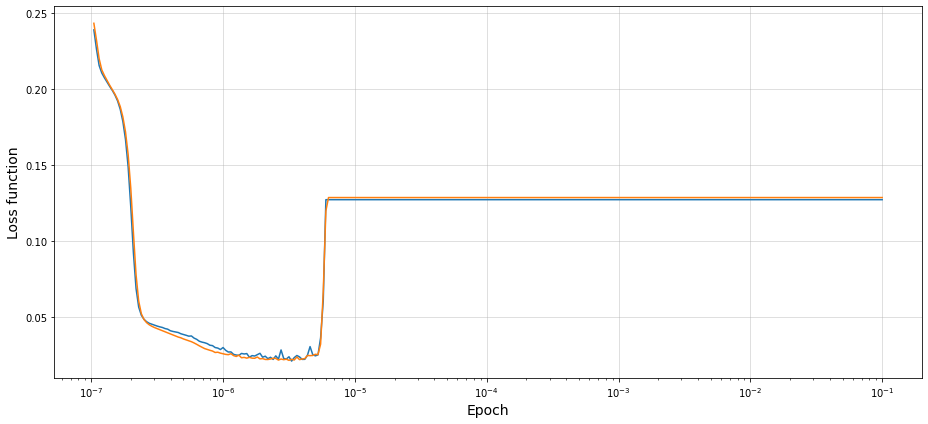

In [ ]:
lr_0=1e-7
epochs=300
lrates=[lr_0*10**(np.log10(10**6)*i/epochs) for i in range(1,epochs+1) ]
plt.figure(figsize=(13,6))
plt.plot(lrates,aux2.history["val_loss"])
plt.plot(lrates,aux2.history["loss"])

plt.xscale("log")
plt.xlabel("Epoch",fontsize=14)
plt.ylabel("Loss function",fontsize=14)
plt.grid(alpha=0.5)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/alpha_schedule_untelescopio.png")

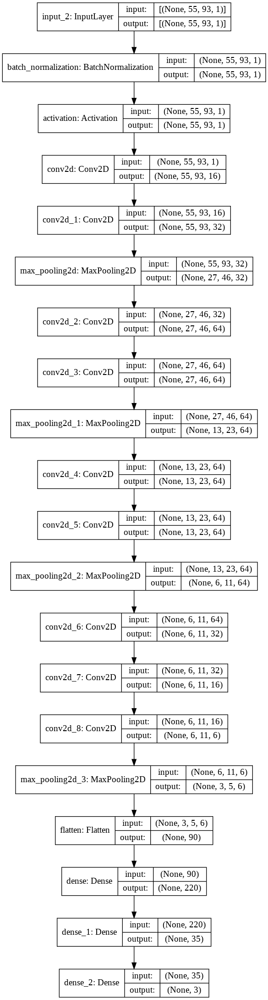

In [ ]:
model=model_1_tel(filtros=[[16,32],[64,64],[64,64],[32,16,6]],last_layers=[220,35],classes=3)
tf.keras.utils.plot_model(model,show_shapes=1,expand_nested=1)

In [ ]:
#confusion matrix 7 elements
model=model_1_tel(filtros=[[32,64],[128,256],[64,12],[12,4]],last_layers=[120,50],classes=7)
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=4e-4),loss="categorical_crossentropy",metrics=["accuracy"])

model.fit(x_train,y_train,epochs=70,validation_data=(x_test,y_test))
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),loss="categorical_crossentropy",metrics=["accuracy"])

model.fit(x_train,y_train,epochs=12,validation_data=(x_test,y_test))
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=3e-6),loss="categorical_crossentropy",metrics=["accuracy"])

model.fit(x_train,y_train,epochs=6,validation_data=(x_test,y_test))
comp_and_diplay_conf_matrix(y_test,model.predict(x_test),['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon'],sin_diag=False,save_dir="/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/conf_matrix_7.png")



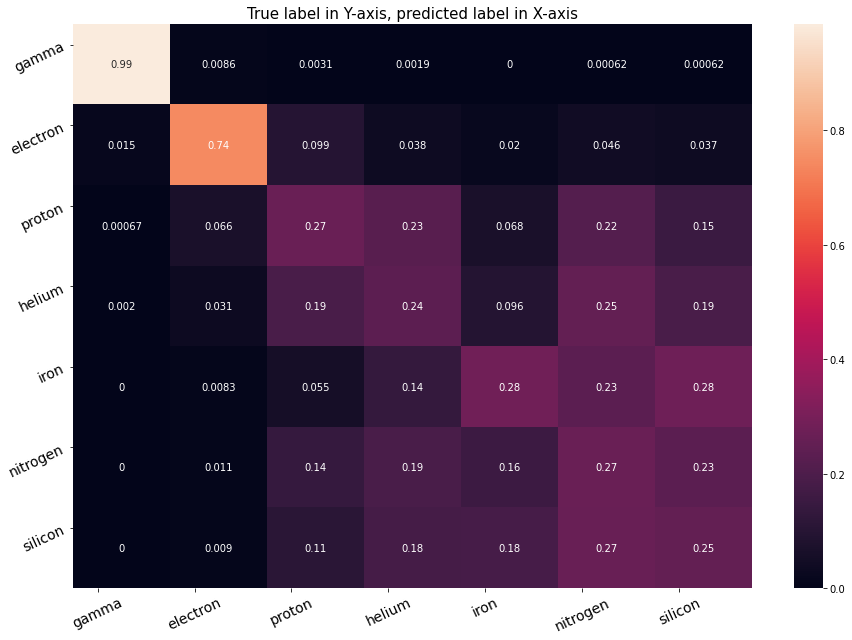

In [ ]:
comp_and_diplay_conf_matrix(y_test,model.predict(x_test),['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon'],sin_diag=False,save_dir="/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/conf_matrix_7.png")


In [ ]:
import json, time

In [ ]:
ruta_save="/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif"
param_distribs = {
 "filtros": [[[16,32],[32,64],[64],[32,16,6]], [[8,16],[32,32],[64],[32,16,6]],[[8,16,32],[32],[64],[16,4]]],
 "last_layers":[[100,50],[200,50],[50]]
}

aux1=json.dumps(param_distribs)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/parametros4.json","w") as fil:
    fil.write(aux1)

for m,i in enumerate(param_distribs["filtros"]):
    resultados={}
    for k in param_distribs["last_layers"]:
        start=time.time()
        print(i,k,"\n","_____________________","\n")
        model=model_1_tel(filtros=i,batch_init=False,last_layers=k,learning_rate=2e-6)
        hist=model.fit(x_train,y_train,epochs=80,validation_data=(x_test,y_test))
        resultados[f"{i}, {k}"]=hist.history
        stop=time.time()
        print(stop-start,"\n")
    #despues de cada una de estas lo ponemos a guardar
    aux2=json.dumps(resultados)
    with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados4_parte{m+1}.json","w") as fil2:
        fil2.write(aux2)


[[16, 32], [32, 64], [64], [32, 16, 6]] [100, 50] 
 _____________________ 

Epoch 1/80
1506/1506 [==============================] - 15s 10ms/step - loss: 0.9929 - accuracy: 0.8288 - val_loss: 0.6172 - val_accuracy: 0.9167
Epoch 2/80
1506/1506 [==============================] - 14s 9ms/step - loss: 0.5630 - accuracy: 0.9166 - val_loss: 0.4151 - val_accuracy: 0.9233
Epoch 3/80
1506/1506 [==============================] - 14s 9ms/step - loss: 0.3970 - accuracy: 0.9217 - val_loss: 0.3389 - val_accuracy: 0.9248
Epoch 4/80
1506/1506 [==============================] - 14s 9ms/step - loss: 0.3251 - accuracy: 0.9252 - val_loss: 0.2898 - val_accuracy: 0.9276
Epoch 5/80
1506/1506 [==============================] - 14s 9ms/step - loss: 0.2916 - accuracy: 0.9254 - val_loss: 0.2576 - val_accuracy: 0.9304
Epoch 6/80
1506/1506 [==============================] - 14s 9ms/step - loss: 0.2552 - accuracy: 0.9312 - val_loss: 0.2386 - val_accuracy: 0.9334
Epoch 7/80
1506/1506 [==============================]

In [ ]:
#cargamos la data
base_dir="/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21"
out=get_data_autoencoder(base_dir,tels=[4,5,6,11],runs=[1,2,3,4,5],num_runs=[1,8,7,8,8,8,8])#num_runs=[1,4,4,4,6,6,6])

/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/extract_gamma/gamma_tel_4_run_01.dt
/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/extract_electron/electron_tel_4_run_01.dt
/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/extract_electron/electron_tel_4_run_02.dt
/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/extract_electron/electron_tel_4_run_03.dt
/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/extract_electron/electron_tel_4_run_04.dt
/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/extract_electron/electron_tel_4_run_05.dt
/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/extract_electron/electron_tel_5_run_01.dt
/content/drive/MyDrive/prediccion_datos_muchos_

In [ ]:
#la salida el out[8] tiene que tener shape 54,92 y ahora tiene 55 93
out_salida=out[0]
out_salida=out_salida[:,1:-2,:-1]
in_entrada=out[1]
in_entrada=in_entrada[:,1:-2,:-1]
x_train_encoder ,x_test_encoder=train_test_split(in_entrada,test_size=0.2,random_state=42)
y_train_encoder ,y_test_encoder=train_test_split(out_salida,test_size=0.2,random_state=42)

In [ ]:
autoencoder,encoder, decoder=create_autoencoder(activationfuns=[1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1],mid_layer=40,prepost_layer=110,activityregul=None,return_iner_full=True)
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(4e-4),loss='mse')
autoencoder.fit(x_train_encoder,y_train_encoder,epochs=110,validation_data=(x_test_encoder,y_test_encoder))
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(1e-5),loss='mse')
autoencoder.fit(x_train_encoder,y_train_encoder,epochs=20,validation_data=(x_test_encoder,y_test_encoder))
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(3e-6),loss='mse')
autoencoder.fit(x_train_encoder,y_train_encoder,epochs=20,validation_data=(x_test_encoder,y_test_encoder))
#autoencoder.save(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/encoder_modelountelescopio_110_mid45.h5")

Epoch 1/110
633/633 [==============================] - 13s 18ms/step - loss: 52.8342 - val_loss: 30.5052
Epoch 2/110
633/633 [==============================] - 11s 17ms/step - loss: 29.2405 - val_loss: 27.2879
Epoch 3/110
633/633 [==============================] - 11s 17ms/step - loss: 24.3718 - val_loss: 25.7514
Epoch 4/110
633/633 [==============================] - 11s 17ms/step - loss: 22.5881 - val_loss: 23.2693
Epoch 5/110
633/633 [==============================] - 11s 17ms/step - loss: 19.6892 - val_loss: 23.3925
Epoch 6/110
633/633 [==============================] - 11s 17ms/step - loss: 19.6296 - val_loss: 19.7522
Epoch 7/110
633/633 [==============================] - 11s 17ms/step - loss: 18.3894 - val_loss: 18.5269
Epoch 8/110
633/633 [==============================] - 11s 17ms/step - loss: 15.1569 - val_loss: 18.4112
Epoch 9/110
633/633 [==============================] - 11s 17ms/step - loss: 16.6715 - val_loss: 16.1457
Epoch 10/110
633/633 [==============================] -

In [ ]:
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(3e-6),loss='mse')
autoencoder.fit(x_train_encoder,y_train_encoder,epochs=20,validation_data=(x_test_encoder,y_test_encoder))

Epoch 1/20
633/633 [==============================] - 12s 18ms/step - loss: 2.3545 - val_loss: 4.7775
Epoch 2/20
633/633 [==============================] - 11s 17ms/step - loss: 2.3492 - val_loss: 4.7810
Epoch 3/20
633/633 [==============================] - 11s 17ms/step - loss: 2.4038 - val_loss: 4.7773
Epoch 4/20
633/633 [==============================] - 11s 17ms/step - loss: 2.3727 - val_loss: 4.7734
Epoch 5/20
633/633 [==============================] - 11s 17ms/step - loss: 2.3553 - val_loss: 4.7725
Epoch 6/20
633/633 [==============================] - 11s 17ms/step - loss: 2.3104 - val_loss: 4.7686
Epoch 7/20
633/633 [==============================] - 11s 17ms/step - loss: 2.3509 - val_loss: 4.7686
Epoch 8/20
633/633 [==============================] - 11s 17ms/step - loss: 2.3374 - val_loss: 4.7655
Epoch 9/20
633/633 [==============================] - 11s 17ms/step - loss: 2.2905 - val_loss: 4.7717
Epoch 10/20
633/633 [==============================] - 11s 17ms/step - loss: 2.324

In [ ]:
#encoder.save(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/encoder_modelountelescopio_110_mid45.h5")
#autoencoder.save(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/autoencoder_modelountelescopio_110_mid45.h5")
#decoder.save(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/decoder_modelountelescopio_110_mid45.h5")

Epoch 1/200
1506/1506 [==============================] - 24s 6ms/step - loss: 12.5733 - val_loss: 12.3641
Epoch 2/200
1506/1506 [==============================] - 8s 5ms/step - loss: 12.1388 - val_loss: 12.1172
Epoch 3/200
1506/1506 [==============================] - 8s 6ms/step - loss: 12.1840 - val_loss: 11.8337
Epoch 4/200
1506/1506 [==============================] - 8s 5ms/step - loss: 11.6546 - val_loss: 11.5064
Epoch 5/200
1506/1506 [==============================] - 8s 5ms/step - loss: 11.5343 - val_loss: 11.1296
Epoch 6/200
1506/1506 [==============================] - 8s 5ms/step - loss: 11.0147 - val_loss: 10.6956
Epoch 7/200
1506/1506 [==============================] - 8s 5ms/step - loss: 10.5836 - val_loss: 10.2061
Epoch 8/200
1506/1506 [==============================] - 8s 5ms/step - loss: 10.0826 - val_loss: 9.6545
Epoch 9/200
1506/1506 [==============================] - 8s 5ms/step - loss: 9.4904 - val_loss: 9.0361
Epoch 10/200
1506/1506 [==============================] -

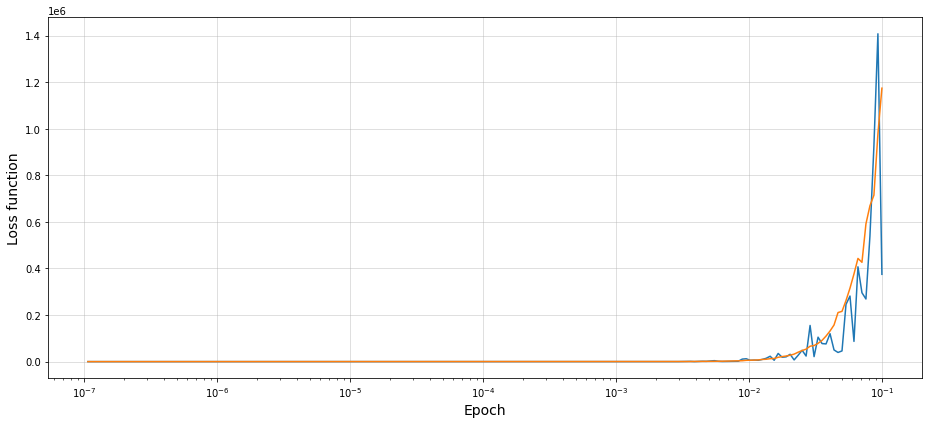

In [ ]:
#get_learnrate
def funcion_actualizacion(epoch,lr):
    #queremos que empiece en 10^-10 y vaya hasta 10^-1 
    return lr*10**(np.log(10**6)/200)
encoder=tf.keras.models.load_model(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/encoder_modelountelescopio_110_mid45.h5")
encoder.trainable=False


model=model_encoder([100,40],encoder=encoder)
actualizar=tf.keras.callbacks.LearningRateScheduler(funcion_actualizacion)
model.compile(optimizer=tf.keras.optimizers.Adam(1e-7),loss='categorical_crossentropy')
aux2=model.fit(x_train_new,y_train,epochs=200,validation_data=(x_test_new,y_test),callbacks=[actualizar])

lr_0=1e-7
epochs=200
lrates=[lr_0*10**(np.log10(10**6)*i/epochs) for i in range(1,epochs+1) ]
plt.figure(figsize=(13,6))
plt.plot(lrates,aux2.history["val_loss"])
plt.plot(lrates,aux2.history["loss"])

plt.xscale("log")
plt.xlabel("Epoch",fontsize=14)
plt.ylabel("Loss function",fontsize=14)
plt.grid(alpha=0.5)
plt.tight_layout()
#plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/alpha_schedule_untelescopio.png")

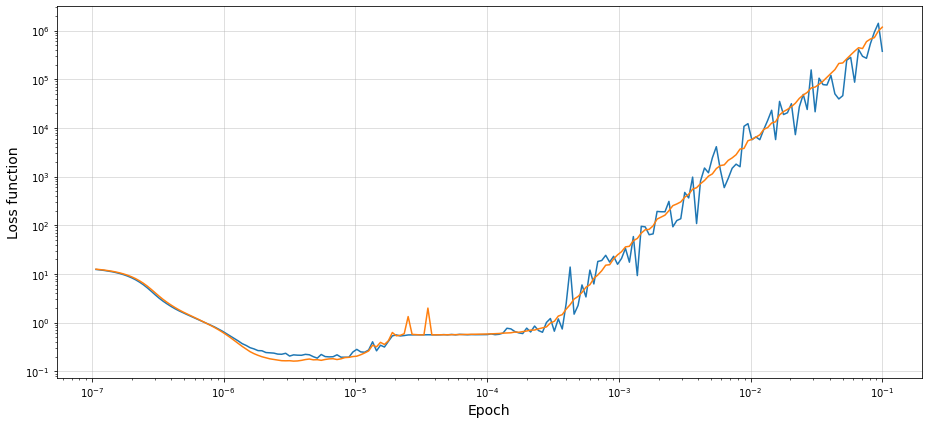

In [ ]:
lr_0=1e-7
epochs=200
lrates=[lr_0*10**(np.log10(10**6)*i/epochs) for i in range(1,epochs+1) ]
plt.figure(figsize=(13,6))
plt.plot(lrates,aux2.history["val_loss"])
plt.plot(lrates,aux2.history["loss"])

plt.xscale("log")
plt.yscale("log")

plt.xlabel("Epoch",fontsize=14)
plt.ylabel("Loss function",fontsize=14)
plt.grid(alpha=0.5)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/alpha_schedule_untelescopio_autoencoder_loglog.png")

In [ ]:
#ahora creamos el model con el encoder primero
encoder=tf.keras.models.load_model(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/encoder_modelountelescopio_110_mid45.h5")

#tenemos que recortar de las imagenes de forma que sean 52/92-....
def model_encoder(layers,output=3,encoder):

    model=tf.keras.Sequential()
    model.add(encoder)
    for i,j in enumerate(layers):
        model.add(tf.keras.layers.Dense(j,activation="relu"))

    model.add(tf.keras.layers.Dense(output,activation="softmax"))
    return model

SyntaxError: ignored

In [ ]:
x_train_new[1].shape

(22075, 52, 92, 1)

In [ ]:
#primero limitamos los datos de la forma que hemos hecho antes
x_train_new=x_train[:,1:-2,:-1]
x_test_new=x_test[:,1:-2,:-1]

In [ ]:
lista_opciones={"layers":[[40,20,16,16],[100,50,20],[400,200,10],[10],[20],[30,10]]}
                #"dropout":[]}


aux1=json.dumps(lista_opciones)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/parametros_usoencoder2_trainableencoder.json","w") as fil:
    fil.write(aux1)

resultados={}
resultados2={}

for i in lista_opciones["layers"][1:]:
    encoder=tf.keras.models.load_model(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/encoder_modelountelescopio_110_mid45.h5")
    encoder.trainable=False

    learning_rate=5e-5
    print(i,"\n","_____________________","\n")
    model=model_encoder(i,encoder=encoder)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),loss="categorical_crossentropy",metrics=["accuracy"])
    hist=model.fit(x_train_new,y_train,epochs=80,validation_data=(x_test_new,y_test))
    resultados[f"{i}"]=hist.history
    learning_rate=1e-6
    encoder.trainable=True
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),loss="categorical_crossentropy",metrics=["accuracy"])
    hist2=model.fit(x_train_new,y_train,epochs=15,validation_data=(x_test_new,y_test))
    resultados2[f"{i}"]=hist2.history

aux2=json.dumps(resultados)
with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados_usoencoder2_trainableencoder_part1.json","w") as fil2:
    fil2.write(aux2)

aux2=json.dumps(resultados2)
with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados_usoencoder2_trainableencoder_part2.json","w") as fil2:
    fil2.write(aux2)


[100, 50, 20] 
 _____________________ 

Epoch 1/80
2064/2064 [==============================] - 26s 6ms/step - loss: 2.0732 - accuracy: 0.6370 - val_loss: 1.0333 - val_accuracy: 0.7694
Epoch 2/80
2064/2064 [==============================] - 11s 5ms/step - loss: 0.8088 - accuracy: 0.8348 - val_loss: 0.6273 - val_accuracy: 0.8700
Epoch 3/80
2064/2064 [==============================] - 11s 5ms/step - loss: 0.5167 - accuracy: 0.8879 - val_loss: 0.4381 - val_accuracy: 0.9012
Epoch 4/80
2064/2064 [==============================] - 11s 5ms/step - loss: 0.3752 - accuracy: 0.9117 - val_loss: 0.3468 - val_accuracy: 0.9177
Epoch 5/80
2064/2064 [==============================] - 11s 5ms/step - loss: 0.3025 - accuracy: 0.9241 - val_loss: 0.3057 - val_accuracy: 0.9241
Epoch 6/80
2064/2064 [==============================] - 11s 5ms/step - loss: 0.2633 - accuracy: 0.9309 - val_loss: 0.2738 - val_accuracy: 0.9297
Epoch 7/80
2064/2064 [==============================] - 11s 5ms/step - loss: 0.2401 - accu

#Resultados 1 telescopio

In [ ]:
import json

In [ ]:
#cargamos los resultados
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados1_parte1.json","r") as json_file:
    resultados1_1 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados1_parte2.json","r") as json_file:
    resultados1_2 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados1_parte3.json","r") as json_file:
    resultados1_3 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/parametros1.json","r") as json_file:
        parametros1 = json.load(json_file)



#cargamos los resultados
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados2_parte1.json","r") as json_file:
    resultados2_1 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados2_parte2.json","r") as json_file:
    resultados2_2 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados2_parte3.json","r") as json_file:
    resultados2_3 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/parametros2.json","r") as json_file:
        parametros2 = json.load(json_file)


#cargamos los resultados
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados3_parte1.json","r") as json_file:
    resultados3_1 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados3_parte2.json","r") as json_file:
    resultados3_2 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados3_parte3.json","r") as json_file:
    resultados3_3 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/parametros3.json","r") as json_file:
        parametros3 = json.load(json_file)


In [ ]:
parametros1

{'batch_init': [True, False],
 'filtros': [[[16, 32], [64, 128, 254], [32, 16]],
  [[64, 128], [32, 16, 8]],
  [[16, 32], [64, 64], [64, 64], [32, 12, 6]],
  [[64], [64, 128], [32, 32, 16]]],
 'last_layers': [[120, 20], [100], [220, 35], [50], [20]]}

In [ ]:
resultados=resultados1_1.copy()
resultados.update(resultados1_2)
resultados.update(resultados1_3)
resultados.update(resultados2_1)
resultados.update(resultados2_2)
resultados.update(resultados2_3)
resultados.update(resultados3_1)
resultados.update(resultados3_2)
resultados.update(resultados3_3)


In [ ]:
indices=list(resultados.keys())
len(indices)

51

In [ ]:
len(resultados[indices[1]]["accuracy"])

80

In [ ]:
last_values=[resultados[indices[j]]["accuracy"][-1] for j in range(len(indices))]
indices_ordenados=np.argsort(last_values)
valores_ordenados=sorted(last_values)
labels=list(resultados.keys())

In [ ]:
valores_ordenados[::-1]

[0.9765384793281555,
 0.9755834341049194,
 0.9743376970291138,
 0.9743168950080872,
 0.9739016890525818,
 0.9725521206855774,
 0.9719499945640564,
 0.9716593027114868,
 0.971202552318573,
 0.9701229333877563,
 0.9698114991188049,
 0.9696869254112244,
 0.9689186811447144,
 0.9688771963119507,
 0.9688563942909241,
 0.9683996438980103,
 0.9673615097999573,
 0.9668839573860168,
 0.9667593836784363,
 0.9667386412620544,
 0.9664687514305115,
 0.9658458828926086,
 0.96538907289505,
 0.9652644991874695,
 0.9649323225021362,
 0.964870035648346,
 0.9641017913818359,
 0.9639357328414917,
 0.9638734459877014,
 0.9630429148674011,
 0.9628353118896484,
 0.9628145694732666,
 0.96279376745224,
 0.962689995765686,
 0.962357759475708,
 0.962357759475708,
 0.9620463252067566,
 0.9613819718360901,
 0.9610082507133484,
 0.9607590436935425,
 0.9606344699859619,
 0.9604268670082092,
 0.9594718217849731,
 0.9592018723487854,
 0.9590150117874146,
 0.9581637978553772,
 0.9579146504402161,
 0.9578523635864258,
 

In [ ]:
for i in range(51):
    print(indices[indices_ordenados[i]],last_values[indices_ordenados[i]])

[[16, 32], [64, 64], [64, 64], [32, 12, 6]], True, [50] 0.9568765163421631
[[64, 128], [32, 16, 8]], True, [20] 0.9569388031959534
[[16, 32], [64, 64], [64, 64], [32, 12, 6]], True, [120, 20] 0.9576862454414368
[[8, 16, 32], [32], [64], [16, 4]], [50] 0.9578523635864258
[[8, 16, 32], [32], [64], [16, 4]], [200, 50] 0.9579146504402161
[[16, 32], [64, 64], [64, 64], [32, 12, 6]], True, [20] 0.9581637978553772
[[64, 128], [32, 16, 8]], True, [50] 0.9590150117874146
[[8, 16], [32, 32], [64], [32, 16, 6]], [50] 0.9592018723487854
[[16, 32], [64, 64], [64, 64], [32, 12, 6]], True, [100] 0.9594718217849731
[[16, 32], [64, 64], [64, 64], [32, 12, 6]], True, [220, 35] 0.9604268670082092
[[8, 16, 32], [32], [64], [16, 4]], [100, 50] 0.9606344699859619
[[8, 16], [32, 32], [64], [32, 16, 6]], [100, 50] 0.9607590436935425
[[16, 32], [64, 64], [64, 64], [32, 6]], [20] 0.9610082507133484
[[64, 128], [32, 16, 8]], True, [100] 0.9613819718360901
[[16, 32], [64, 64], [64, 64], [32, 12, 6]], False, [20] 

In [ ]:
import matplotlib

0.9623816609382629 [[16, 32], [64, 128, 254], [32, 16]], True, [220, 35]
0.9635442495346069 [[16, 32], [64, 64], [64, 64], [32, 12, 6]], False, [220, 35]
0.9619664549827576 [[16, 32], [64, 128], [256, 512], [32, 6]], [300, 40]
0.9622986316680908 [[16, 32], [64, 128], [256, 512], [32, 6]], [200, 30]
0.9615512490272522 [[16, 32], [64, 128], [256, 512], [32, 6]], [60]


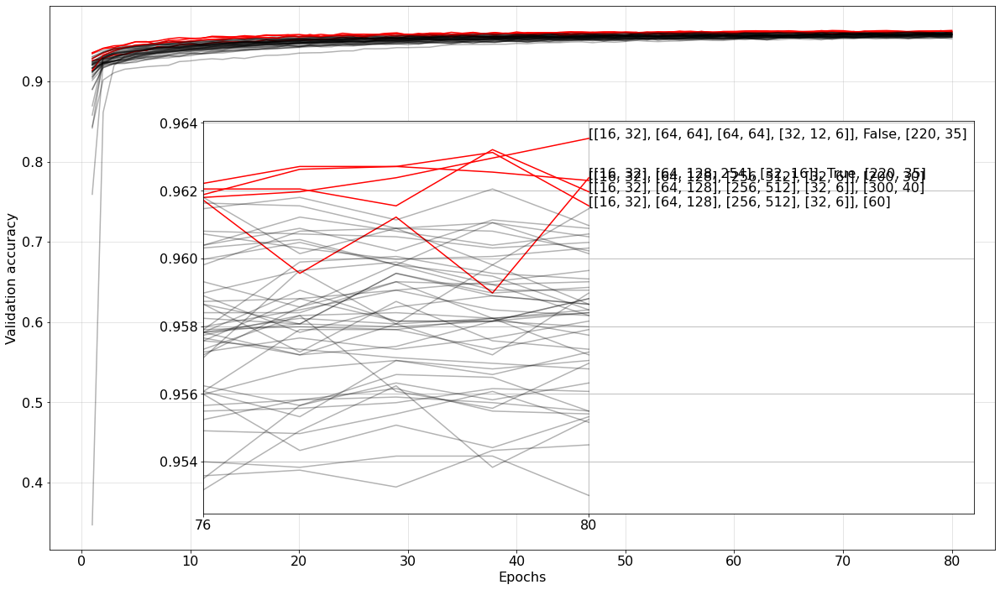

In [ ]:
fig=plt.figure(figsize=(17,10))
ax1=fig.add_axes([0.1,0.1,0.92,0.9])
ax2=fig.add_axes([0.25,0.16,0.75,0.65])
list_aux=[]
for i,j in enumerate(resultados):
    if resultados[j]["val_accuracy"][-1] in valores_ordenados[-5:]:
        ax1.plot(np.arange(1,81),resultados[j]["val_accuracy"],"r-")
        ax2.plot(np.arange(76,81),resultados[j]["val_accuracy"][-5:],"r-")
        ax2.text(80,resultados[j]["val_accuracy"][-1],j)
        print(resultados[j]["val_accuracy"][-1],j)
    else:
        ax1.plot(np.arange(1,81),resultados[j]["val_accuracy"],"k",alpha=0.3)
        ax2.plot(np.arange(76,81),resultados[j]["val_accuracy"][-5:],"k",alpha=0.3)

#x_best=80
#y_best=np.linspace(0.963,0.960,5)
#for i in range(5):
#    
#    ax2.text(x_best,y_best[i],indices[indices_ordenados[-i]])
    
ax2.set_xlim([76,84])
ax2.grid()
ax1.grid(alpha=0.4)

ax2.set_xticks([76,80])
ax1.set_ylabel("Validation accuracy")
ax1.set_xlabel("Epochs")
matplotlib.rcParams.update({'font.size': 16})
#plt.tight_layout()
#plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/archits_tel1_sinnombres.png",dpi=250)






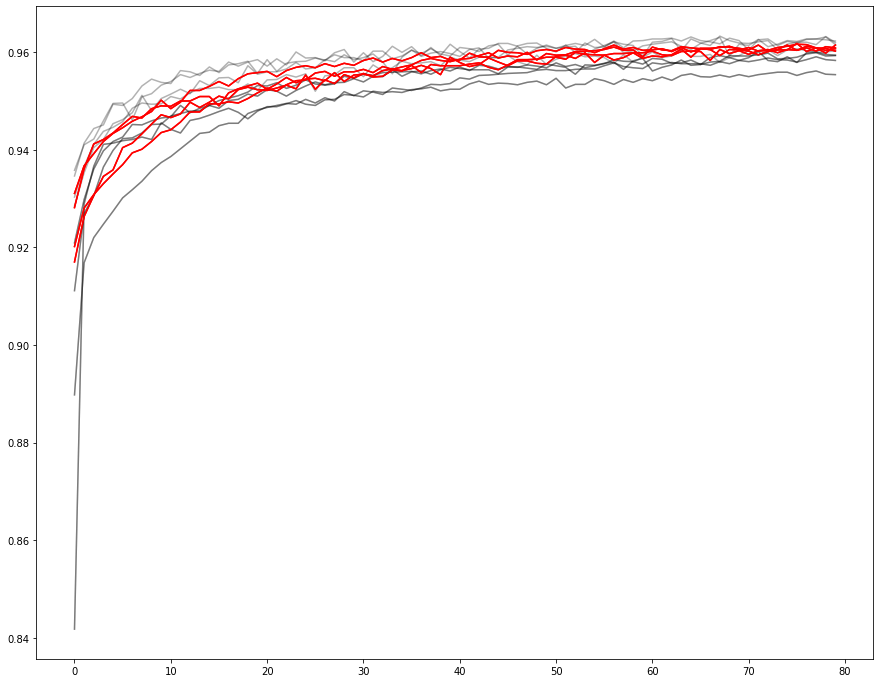

In [ ]:
plt.figure(figsize=(15,12))
for i,j in enumerate(indices):

    if "[32, 64]" in j:
        plt.plot(resultados[j]["val_accuracy"],"r",alpha=1)
    else:
        plt.plot(resultados[j]["val_accuracy"],"k",alpha=0.3)

In [ ]:
os.listdir("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif")

['resultados1_parte1.json',
 'resultados1_parte2.json',
 'resultados1_parte3.json',
 'parametros1.json',
 'parametros2.json',
 'resultados2_parte1.json',
 'resultados2_parte2.json',
 'resultados2_parte3.json',
 'parametros3.json',
 'resultados3_parte1.json',
 'resultados3_parte2.json',
 'resultados3_parte3.json',
 'multiinput_parametros1.json',
 'multiinput_resultados1_parte1.json',
 'multiinput_resultados1_parte2.json',
 'multiinput_resultados1_parte3.json',
 'multiinput_parametros2.json',
 'multiinput_resultados2_parte1.json',
 'multiinput_resultados2_parte2.json',
 'multiinput_resultados2_parte3.json',
 'multiinput_parametros_usoencoder1.json',
 'multiinput_resultados_usoencoder1.json',
 'multiinput_parametros_usoencoder2_trainableencoder.json',
 'multiinput_resultados_usoencoder2_trainableencoder_part1.json',
 'multiinput_resultados_usoencoder2_trainableencoder_part2.json',
 '7tels_multiinput_parametros1.json',
 '7tels_multiinput_resultados1_parte1.json',
 '7tels_multiinput_resulta

In [ ]:
#con autoencoder delante
#sin entrenar 
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados_usoencoder1_part1.json","r") as json_file:
    resultados1_1 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados_usoencoder1_part2.json","r") as json_file:
    resultados1_2 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/parametros_usoencoder1.json","r") as json_file:
    parametros1 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados_usoencoder2_trainableencoder_part1.json","r") as json_file:
    resultados2_1 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados_usoencoder2_trainableencoder_part2.json","r") as json_file:
    resultados2_2 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/parametros_usoencoder2_trainableencoder.json","r") as json_file:
    parametros2 = json.load(json_file)

resultados1=resultados1_1.copy()
resultados1.update(resultados1_2)


In [ ]:
#juntamos los que tienen dos intervalos
final_resultados2={}
for i in resultados2_1:
    append_aux=np.concatenate((resultados2_1[i]["val_accuracy"],resultados2_2[i]["val_accuracy"]))
    final_resultados2[str(i)]=append_aux

(0.87, 0.97)

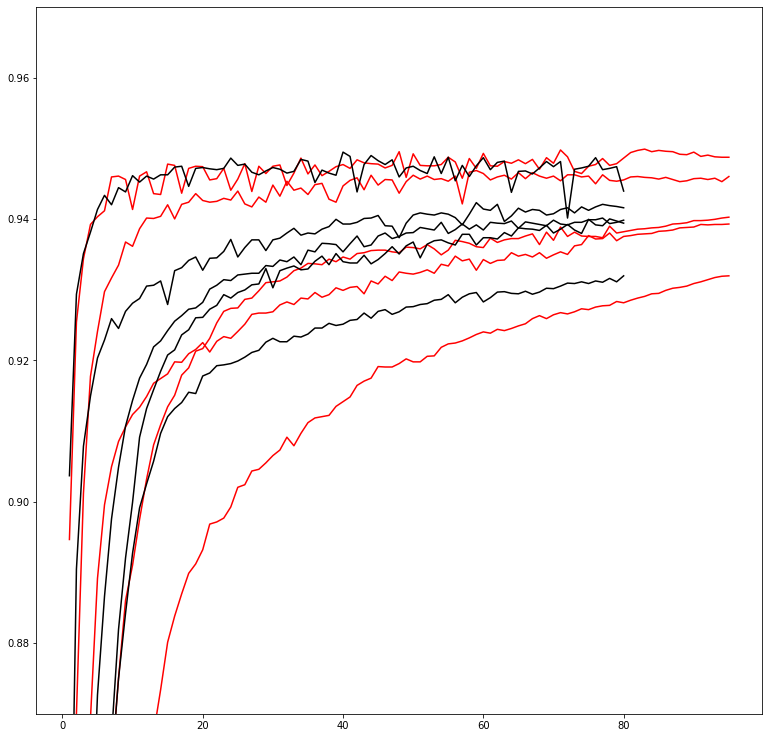

In [ ]:
plt.figure(figsize=(13,13))
for i in resultados2_1:
    plt.plot(np.arange(1,96),final_resultados2[i],"r")
for i in resultados1:
    plt.plot(np.arange(1,81),resultados1[i]["val_accuracy"],"k")
#plt.xlim([35,96])
plt.ylim([0.87,0.97])

In [ ]:
#con autoencoder
#entrando tambien, mas epochs
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados_usoencoder3_trainableencoder_part1.json","r") as json_file:
    resultados1_1 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados_usoencoder3_trainableencoder_part2.json","r") as json_file:
    resultados1_2 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/parametros_usoencoder3_trainableencoder.json","r") as json_file:
    parametros1 = json.load(json_file)


with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados_usoencoder4_trainableencoder_part1.json","r") as json_file:
    resultados2_1 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/resultados_usoencoder4_trainableencoder_part2.json","r") as json_file:
    resultados2_2 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/parametros_usoencoder4_trainableencoder.json","r") as json_file:
    parametros2 = json.load(json_file)

In [ ]:
#sacamos los maximos
#AMBAS PARTED POR SEPARADO

resultados_1parte=resultados1_1
resultados_1parte.update(resultados2_1)
resultados_2parte=resultados1_2
resultados_2parte.update(resultados2_2)


ultimos_1parte=[resultados_1parte[i]["accuracy"][-1] for i in resultados_1parte]
ultimos_2parte=[resultados_2parte[i]["accuracy"][-1] for i in resultados_2parte]

mejores_1parte=sorted(ultimos_1parte)
mejores_2parte=sorted(ultimos_2parte)

indices_1parte=list(resultados_1parte.keys())
indices_2parte=list(resultados_2parte.keys())
indicesord_1parte=np.argsort(ultimos_1parte)
indicesord_2parte=np.argsort(ultimos_2parte)


In [ ]:
for j,i in enumerate(indicesord_1parte):
    print(f"{j+1} peor",ultimos_1parte[i],indices_1parte[i])

for j,i in enumerate(indicesord_2parte):
    print(f"{j+1} peor",ultimos_2parte[i],indices_2parte[i])


1 peor 0.9247275590896606 [10]
2 peor 0.933085560798645 [20]
3 peor 0.9352045059204102 [30, 10]
4 peor 0.9436634182929993 [40, 20, 16, 16]
5 peor 0.957301914691925 [80, 50, 20]
6 peor 0.9594544768333435 [100, 50, 20]
7 peor 0.9605811834335327 [500]
8 peor 0.9611193537712097 [400, 10]
9 peor 0.968266487121582 [400, 200, 10]
1 peor 0.9737319946289062 [30, 10]
2 peor 0.9746569395065308 [10]
3 peor 0.9752959609031677 [20]
4 peor 0.9754136800765991 [40, 20, 16, 16]
5 peor 0.9773139953613281 [500]
6 peor 0.9788611531257629 [100, 50, 20]
7 peor 0.9793824553489685 [400, 10]
8 peor 0.9798870086669922 [80, 50, 20]
9 peor 0.9866137504577637 [400, 200, 10]


In [ ]:
#juntamos los que tienen dos intervalos
final_resultados={}
for i in resultados1_1:
    append_aux=np.concatenate((resultados1_1[i]["val_accuracy"],resultados1_2[i]["val_accuracy"]))
    final_resultados[i]=append_aux

for i in resultados2_1:
    append_aux=np.concatenate((resultados2_1[i]["val_accuracy"],resultados2_2[i]["val_accuracy"]))
    final_resultados[i]=append_aux

In [ ]:
mejores_normal=[final_resultados[i][-1] for i in final_resultados]
mejores=sorted([final_resultados[i][-1] for i in final_resultados])[::-1]
indices=list(final_resultados.keys())
sortindices=np.argsort([final_resultados[i][-1] for i in final_resultados])

In [ ]:
print(mejores)

[0.9528453946113586, 0.9509619474411011, 0.9496838450431824, 0.9449078440666199, 0.9428898096084595, 0.9424189329147339, 0.9414099454879761, 0.941275417804718, 0.9402663707733154]


In [ ]:
import matplotlib.patches as patches
import matplotlib 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


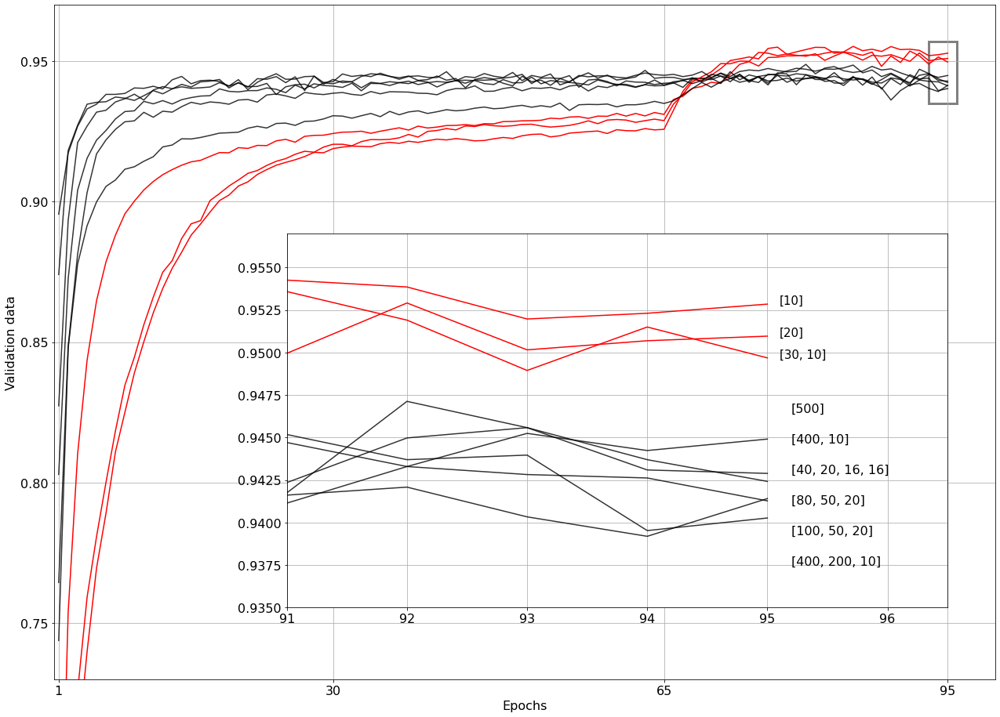

In [ ]:
y_aux=np.linspace(0.9375,0.9465,6)
fig=plt.figure(figsize=(18,13))
for i in final_resultados:
    if final_resultados[i][-1] in mejores[:3]:
        plt.plot(np.arange(1,1+len(final_resultados[i])),final_resultados[i],"r")
    else:
        plt.plot(np.arange(1,1+len(final_resultados[i])),final_resultados[i],"k",alpha=0.8)

    #plt.text(95,final_resultados[i][-1],i)
plt.xticks([1,30,65,95])
plt.ylim([0.73,0.97])
plt.xlim([0.5,100])
plt.xlabel("Epochs",fontsize=16)
plt.ylabel("Validation data",fontsize=16)
rect = patches.Rectangle((93, 0.935), 3, 0.022, linewidth=3, edgecolor='grey', facecolor='none')
ax1=fig.gca()
ax1.add_patch(rect)
plt.grid()


ax2=fig.add_axes([0.29,0.16,0.65,0.51])
for i in final_resultados:
    if final_resultados[i][-1] in mejores[:3]:
        plt.plot(np.arange(1,1+len(final_resultados[i])),final_resultados[i],"r")
        plt.text(95.1,final_resultados[i][-1],i,fontsize=15)
    else:
        plt.plot(np.arange(1,1+len(final_resultados[i])),final_resultados[i],"k",alpha=0.8)
    

plt.ylim([0.935,0.957])
plt.xlim([91,96.5])
plt.grid()
matplotlib.rcParams.update({'font.size': 16})
plt.tight_layout()
for j,i in enumerate(sortindices[:-3]):
    plt.text(95.2,y_aux[j],indices[i])

plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/train_withencoder_1tel.png",pdi=230)

#Estudio clasificador multiples telescopios

In [ ]:
def model_multi_tel(len_inputs=4,input_shapes=[(55,93,1)],classes=7,learning_rate=1e-5,pre_proces_model=None,filtros=None,last_dense=None,autoencoder=None,common_pre=True,batch=False):
    inputs=[]
    outputs=[[] for i in range(len_inputs)]
    if len(input_shapes)==1:
        for i in range(1,len_inputs):
            input_shapes.append(input_shapes[0])

    for i in range(len_inputs):
        inputs.append(tf.keras.Input(shape=input_shapes[i]))

    if pre_proces_model:
        for i in range(len_inputs):
            outputs[i]=pre_proces_model(first_model=autoencoder)(inputs[i])
    else:
        if filtros is None:
            filtros=[[64,128],[128,254,64],[32]]
        #si no le metemos un modelo pues habra que meter aqui chicha porque sino se queda esto muy vacio
        if common_pre:
            pre_model=model_1_tel(input_shapes[0],filtros=filtros,first_part=True,first_model=autoencoder,batch_init=batch)
            outputs[0]=pre_model(inputs[0])
            for i in range(1,len_inputs):
                if input_shapes[i]!=input_shapes[i-1]:
                #esto esta suponiendo que ponemos juntos los que tienen igual shape
                    pre_model=model_1_tel(input_shapes[i],filtros=filtros,first_part=True,first_model=autoencoder,batch_init=batch) 
                outputs[i]=pre_model(inputs[i])

        else:
            for i in range(len_inputs):
                #SI QUEREMOS PONER AUTOENCODER TENEMOS QUE VER LA FOTMA DE COPIARLO
                pre_model=model_1_tel(input_shape=input_shapes[i],filtros=filtros,first_part=True,batch_init=batch)
                outputs[i]=pre_model(inputs[i]) 
    #nos falta la ultima parte
    if last_dense is None:
        last_dense=[65,35]
    x=tf.keras.layers.concatenate(outputs)
    for i in last_dense:
        x=tf.keras.layers.Dense(i,activation="relu",kernel_regularizer="l2")(x)
    end_layer=tf.keras.layers.Dense(classes,activation="softmax")(x)
    model=tf.keras.Model(inputs=inputs,outputs=end_layer)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),loss="categorical_crossentropy",metrics=["accuracy"])

    return model


In [ ]:
npy_base="/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/npy_data"

a=create_lista_list_runs(num_events=[4,39,39,39,20,39,39],random_select=False)
x_train,x_test,y_train,y_test=load_dataset_completo(npy_base,elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon'],labels_asign=[0,1,2,2,2,2,2],lista_list_runs=a,telescopios=[4,5,6,11],test_size=0.2,same_quant="approx",fill=True,verbose=True)

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_15 (InputLayer)           [(None, 55, 93, 1)]  0                                            
__________________________________________________________________________________________________
input_16 (InputLayer)           [(None, 55, 93, 1)]  0                                            
__________________________________________________________________________________________________
input_17 (InputLayer)           [(None, 55, 93, 1)]  0                                            
__________________________________________________________________________________________________
input_18 (InputLayer)           [(None, 55, 93, 1)]  0                                            
____________________________________________________________________________________________

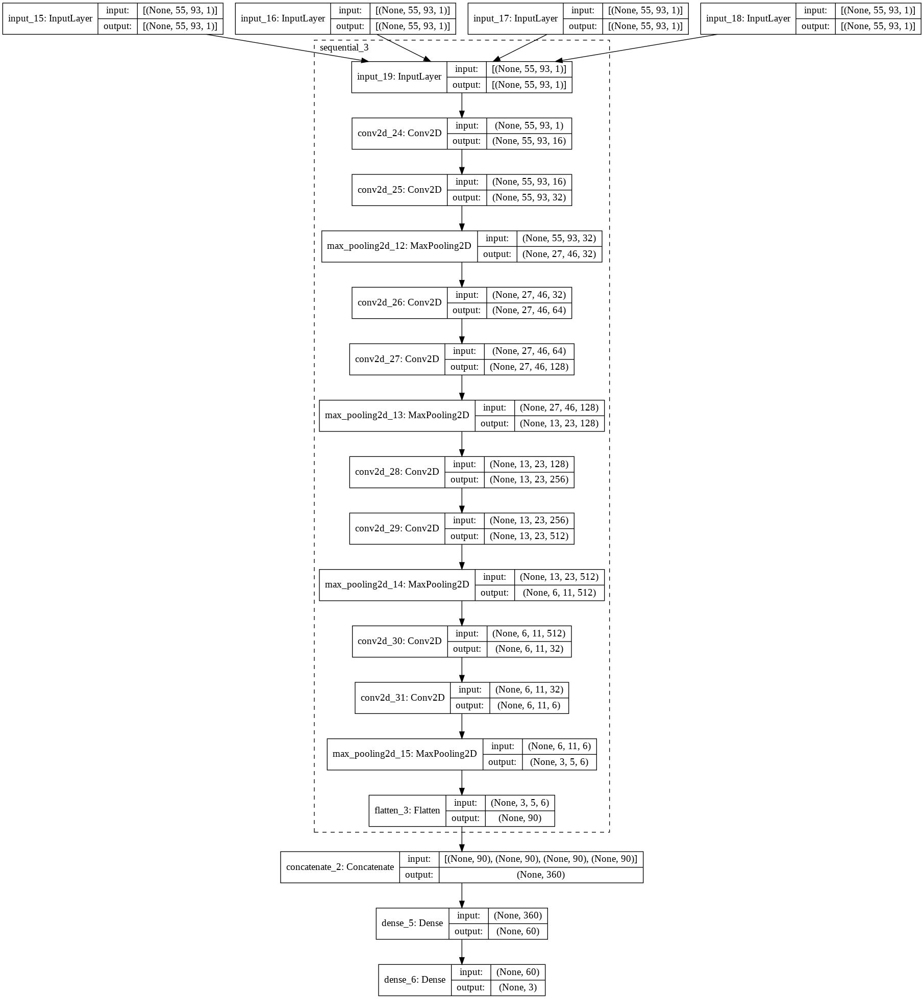

In [ ]:
#modelo_input=tf.keras.models.load_model("/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/autoencoder_ground_truth_2_largetrain_out5292.h5")
#[4,5,6,11,29,32,34]
model=model_multi_tel(len_inputs=4,input_shapes=[(55,93,1)],classes=3,learning_rate=1e-4,
                  pre_proces_model=None,last_dense=[60],filtros=[[16, 32], [64, 128], [256, 512], [32, 6]],common_pre=True)
model.summary()
tf.keras.utils.plot_model(model,expand_nested=True,show_shapes=True)

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_10 (InputLayer)           [(None, 55, 93, 1)]  0                                            
__________________________________________________________________________________________________
input_11 (InputLayer)           [(None, 55, 93, 1)]  0                                            
__________________________________________________________________________________________________
input_12 (InputLayer)           [(None, 55, 93, 1)]  0                                            
__________________________________________________________________________________________________
input_13 (InputLayer)           [(None, 55, 93, 1)]  0                                            
____________________________________________________________________________________________

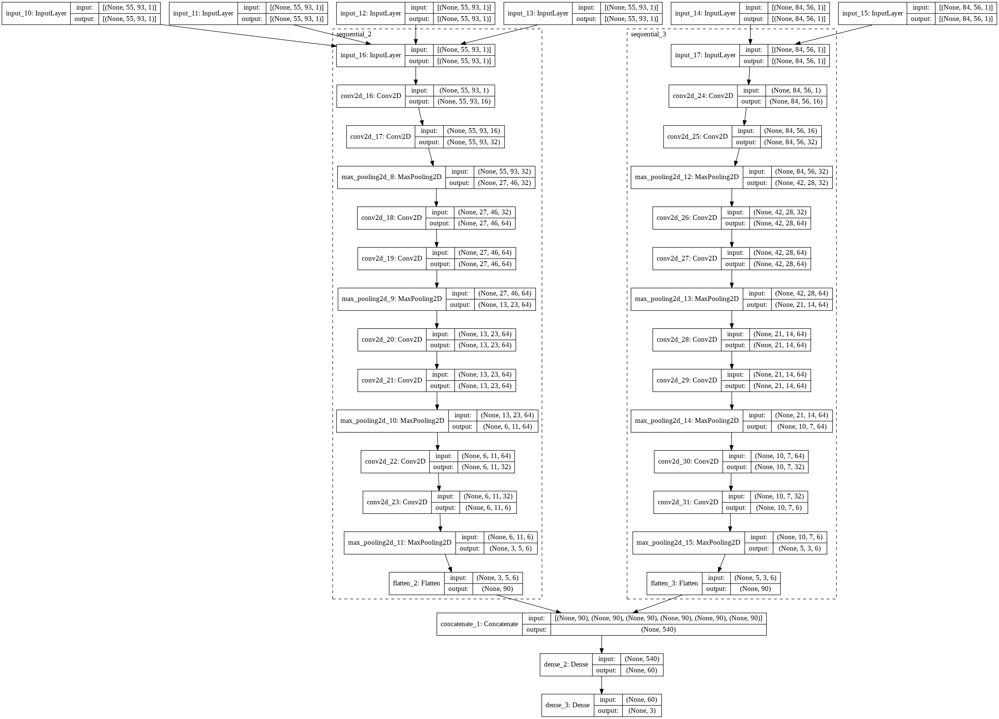

In [ ]:
#modelo_input=tf.keras.models.load_model("/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/autoencoder_ground_truth_2_largetrain_out5292.h5")
#[4,5,6,11,29,32,34]
model=model_multi_tel(len_inputs=6,input_shapes=[(55,93,1),(55,93,1),(55,93,1),(55,93,1),(84,56,1),(84,56,1)],classes=3,learning_rate=1e-4,
                  pre_proces_model=None,last_dense=[60],filtros=[[16, 32], [64, 64], [64, 64], [32, 6]],common_pre=True)
model.summary()
tf.keras.utils.plot_model(model,expand_nested=True,show_shapes=True)

In [ ]:
ruta_save="/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif"
#param_distribs = {
# "filtros": [[[16,32],[32,64],[64],[32,16,4]], [[8,16],[32,32],[64],[32,16,4]],[[8,16,32],[32],[64],[16,4]]],
# "last_layers":[[200,50],[400,50],[50],[300]]
#}

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/parametros2.json","r") as json_file:
        param_distribs = json.load(json_file)

#aux1=json.dumps(param_distribs)
#with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_parametros2.json","w") as fil:
#    fil.write(aux1)

for m,i in enumerate(param_distribs["filtros"][2:]):
    resultados={}
    for k in param_distribs["last_layers"]:
        start=time.time()
        print(i,k,"\n","_____________________","\n")
        model=model_multi_tel(len_inputs=4,input_shapes=[(55,93,1)],classes=3,learning_rate=6e-5,
                  pre_proces_model=None,last_dense=k,filtros=i,common_pre=True)
        hist=model.fit(x_train,y_train,epochs=80,validation_data=(x_test,y_test))
        resultados[f"{i}, {k}"]=hist.history
        stop=time.time()
        print(stop-start,"\n")
    #despues de cada una de estas lo ponemos a guardar
    #aux2=json.dumps(resultados)
    #with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_resultados2_parte{m+3}.json","w") as fil2:
    #    fil2.write(aux2)


[[32, 64], [128, 256], [64, 32], [16, 6]] [300, 40] 
 _____________________ 

Epoch 1/80
690/690 [==============================] - 48s 43ms/step - loss: 3.8597 - accuracy: 0.8977 - val_loss: 2.5585 - val_accuracy: 0.9663
Epoch 2/80
690/690 [==============================] - 28s 41ms/step - loss: 2.3769 - accuracy: 0.9587 - val_loss: 1.8843 - val_accuracy: 0.9591
Epoch 3/80
690/690 [==============================] - 28s 41ms/step - loss: 1.7553 - accuracy: 0.9716 - val_loss: 1.4692 - val_accuracy: 0.9745
Epoch 4/80
690/690 [==============================] - 28s 41ms/step - loss: 1.3995 - accuracy: 0.9735 - val_loss: 1.2105 - val_accuracy: 0.9766
Epoch 5/80
690/690 [==============================] - 28s 41ms/step - loss: 1.1471 - accuracy: 0.9771 - val_loss: 1.0509 - val_accuracy: 0.9610
Epoch 6/80
690/690 [==============================] - 28s 41ms/step - loss: 0.9666 - accuracy: 0.9781 - val_loss: 0.8477 - val_accuracy: 0.9837
Epoch 7/80
690/690 [==============================] - 28s 

In [ ]:
def model_multi_tel_encoder(len_inputs=4,input_shapes=[(55,93,1)],classes=3,last_dense=None,encoder=None,common_pre=True): #,learning_rate=1e-5
    inputs=[]
    outputs=[[] for i in range(len_inputs)]
    if len(input_shapes)==1:
        for i in range(1,len_inputs):
            input_shapes.append(input_shapes[0])

    for i in range(len_inputs):
        inputs.append(tf.keras.Input(shape=input_shapes[i]))


    if common_pre:
        outputs[0]=encoder(inputs[0])
        for i in range(1,len_inputs):
            #if input_shapes[i]!=input_shapes[i-1]:
            #esto esta suponiendo que ponemos juntos los que tienen igual shape
            #    pre_model=model_1_tel(input_shapes[i],filtros=filtros,first_part=True,first_model=autoencoder) 
            outputs[i]=encoder(inputs[i])

    else:
        for i in range(len_inputs):
            #SI QUEREMOS PONER AUTOENCODER TENEMOS QUE VER LA FOTMA DE COPIARLO
            pre_model=model_1_tel(input_shape=input_shapes[i],filtros=filtros,first_part=True,batch_init=batch)
            outputs[i]=pre_model(inputs[i]) 
    #nos falta la ultima parte
    if last_dense is None:
        last_dense=[65,35]
    x=tf.keras.layers.concatenate(outputs)
    for i in last_dense:
        x=tf.keras.layers.Dense(i,activation="relu",kernel_regularizer="l2")(x)
    end_layer=tf.keras.layers.Dense(classes,activation="softmax")(x)
    model=tf.keras.Model(inputs=inputs,outputs=end_layer)
    #model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),loss="categorical_crossentropy",metrics=["accuracy"])

    return model


Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_36 (InputLayer)           [(None, 52, 92, 1)]  0                                            
__________________________________________________________________________________________________
input_37 (InputLayer)           [(None, 52, 92, 1)]  0                                            
__________________________________________________________________________________________________
input_38 (InputLayer)           [(None, 52, 92, 1)]  0                                            
__________________________________________________________________________________________________
input_39 (InputLayer)           [(None, 52, 92, 1)]  0                                            
____________________________________________________________________________________________

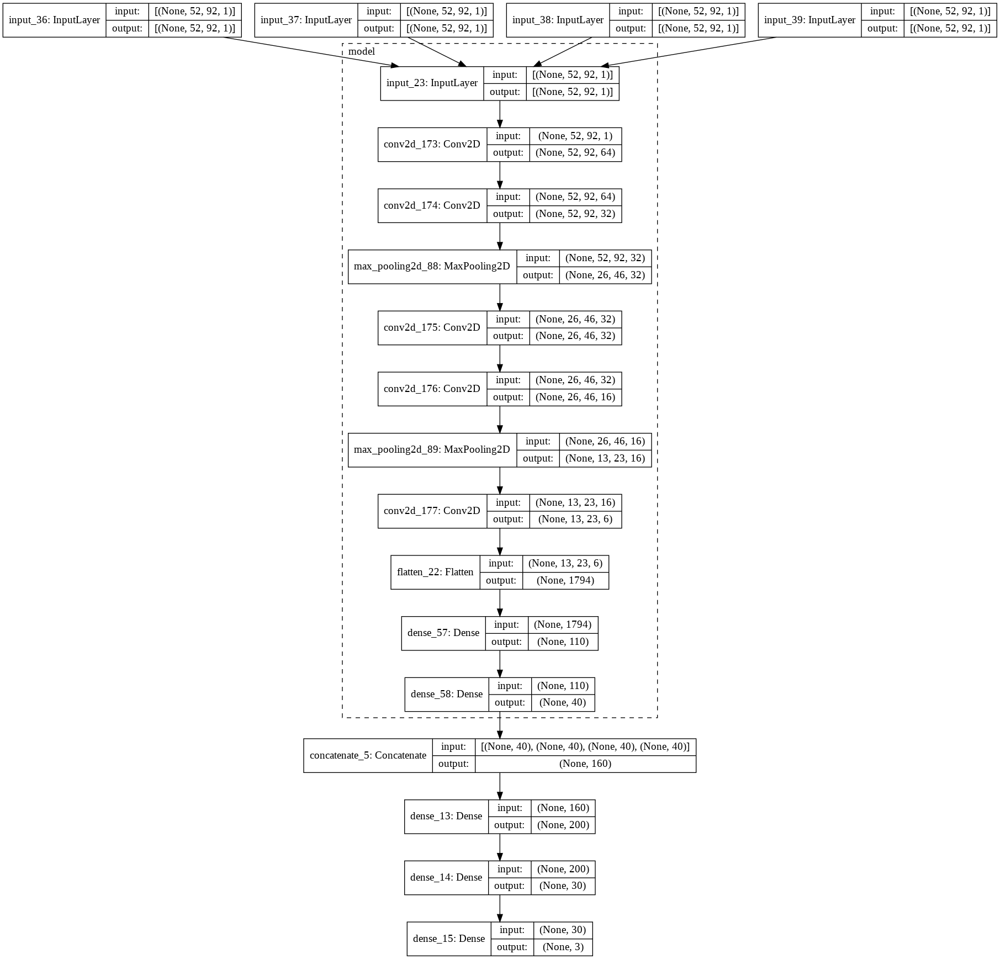

In [ ]:
#ahora con autoencoder en la parte inicial

encoder=tf.keras.models.load_model(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/encoder_modelountelescopio_110_mid45.h5")
encoder.trainable=False

model=model_multi_tel_encoder(len_inputs=4,input_shapes=[(52,92,1)],classes=3,last_dense=[200,30],encoder=encoder)
model.summary()
tf.keras.utils.plot_model(model,expand_nested=True,show_shapes=True)

In [ ]:
#primero limitamos los datos de la forma que hemos hecho antes
x_train_new=[]
x_test_new=[]
for i in range(4):
    x_train_new.append(x_train[i][:,1:-2,:-1])
    x_test_new.append(x_test[i][:,1:-2,:-1])

In [ ]:
lista_opciones={"layers":[[600,100,30],[500],[100],[100,60,40,20,10],[40,40,40,10],[20,20,20,20,20,10]]}
                #"dropout":[]}

#esto esta mal, el encoder debe ser cardado de cero cada vez


aux1=json.dumps(lista_opciones)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_parametros3_usoencoder2_trainableencoder.json","w") as fil:
    fil.write(aux1)

resultados={}
resultados2={}

for i in lista_opciones["layers"]:
    encoder=tf.keras.models.load_model(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_autoencoder/encoder_modelountelescopio_110_mid45.h5")
    encoder.trainable=False
    learning_rate=1e-4
    print(i,"\n","_____________________","\n")
    model=model_multi_tel_encoder(len_inputs=4,input_shapes=[(52,92,1)],classes=3,last_dense=i,encoder=encoder)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),loss="categorical_crossentropy",metrics=["accuracy"])
    hist=model.fit(x_train_new,y_train,epochs=60,validation_data=(x_test_new,y_test))
    resultados[f"{i}"]=hist.history
    learning_rate=1e-5
    encoder.trainable=True
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),loss="categorical_crossentropy",metrics=["accuracy"])
    hist2=model.fit(x_train_new,y_train,epochs=30,validation_data=(x_test_new,y_test))
    resultados2[f"{i}"]=hist2.history

aux2=json.dumps(resultados)
with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_resultados3_usoencoder2_trainableencoder_part1.json","w") as fil2:
    fil2.write(aux2)

aux2=json.dumps(resultados2)
with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_resultados3_usoencoder2_trainableencoder_part2.json","w") as fil2:
    fil2.write(aux2)


In [ ]:
#cargar datos para 6 tels
npy_base="/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/npy_data"

a=create_lista_list_runs(num_events=[3,39,39,39,20,39,39],random_select=False)
x_train_1,x_test_1,y_train_1,y_test_1=load_dataset_completo(npy_base,elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon'],labels_asign=[0,1,2,2,2,2,2],lista_list_runs=a,telescopios=[4,5,6,11,29,30],test_size=0.2,same_quant="all",fill=True,verbose=True)
x_train_2,x_test_2,y_train_2,y_test_2=load_dataset_completo(npy_base,elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon'],labels_asign=[0,1,2,2,2,2,2],lista_list_runs=a,telescopios=[4,5,6,11,31,32],test_size=0.2,same_quant="all",fill=True,verbose=True)
x_train_3,x_test_3,y_train_3,y_test_3=load_dataset_completo(npy_base,elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon'],labels_asign=[0,1,2,2,2,2,2],lista_list_runs=a,telescopios=[4,5,6,11,33,34],test_size=0.2,same_quant="all",fill=True,verbose=True)

In [ ]:
#juntamos todo 6 tels 
x_train=[]
x_test=[]

for i in range(6):
    x_train.append(np.concatenate((x_train_1[i],x_train_2[i],x_train_3[i]),axis=0))
    x_test.append(np.concatenate((x_test_1[i],x_test_2[i],x_test_3[i]),axis=0))

y_train=np.concatenate((y_train_1,y_train_2,y_train_3),axis=0)
y_test=np.concatenate((y_test_1,y_test_2,y_test_3),axis=0)



1

In [ ]:
#con 6 telescopios

ruta_save="/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif"
#param_distribs = {
# "filtros": [[[16,32],[32,64],[64],[32,16,4]], [[8,16],[32,32],[64],[32,16,4]],[[8,16,32],[32],[64],[16,4]]],
# "last_layers":[[200,50],[400,50],[50],[300]]
#}

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/parametros2.json","r") as json_file:
        param_distribs = json.load(json_file)

aux1=json.dumps(param_distribs)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/7tels_multiinput_parametros1.json","w") as fil:
    fil.write(aux1)

for m,i in enumerate(param_distribs["filtros"]):
    resultados={}
    for k in param_distribs["last_layers"]:
        start=time.time()
        print(i,k,"\n","_____________________","\n")
        model=model_multi_tel(len_inputs=6,input_shapes=[(55,93,1),(55,93,1),(55,93,1),(55,93,1),(84,56,1),(84,56,1)],classes=3,learning_rate=4e-6,
                  pre_proces_model=None,last_dense=k,filtros=i,common_pre=True)
        hist=model.fit(x_train,y_train,epochs=90,validation_data=(x_test,y_test))
        resultados[f"{i}, {k}"]=hist.history
        stop=time.time()
        print(stop-start,"\n")
    #despues de cada una de estas lo ponemos a guardar
    aux2=json.dumps(resultados)
    with open(f"/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/7tels_multiinput_resultados1_parte{m+1}.json","w") as fil2:
        fil2.write(aux2)


[[16, 32], [64, 128], [256, 512], [32, 6]] [300, 40] 
 _____________________ 

Epoch 1/90
493/493 [==============================] - 43s 83ms/step - loss: 4.9567 - accuracy: 0.8028 - val_loss: 4.4171 - val_accuracy: 0.9455
Epoch 2/90
493/493 [==============================] - 40s 81ms/step - loss: 4.3372 - accuracy: 0.9466 - val_loss: 4.0992 - val_accuracy: 0.9622
Epoch 3/90
493/493 [==============================] - 40s 81ms/step - loss: 4.0253 - accuracy: 0.9612 - val_loss: 3.8308 - val_accuracy: 0.9685
Epoch 4/90
493/493 [==============================] - 40s 81ms/step - loss: 3.7560 - accuracy: 0.9687 - val_loss: 3.5813 - val_accuracy: 0.9713
Epoch 5/90
493/493 [==============================] - 40s 81ms/step - loss: 3.5140 - accuracy: 0.9727 - val_loss: 3.3591 - val_accuracy: 0.9736
Epoch 6/90
493/493 [==============================] - 40s 81ms/step - loss: 3.2823 - accuracy: 0.9817 - val_loss: 3.1590 - val_accuracy: 0.9756
Epoch 7/90
493/493 [==============================] - 40s

In [ ]:
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/parametros2.json","r") as json_file:
        param_distribs = json.load(json_file)
param_distribs

{'filtros': [[[16, 32], [64, 128], [256, 512], [32, 6]],
  [[16, 32], [64, 64], [64, 64], [32, 6]],
  [[32, 64], [128, 256], [64, 32], [16, 6]]],
 'last_layers': [[300, 40], [200, 30], [60], [20]]}

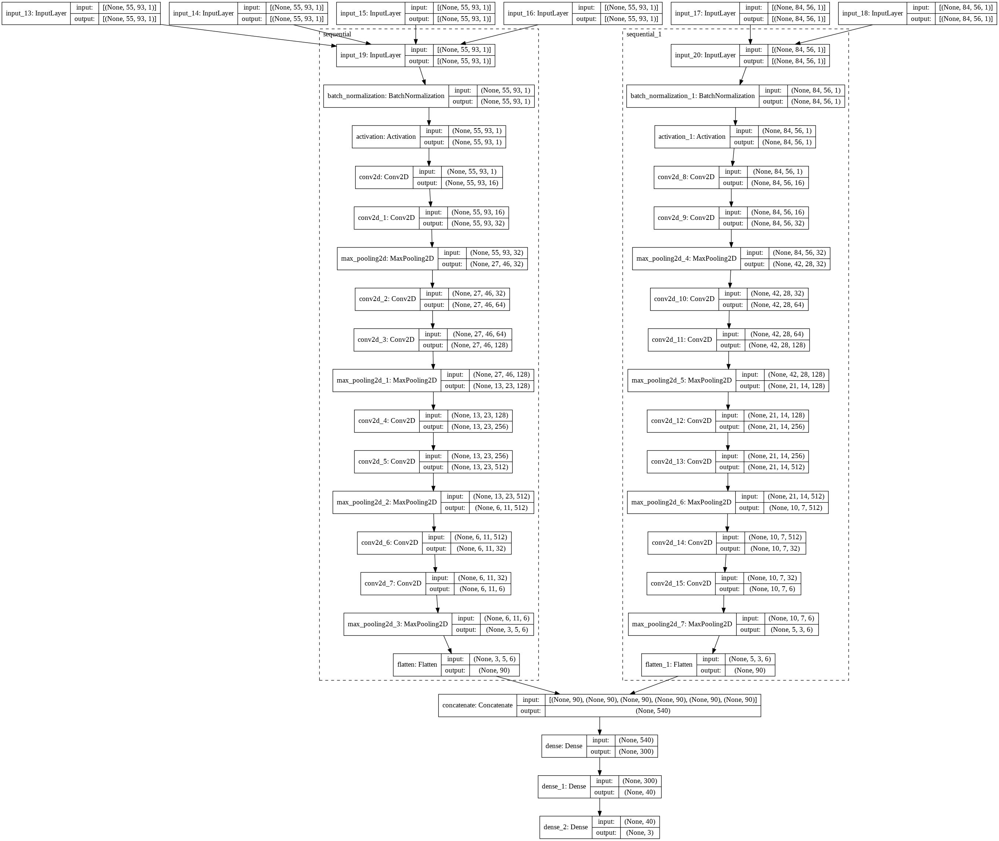

In [ ]:
tf.keras.utils.plot_model(model,show_shapes=1,expand_nested=1)

#Resultados multi-input

In [ ]:
os.listdir("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif")

['resultados1_parte1.json',
 'resultados1_parte2.json',
 'resultados1_parte3.json',
 'parametros1.json',
 'parametros2.json',
 'resultados2_parte1.json',
 'resultados2_parte2.json',
 'resultados2_parte3.json',
 'parametros3.json',
 'resultados3_parte1.json',
 'resultados3_parte2.json',
 'resultados3_parte3.json',
 'multiinput_parametros1.json',
 'multiinput_resultados1_parte1.json',
 'multiinput_resultados1_parte2.json',
 'multiinput_resultados1_parte3.json',
 'multiinput_parametros2.json',
 'multiinput_resultados2_parte1.json',
 'multiinput_resultados2_parte2.json',
 'multiinput_resultados2_parte3.json',
 'multiinput_parametros_usoencoder1.json',
 'multiinput_resultados_usoencoder1.json',
 'multiinput_parametros_usoencoder2_trainableencoder.json',
 'multiinput_resultados_usoencoder2_trainableencoder_part1.json',
 'multiinput_resultados_usoencoder2_trainableencoder_part2.json',
 '7tels_multiinput_parametros1.json',
 '7tels_multiinput_resultados1_parte1.json',
 '7tels_multiinput_resulta

In [ ]:
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_resultados1_parte1.json","r") as json_file:
    resultados1_1 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_resultados1_parte2.json","r") as json_file:
    resultados1_2 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_resultados1_parte3.json","r") as json_file:
    resultados1_3 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_parametros1.json","r") as json_file:
    parametros1 = json.load(json_file)



In [ ]:
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_resultados2_parte1.json","r") as json_file:
    resultados2_1 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_resultados2_parte2.json","r") as json_file:
    resultados2_2 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_resultados2_parte3.json","r") as json_file:
    resultados2_3 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_parametros2.json","r") as json_file:
    parametros2 = json.load(json_file)



In [ ]:
resultados=resultados1_1
resultados.update(resultados1_2)
resultados.update(resultados1_3)
resultados.update(resultados2_1)
resultados.update(resultados2_2)
resultados.update(resultados2_3)

In [ ]:
indices=list(resultados.keys())
len(indices)

24

In [ ]:
last_values=[resultados[indices[j]]["val_accuracy"][-1] for j in range(len(indices))]
indices_ordenados=np.argsort(last_values)
valores_ordenados=sorted(last_values)
labels=list(resultados.keys())

In [ ]:
for i in range(24):
    print(indices[indices_ordenados[i]],last_values[indices_ordenados[i]])

[[8, 16, 32], [32], [64], [16, 4]], [50] 0.9807935953140259
[[8, 16, 32], [32], [64], [16, 4]], [400, 50] 0.9820619821548462
[[8, 16], [32, 32], [64], [32, 16, 4]], [300] 0.9844174385070801
[[16, 32], [32, 64], [64], [32, 16, 4]], [400, 50] 0.9845986366271973
[[16, 32], [64, 64], [64, 64], [32, 6]], [60] 0.9851422309875488
[[8, 16], [32, 32], [64], [32, 16, 4]], [50] 0.9851422309875488
[[32, 64], [128, 256], [64, 32], [16, 6]], [20] 0.985323429107666
[[16, 32], [64, 128], [256, 512], [32, 6]], [200, 30] 0.985323429107666
[[8, 16, 32], [32], [64], [16, 4]], [200, 50] 0.985323429107666
[[32, 64], [128, 256], [64, 32], [16, 6]], [200, 30] 0.9855046272277832
[[8, 16], [32, 32], [64], [32, 16, 4]], [400, 50] 0.9858670234680176
[[16, 32], [64, 64], [64, 64], [32, 6]], [20] 0.9860482215881348
[[16, 32], [64, 64], [64, 64], [32, 6]], [200, 30] 0.9864105582237244
[[8, 16], [32, 32], [64], [32, 16, 4]], [200, 50] 0.9865917563438416
[[16, 32], [32, 64], [64], [32, 16, 4]], [50] 0.9865917563438416

In [ ]:
mejores_normal=[resultados[i]["val_accuracy"][-1] for i in resultados]
mejores=sorted([resultados[i]["val_accuracy"][-1] for i in resultados])[::-1]
indices=list(resultados.keys())
sortindices=np.argsort([resultados[i]["val_accuracy"][-1] for i in resultados])

In [ ]:
print(mejores)
print(len(list(resultados.keys())))

[0.9889472723007202, 0.988766074180603, 0.9885848760604858, 0.9884036779403687, 0.9878601431846619, 0.9874977469444275, 0.9873165488243103, 0.9871353507041931, 0.9867729544639587, 0.9865917563438416, 0.9865917563438416, 0.9864105582237244, 0.9860482215881348, 0.9858670234680176, 0.9855046272277832, 0.985323429107666, 0.985323429107666, 0.985323429107666, 0.9851422309875488, 0.9851422309875488, 0.9845986366271973, 0.9844174385070801, 0.9820619821548462, 0.9807935953140259]
24


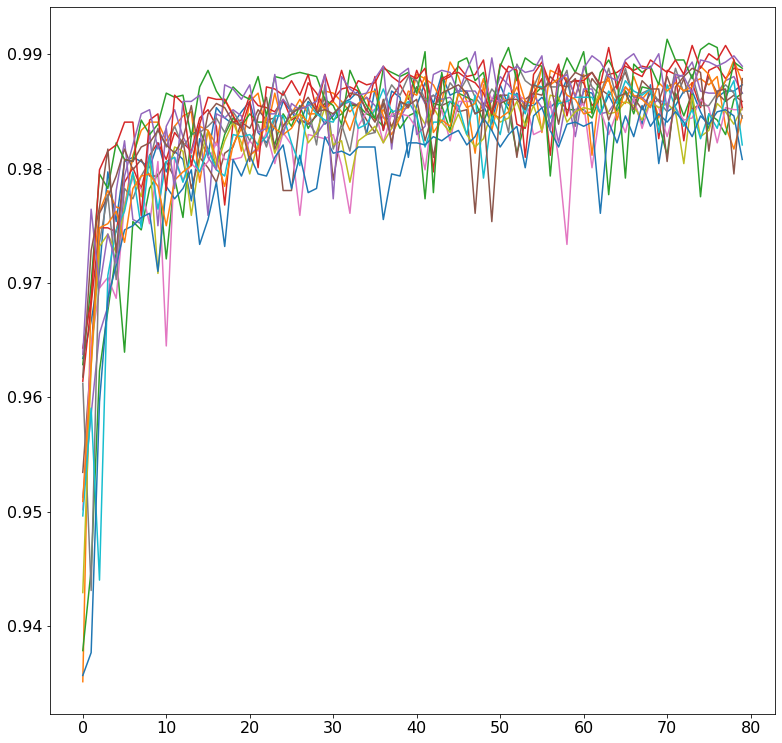

In [ ]:
plt.figure(figsize=(13,13))
for i in resultados:
    plt.plot(resultados[i]["val_accuracy"])

In [ ]:
import matplotlib.patches as patches
import matplotlib

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


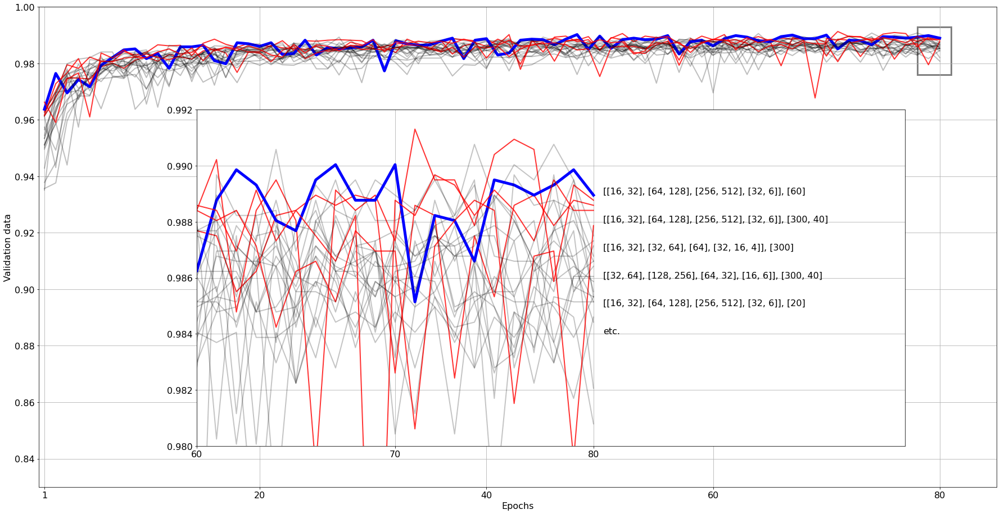

In [ ]:
y_aux=np.linspace(0.985,0.989,5)
fig=plt.figure(figsize=(25,13))
for i in resultados:
    if resultados[i]["val_accuracy"][-1] in mejores[:5]:
        if resultados[i]["val_accuracy"][-1] == mejores[0]:
            plt.plot(np.arange(1,1+len(resultados[i]["val_accuracy"])),resultados[i]["val_accuracy"],"b",linewidth=5)
        else:
            plt.plot(np.arange(1,1+len(resultados[i]["val_accuracy"])),resultados[i]["val_accuracy"],"r",alpha=0.8,linewidth=2)

    else:
        plt.plot(np.arange(1,1+len(resultados[i]["val_accuracy"])),resultados[i]["val_accuracy"],"k",alpha=0.25,linewidth=2)

    #plt.text(95,resultados[i]["val_accuracy"][-1],i)
plt.xticks([1,20,40,60,80])
plt.ylim([0.83,1])
plt.xlim([0.5,85])
plt.xlabel("Epochs",fontsize=16)
plt.ylabel("Validation data",fontsize=16)
rect = patches.Rectangle((78, 0.976), 3, 0.017, linewidth=3, edgecolor='grey', facecolor='none')
ax1=fig.gca()
ax1.add_patch(rect)
plt.grid()


ax2=fig.add_axes([0.20,0.14,0.70,0.64])
for i in resultados:
    if resultados[i]["val_accuracy"][-1] in mejores[:5]:
        if resultados[i]["val_accuracy"][-1] == mejores[0]:
            plt.plot(np.arange(1,1+len(resultados[i]["val_accuracy"])),resultados[i]["val_accuracy"],"b",linewidth=5)
        else:
            plt.plot(np.arange(1,1+len(resultados[i]["val_accuracy"])),resultados[i]["val_accuracy"],"r",alpha=0.8,linewidth=2)

    else:
        plt.plot(np.arange(1,1+len(resultados[i]["val_accuracy"])),resultados[i]["val_accuracy"],"k",alpha=0.23,linewidth=2)
    #plt.text(80.1,resultados[i]["val_accuracy"][-1],i,fontsize=15)

plt.ylim([0.98,0.992])
plt.xlim([60,95.7])
plt.xticks([60,70,80])
plt.grid()
matplotlib.rcParams.update({'font.size': 16})

for j,i in enumerate(sortindices[-5:]):
    plt.text(80.5,y_aux[j],indices[i])
plt.text(80.5,0.984,"etc.")

plt.tight_layout()
plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/accs_4tels_sinencoder_1.png")

In [ ]:
os.listdir("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif")

['resultados1_parte1.json',
 'resultados1_parte2.json',
 'resultados1_parte3.json',
 'parametros1.json',
 'parametros2.json',
 'resultados2_parte1.json',
 'resultados2_parte2.json',
 'resultados2_parte3.json',
 'parametros3.json',
 'resultados3_parte1.json',
 'resultados3_parte2.json',
 'resultados3_parte3.json',
 'multiinput_parametros1.json',
 'multiinput_resultados1_parte1.json',
 'multiinput_resultados1_parte2.json',
 'multiinput_resultados1_parte3.json',
 'multiinput_parametros2.json',
 'multiinput_resultados2_parte1.json',
 'multiinput_resultados2_parte2.json',
 'multiinput_resultados2_parte3.json',
 'multiinput_parametros_usoencoder1.json',
 'multiinput_resultados_usoencoder1.json',
 'multiinput_parametros_usoencoder2_trainableencoder.json',
 'multiinput_resultados_usoencoder2_trainableencoder_part1.json',
 'multiinput_resultados_usoencoder2_trainableencoder_part2.json',
 '7tels_multiinput_parametros1.json',
 '7tels_multiinput_resultados1_parte1.json',
 '7tels_multiinput_resulta

In [ ]:
#ahora con autoencoder

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_resultados2_usoencoder2_trainableencoder_part1.json","r") as json_file:
    resultados1_1 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_resultados2_usoencoder2_trainableencoder_part2.json","r") as json_file:
    resultados1_2 = json.load(json_file)


with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_parametros2_usoencoder2_trainableencoder.json","r") as json_file:
    parametros1 = json.load(json_file)


with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_resultados3_usoencoder_trainableencoder_part1.json","r") as json_file:
    resultados2_1 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_resultados3_usoencoder_trainableencoder_part2.json","r") as json_file:
    resultados2_2 = json.load(json_file)


with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_parametros3_usoencoder_trainableencoder.json","r") as json_file:
    parametros2 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_resultados4_usoencoder_trainableencoder_part1.json","r") as json_file:
    resultados3_1 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_resultados4_usoencoder_trainableencoder_part2.json","r") as json_file:
    resultados3_2 = json.load(json_file)


with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/multiinput_parametros4_usoencoder_trainableencoder.json","r") as json_file:
    parametros3 = json.load(json_file)




In [ ]:
#sacamos los maximos
#AMBAS PARTED POR SEPARADO

resultados_1parte=resultados1_1
resultados_1parte.update(resultados2_1)
resultados_1parte.update(resultados3_1)

resultados_2parte=resultados1_2
resultados_2parte.update(resultados2_2)
resultados_2parte.update(resultados3_2)


ultimos_1parte=[resultados_1parte[i]["accuracy"][-1] for i in resultados_1parte]
ultimos_2parte=[resultados_2parte[i]["accuracy"][-1] for i in resultados_2parte]

mejores_1parte=sorted(ultimos_1parte)
mejores_2parte=sorted(ultimos_2parte)

indices_1parte=list(resultados_1parte.keys())
indices_2parte=list(resultados_2parte.keys())
indicesord_1parte=np.argsort(ultimos_1parte)
indicesord_2parte=np.argsort(ultimos_2parte)


In [ ]:
len(indices_2parte)

12

In [ ]:
for j,i in enumerate(indicesord_1parte):
    print(f"{j+1} peor",ultimos_1parte[i],indices_1parte[i])

for j,i in enumerate(indicesord_2parte):
    print(f"{j+1} peor",ultimos_2parte[i],indices_2parte[i])


1 peor 0.9513207674026489 [10]
2 peor 0.9689576029777527 [20]
3 peor 0.9745333790779114 [30, 10]
4 peor 0.9806232452392578 [20, 20, 20, 20, 20, 10]
5 peor 0.9869107604026794 [40, 20, 16, 16]
6 peor 0.9890857338905334 [40, 40, 40, 10]
7 peor 0.9920515418052673 [500]
8 peor 0.992644727230072 [80, 50, 20]
9 peor 0.9948987364768982 [400, 10]
10 peor 0.9952942132949829 [100, 60, 40, 20, 10]
11 peor 0.9957687258720398 [600, 100, 30]
12 peor 0.9972714185714722 [100]
1 peor 0.9874248504638672 [20, 20, 20, 20, 20, 10]
2 peor 0.9947801232337952 [40, 40, 40, 10]
3 peor 0.9953733086585999 [500]
4 peor 0.9961642026901245 [400, 10]
5 peor 0.9981414079666138 [30, 10]
6 peor 0.9987345933914185 [100, 60, 40, 20, 10]
7 peor 0.9987741112709045 [10]
8 peor 0.9990113973617554 [80, 50, 20]
9 peor 0.9993277192115784 [600, 100, 30]
10 peor 0.9994068145751953 [40, 20, 16, 16]
11 peor 0.9994859099388123 [100]
12 peor 0.9997231960296631 [20]


In [ ]:
len(resultados2_1[list(resultados2_1.keys())[2]]["val_accuracy"])

60

In [ ]:
#juntamos los que tienen dos intervalos
final_resultados={}
for i in resultados1_1:
    append_aux=np.concatenate((resultados1_1[i]["val_accuracy"],resultados1_2[i]["val_accuracy"]))
    final_resultados[i]=append_aux

for i in resultados2_1:
    append_aux=np.concatenate((resultados2_1[i]["val_accuracy"],resultados2_2[i]["val_accuracy"]))
    final_resultados[i]=append_aux

for i in resultados3_1:
    append_aux=np.concatenate((resultados3_1[i]["val_accuracy"],resultados3_2[i]["val_accuracy"]))
    final_resultados[i]=append_aux

In [ ]:
mejores_normal=[final_resultados[i][89] for i in final_resultados]
mejores=sorted([final_resultados[i][89] for i in final_resultados])[::-1]
indices=list(final_resultados.keys())
sortindices=np.argsort([final_resultados[i][89] for i in final_resultados])

In [ ]:
print(mejores)

[0.9821287393569946, 0.9788075089454651, 0.978649377822876, 0.9781749248504639, 0.9775422811508179, 0.9759607911109924, 0.9758026003837585, 0.9758026003837585, 0.9743792414665222, 0.9697928428649902, 0.9688438773155212, 0.9675787091255188]


In [ ]:
import matplotlib.patches as patches
import matplotlib 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


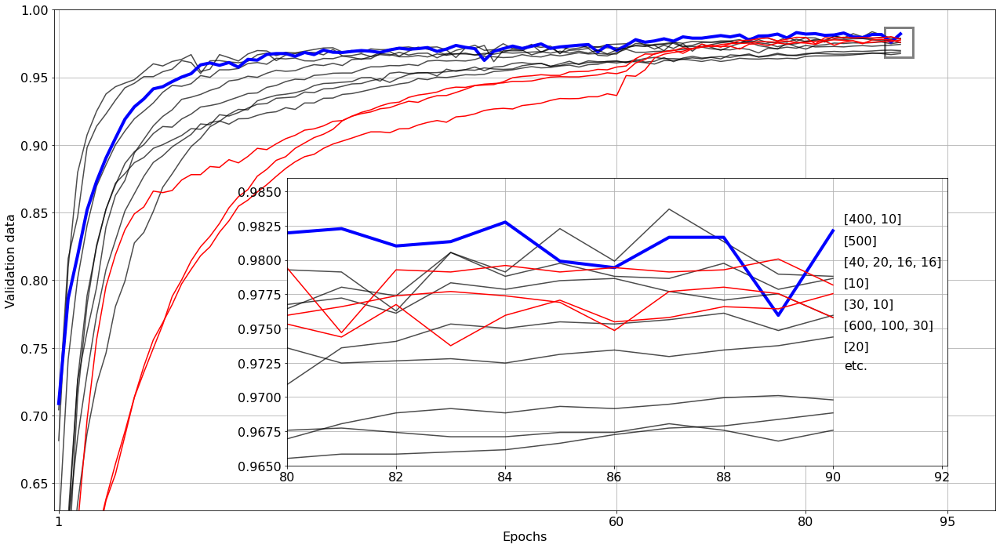

In [ ]:
y_aux=np.linspace(0.9734,0.9827,7)
fig=plt.figure(figsize=(18,10))
for j,i in enumerate(final_resultados):
    if final_resultados[i][-1] in mejores[:3]:
        if final_resultados[i][-1] == mejores[0]:
            plt.plot(np.arange(1,91),final_resultados[i][:90],"b",linewidth=4)

        else:
            plt.plot(np.arange(1,91),final_resultados[i][:90],"k",alpha=0.7)
    elif i in ["[10]","[20]","[30, 10]"]:
        plt.plot(np.arange(1,91),final_resultados[i][:90],"r")
    else:
        plt.plot(np.arange(1,91),final_resultados[i][:90],"k",alpha=0.7)

    #plt.text(95,final_resultados[i][-1],i)
plt.xticks([1,60,80,95])
plt.ylim([0.63,1])
plt.xlim([0.5,100])
plt.xlabel("Epochs",fontsize=16)
plt.ylabel("Validation data",fontsize=16)
rect = patches.Rectangle((88.3, 0.9650), 3, 0.022, linewidth=3, edgecolor='grey', facecolor='none')
ax1=fig.gca()
ax1.add_patch(rect)
plt.grid()


ax2=fig.add_axes([0.29,0.16,0.65,0.51])
for i in final_resultados:
    if final_resultados[i][-1] in mejores[:3]:
        if final_resultados[i][-1] == mejores[0]:
            plt.plot(np.arange(1,91),final_resultados[i][:90],"b",linewidth=4)

        else:
            plt.plot(np.arange(1,91),final_resultados[i][:90],"k",alpha=0.7)
    elif i in ["[10]","[20]","[30, 10]"]:
        plt.plot(np.arange(1,91),final_resultados[i][:90],"r")
    else:
        plt.plot(np.arange(1,91),final_resultados[i][:90],"k",alpha=0.7)

plt.ylim([0.965,0.986])
plt.xlim([80,92.1])
plt.grid()
matplotlib.rcParams.update({'font.size': 16})
plt.tight_layout()
for j,i in enumerate(sortindices[-7:]):
    plt.text(90.2,y_aux[j],indices[i])

plt.text(90.2,0.9720,"etc.")

plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/train_withencoder_4tels.png",pdi=230)

#Resultados arquetecturas 6 tels

In [ ]:
os.listdir("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif")

['resultados1_parte1.json',
 'resultados1_parte2.json',
 'resultados1_parte3.json',
 'parametros1.json',
 'parametros2.json',
 'resultados2_parte1.json',
 'resultados2_parte2.json',
 'resultados2_parte3.json',
 'parametros3.json',
 'resultados3_parte1.json',
 'resultados3_parte2.json',
 'resultados3_parte3.json',
 'multiinput_parametros1.json',
 'multiinput_resultados1_parte1.json',
 'multiinput_resultados1_parte2.json',
 'multiinput_resultados1_parte3.json',
 'multiinput_parametros2.json',
 'multiinput_resultados2_parte1.json',
 'multiinput_resultados2_parte2.json',
 'multiinput_resultados2_parte3.json',
 'multiinput_parametros_usoencoder1.json',
 'multiinput_resultados_usoencoder1.json',
 'multiinput_parametros_usoencoder2_trainableencoder.json',
 'multiinput_resultados_usoencoder2_trainableencoder_part1.json',
 'multiinput_resultados_usoencoder2_trainableencoder_part2.json',
 '7tels_multiinput_parametros1.json',
 '7tels_multiinput_resultados1_parte1.json',
 '7tels_multiinput_resulta

In [ ]:

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/7tels_multiinput_resultados1_parte1.json","r") as json_file:
    resultados1_1 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/7tels_multiinput_resultados1_parte2.json","r") as json_file:
    resultados1_2 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/7tels_multiinput_resultados1_parte3.json","r") as json_file:
    resultados1_3 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/7tels_multiinput_parametros1.json","r") as json_file:
    parametros1 = json.load(json_file)



resultados=resultados1_1
resultados.update(resultados1_2)
resultados.update(resultados1_3)

In [ ]:
indices=list(resultados.keys())
len(indices)

12

In [ ]:
last_values=[resultados[indices[j]]["accuracy"][-1] for j in range(len(indices))]
indices_ordenados=np.argsort(last_values)
valores_ordenados=sorted(last_values)
labels=list(resultados.keys())

In [ ]:
for i in range(12):
    print(indices[indices_ordenados[i]],last_values[indices_ordenados[i]])

[[16, 32], [64, 128], [256, 512], [32, 6]], [200, 30] 0.9956849813461304
[[16, 32], [64, 64], [64, 64], [32, 6]], [20] 0.9985405206680298
[[16, 32], [64, 128], [256, 512], [32, 6]], [20] 0.9996827244758606
[[32, 64], [128, 256], [64, 32], [16, 6]], [300, 40] 0.9996827244758606
[[32, 64], [128, 256], [64, 32], [16, 6]], [200, 30] 0.9998096227645874
[[16, 32], [64, 64], [64, 64], [32, 6]], [300, 40] 0.9998731017112732
[[32, 64], [128, 256], [64, 32], [16, 6]], [60] 0.9998731017112732
[[16, 32], [64, 64], [64, 64], [32, 6]], [200, 30] 0.9999365210533142
[[16, 32], [64, 64], [64, 64], [32, 6]], [60] 0.9999365210533142
[[16, 32], [64, 128], [256, 512], [32, 6]], [300, 40] 1.0
[[16, 32], [64, 128], [256, 512], [32, 6]], [60] 1.0
[[32, 64], [128, 256], [64, 32], [16, 6]], [20] 1.0


In [ ]:
mejores_normal=[resultados[i]["val_accuracy"][-1] for i in resultados]
mejores=sorted([resultados[i]["val_accuracy"][-1] for i in resultados])[::-1]
indices=list(resultados.keys())
sortindices=np.argsort([resultados[i]["val_accuracy"][-1] for i in resultados])

In [ ]:
print(mejores)

[0.9906138777732849, 0.9906138777732849, 0.9906138777732849, 0.9903602004051208, 0.9903602004051208, 0.9901065230369568, 0.9893454909324646, 0.9893454909324646, 0.9890918135643005, 0.9885844588279724, 0.9885844588279724, 0.9835109114646912]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


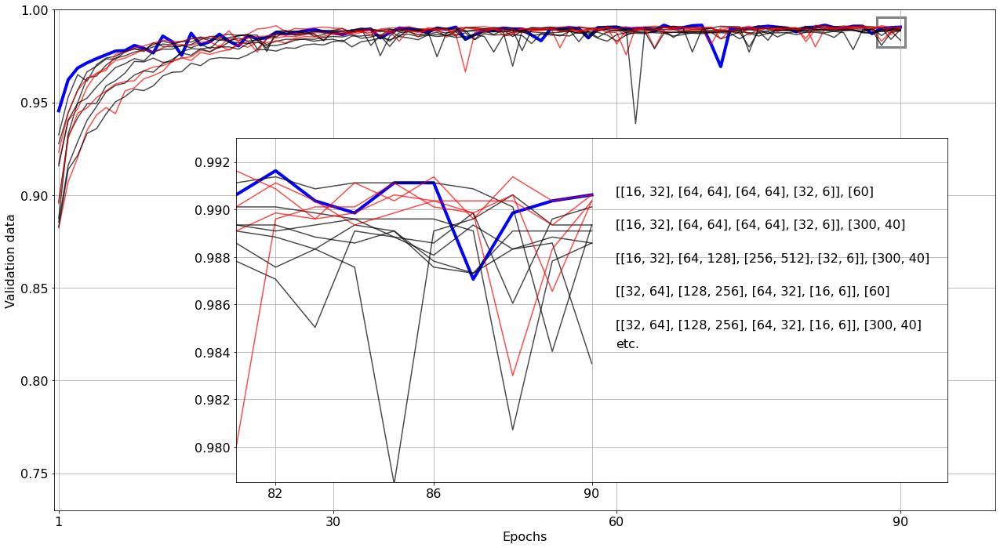

In [ ]:
y_aux=np.linspace(0.985,0.992,6)
fig=plt.figure(figsize=(18,10))
aa=True
for i in resultados:
    if resultados[i]["val_accuracy"][-1] in mejores[:5]:
        if resultados[i]["val_accuracy"][-1] == mejores[0] and aa:
            plt.plot(np.arange(1,1+len(resultados[i]["val_accuracy"])),resultados[i]["val_accuracy"],"b",linewidth=4)
            aa=False
        else:
            plt.plot(np.arange(1,1+len(resultados[i]["val_accuracy"])),resultados[i]["val_accuracy"],"r",alpha=0.7)
        
    else:
        plt.plot(np.arange(1,1+len(resultados[i]["val_accuracy"])),resultados[i]["val_accuracy"],"k",alpha=0.7)

    #plt.text(95,resultados[i]["val_accuracy"][-1],i)
plt.xticks([1,30,60,90])
plt.ylim([0.73,1])
plt.xlim([0.5,100])
plt.xlabel("Epochs",fontsize=16)
plt.ylabel("Validation data",fontsize=16)
rect = patches.Rectangle((87.5, 0.980), 3, 0.016, linewidth=3, edgecolor='grey', facecolor='none')
ax1=fig.gca()
ax1.add_patch(rect)
plt.grid()

aa=True

ax2=fig.add_axes([0.24,0.13,0.70,0.61])
for i in resultados:
    if resultados[i]["val_accuracy"][-1] in mejores[:5]:
        if resultados[i]["val_accuracy"][-1] == mejores[0] and aa :
            plt.plot(np.arange(1,1+len(resultados[i]["val_accuracy"])),resultados[i]["val_accuracy"],"b",linewidth=4)
            aa=False
        else:
            plt.plot(np.arange(1,1+len(resultados[i]["val_accuracy"])),resultados[i]["val_accuracy"],"r",alpha=0.7)
        
    else:
        plt.plot(np.arange(1,1+len(resultados[i]["val_accuracy"])),resultados[i]["val_accuracy"],"k",alpha=0.7)
    
plt.xticks([82,86,90])

plt.ylim([0.9785,0.993])
plt.xlim([81,99])
plt.grid()
matplotlib.rcParams.update({'font.size': 16})
plt.tight_layout()
for j,i in enumerate(sortindices[-5:]):
    plt.text(90.6,y_aux[j],indices[i])
plt.text(90.6,0.9842,"etc.")
0.985
plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/resultados_classif/accs_aquitecturas_6tels.png",pdi=230)

In [ ]:
#vamos a ver la arquitectura 


#Diferentes agrupaciones 1 telescopio

In [ ]:
#cargamos los datos una vez con diferentes labels 
npy_base="/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/npy_data"
a=create_lista_list_runs(num_events=[8,39,20,35,20,39,35],random_select=False)
x_train,x_test,y_train,y_test=load_dataset_completo(npy_base,elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon'],labels_asign=[0,1,2,3,4,5,6],lista_list_runs=a,telescopios=[4],test_size=0.2,same_quant="same",fill=True,verbose=True,categorical=False)

gamma 1 [1 2 3 4 5 6 7 8] (1, 1999)
gamma 2 [1 2 3 4 5 6 7 8] (1, 1999)
gamma 3 [1 2 3 4 5 6 7 8] (1, 1999)
gamma 4 [1 2 3 4 5 6 7 8] (1, 1998)
gamma 5 [1 2 3 4 5 6 7 8] (1, 1998)
gamma 6 [1 2 3 4 5 6 7 8] (1, 1999)
gamma 7 [1 2 3 4 5 6 7 8] (1, 1999)
gamma 8 [1 2 3 4 5 6 7 8] (1, 1998)
electron 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39] (1, 214)
electron 2 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39] (1, 194)
electron 3 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39] (1, 172)
electron 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39] (1, 210)
electron 5 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39] (1, 203)
electron 6 [

Epoch 1/70
675/675 [==============================] - 10s 14ms/step - loss: 0.9944 - accuracy: 0.4649 - val_loss: 0.9301 - val_accuracy: 0.6261
Epoch 2/70
675/675 [==============================] - 9s 14ms/step - loss: 0.8275 - accuracy: 0.6972 - val_loss: 0.6562 - val_accuracy: 0.7677
Epoch 3/70
675/675 [==============================] - 9s 13ms/step - loss: 0.5745 - accuracy: 0.7781 - val_loss: 0.5256 - val_accuracy: 0.7903
Epoch 4/70
675/675 [==============================] - 9s 13ms/step - loss: 0.5232 - accuracy: 0.7907 - val_loss: 0.5048 - val_accuracy: 0.7955
Epoch 5/70
675/675 [==============================] - 9s 14ms/step - loss: 0.5061 - accuracy: 0.7954 - val_loss: 0.4930 - val_accuracy: 0.7994
Epoch 6/70
675/675 [==============================] - 9s 14ms/step - loss: 0.4945 - accuracy: 0.7987 - val_loss: 0.4861 - val_accuracy: 0.8014
Epoch 7/70
675/675 [==============================] - 9s 14ms/step - loss: 0.4856 - accuracy: 0.8013 - val_loss: 0.4812 - val_accuracy: 0.804

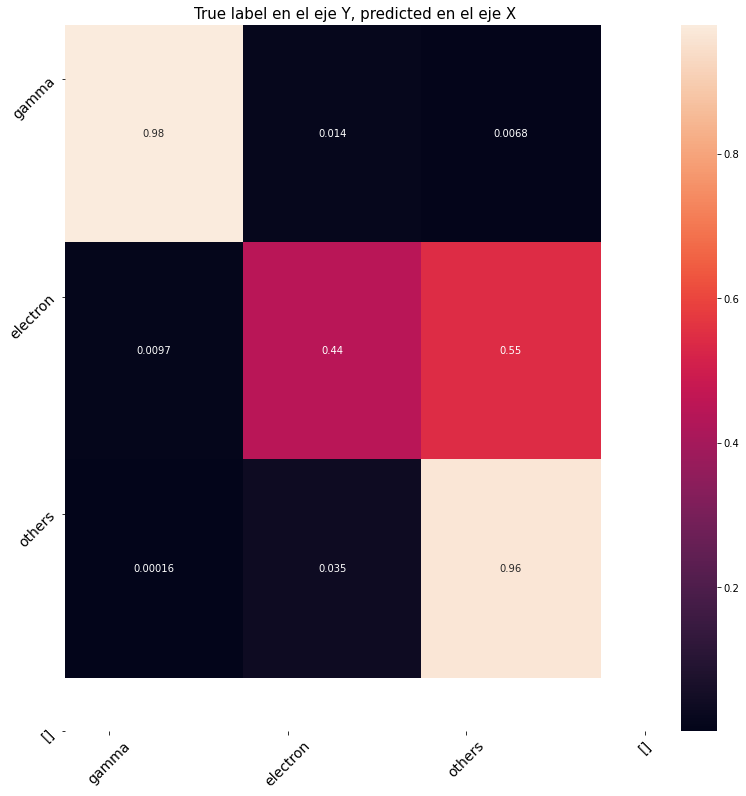

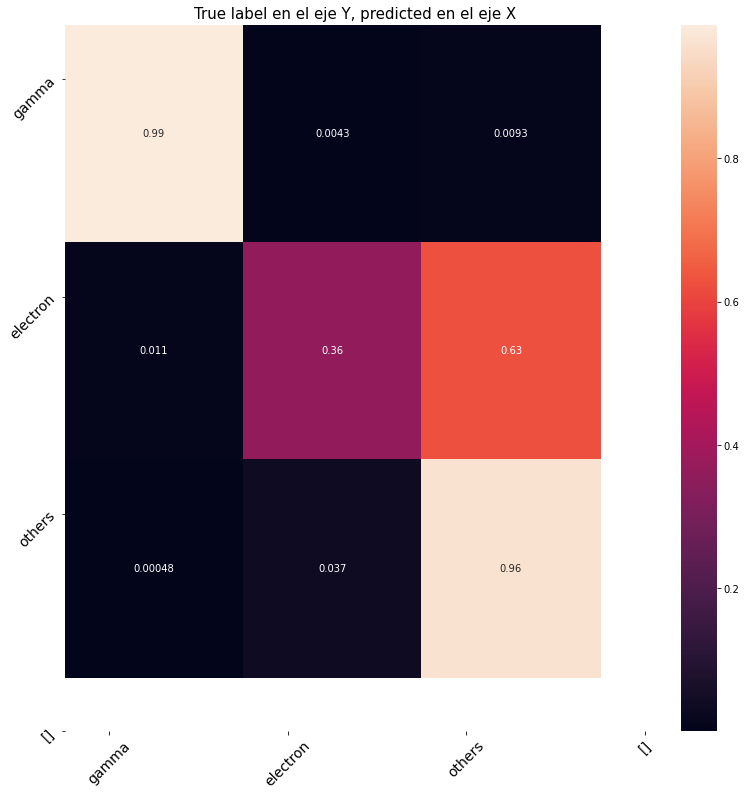

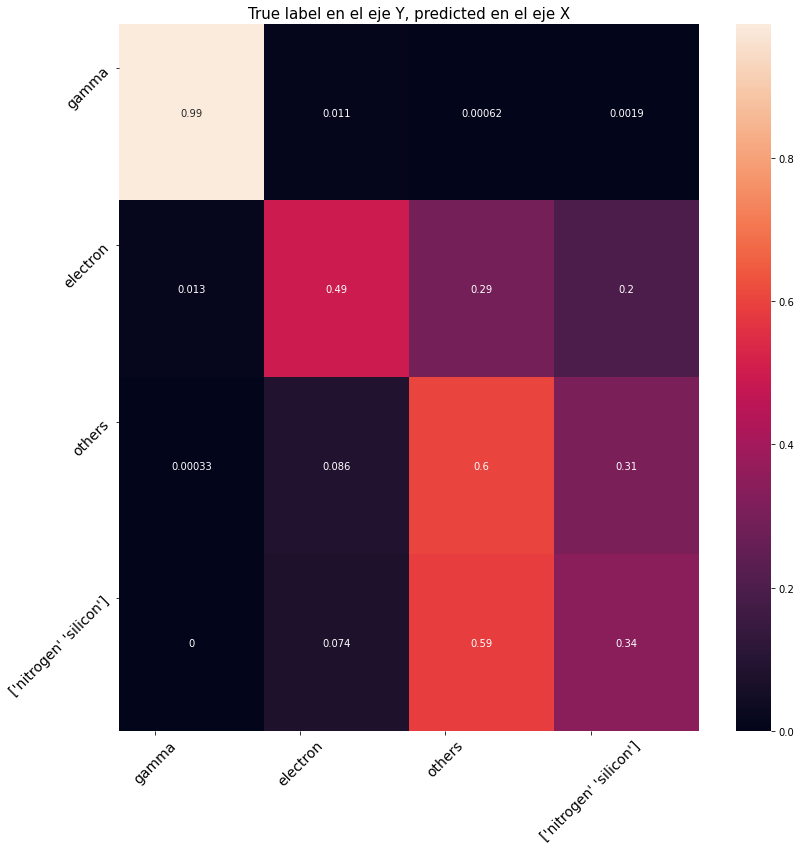

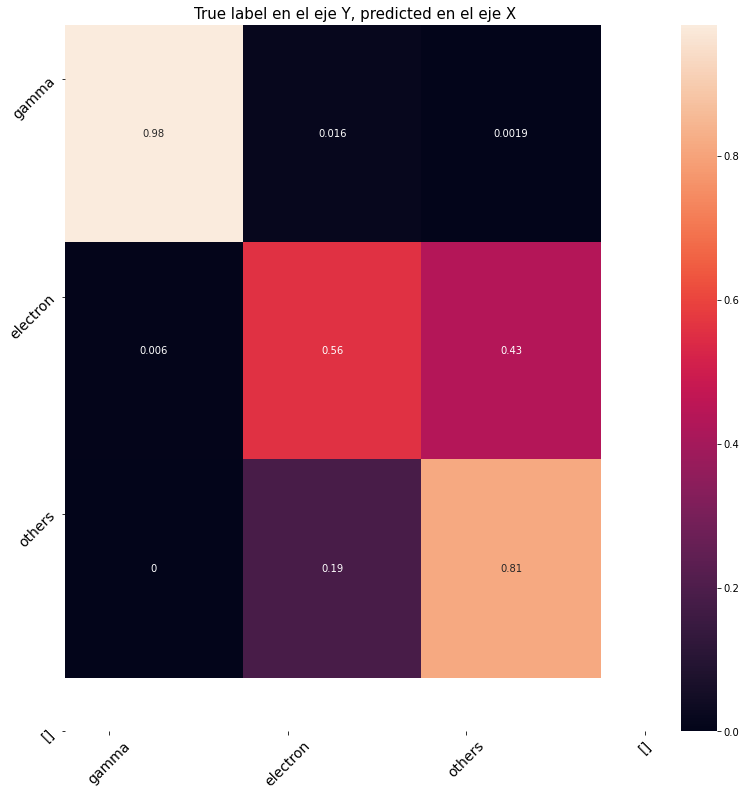

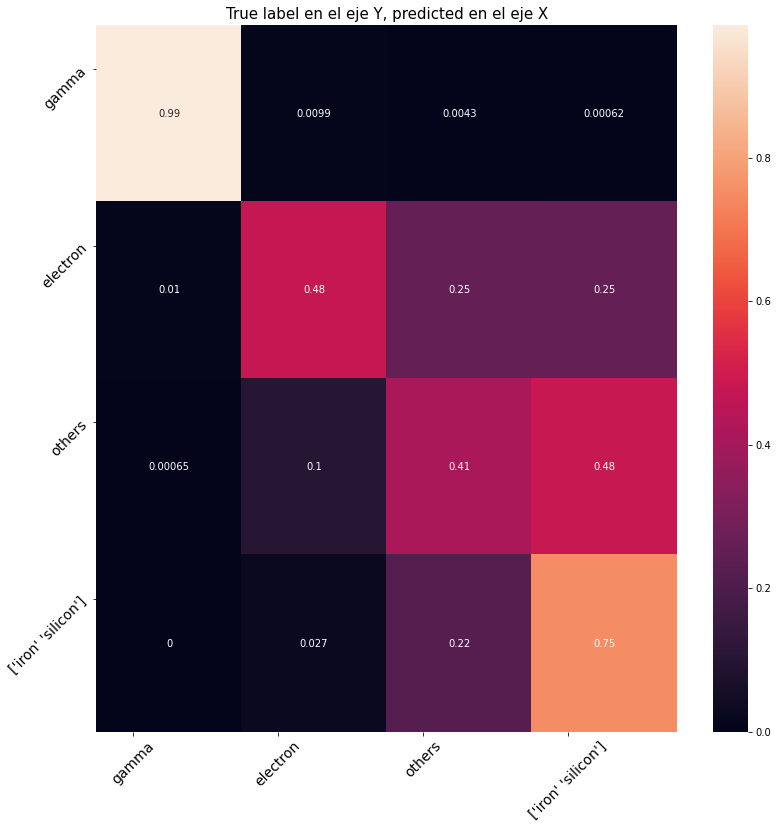

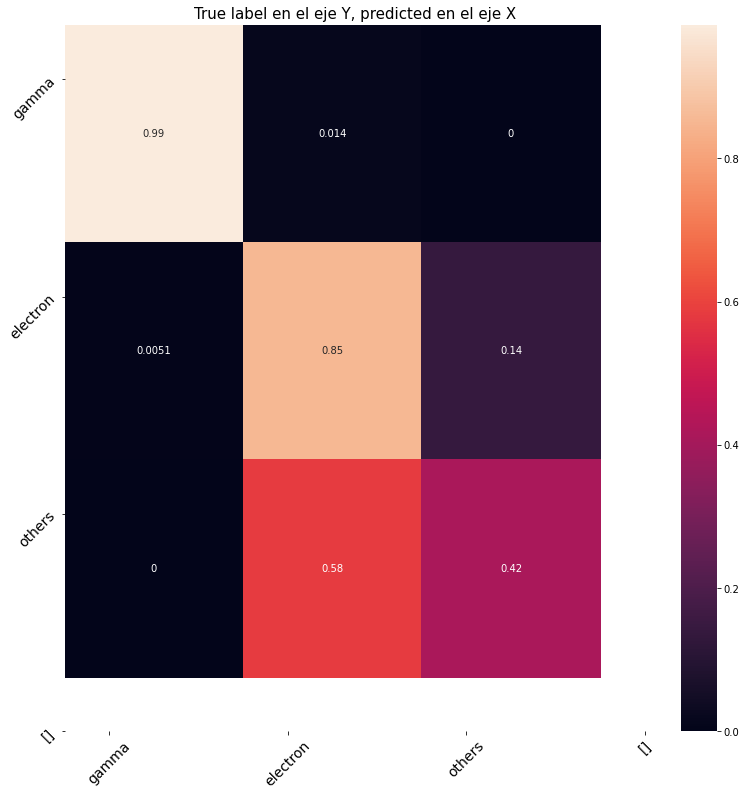

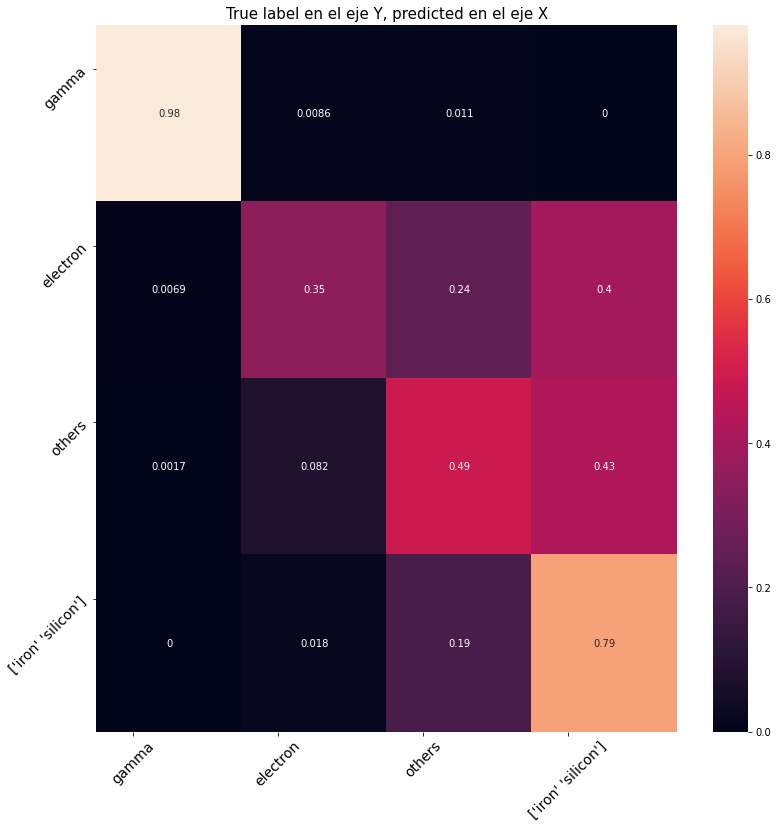

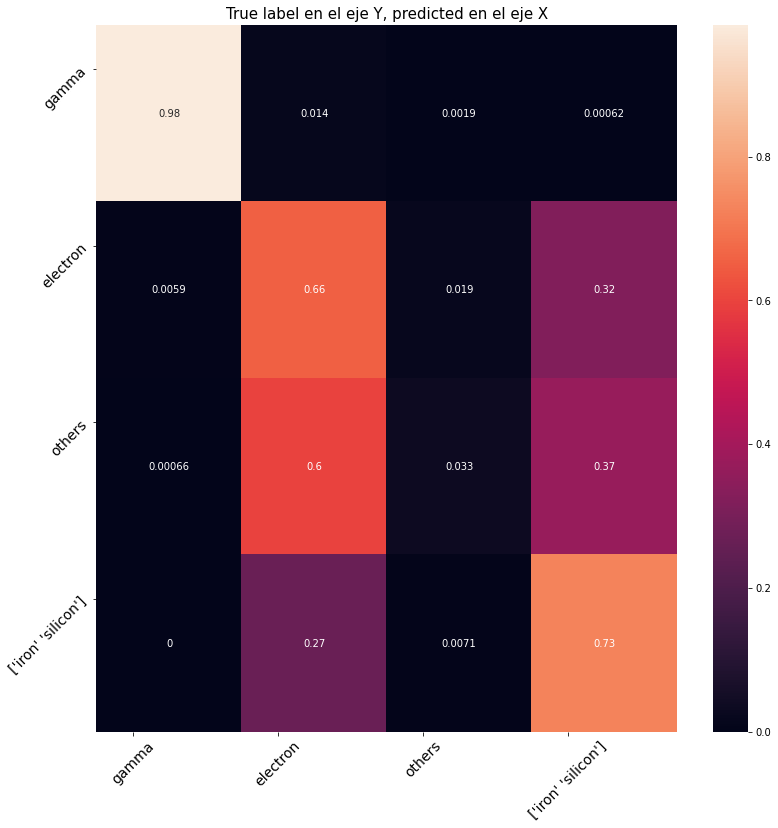

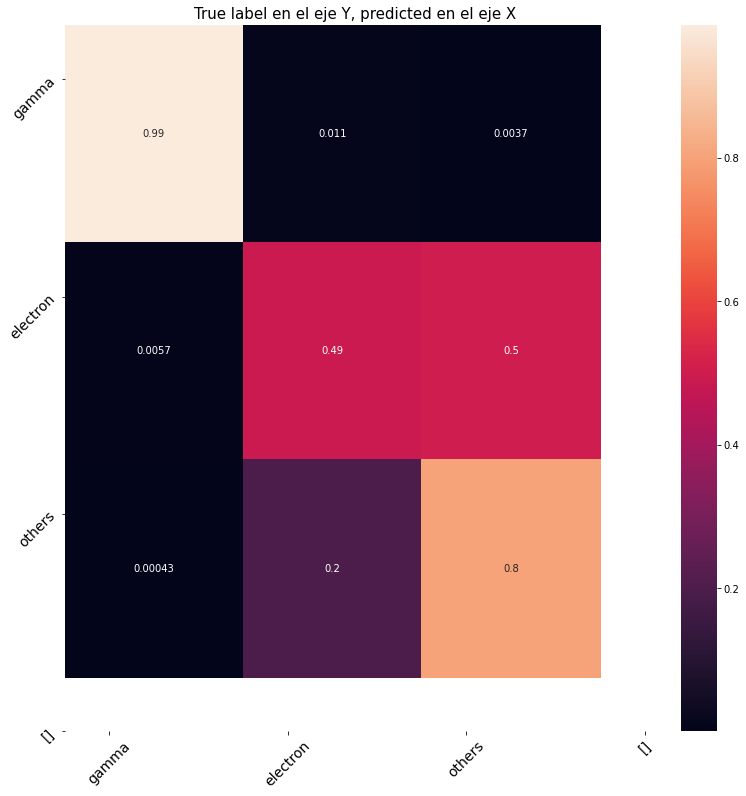

In [ ]:
#prueba 1 telescopio diferentes agrupaciones 
#vamos a darle diferentes labels
elements=np.array(["gamma","electron",'proton', 'helium', 'iron', 'nitrogen', 'silicon'])
aux_save_dir="/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_1_telescopio"
lista_labels=np.array([[0,1,1,2,2,2,2],[0,1,2,1,2,2,2],[0,1,1,2,2,3,3],[0,1,1,1,2,2,2],[0,1,1,2,3,2,3],[0,1,1,1,2,1,2],[0,1,2,2,3,1,3],[0,1,1,2,3,1,3],[0,1,1,2,2,1,2]])
# Con dos lista_labels=np.array([[0,1,3,3,2,2,2],[0,1,3,2,3,2,2],[0,1,3,2,2,3,2],[0,1,3,2,2,2,3],[0,1,2,3,3,2,2],[0,1,2,3,2,3,2],[0,1,2,3,2,2,3],[0,1,2,2,3,3,2],[0,1,2,2,3,2,3],[0,1,2,2,2,3,3]])
"""
[0,1,3,2,2,2,2],[0,1,2,3,2,2,2],[0,1,2,2,3,2,2],[0,1,2,2,2,3,2],[0,1,2,2,2,2,3],[0,1,2,2,2,2,2],
                       [0,1,3,3,2,2,2],[0,1,3,2,3,2,2],[0,1,3,2,2,3,2],[0,1,3,2,2,2,3],[0,1,2,3,3,2,2],[0,1,2,3,2,3,2],[0,1,2,3,2,2,3],

[0,1,2,2,3,3,2],[0,1,2,2,3,2,3],[0,1,2,2,2,3,3],
                       [0,1,3,3,3,2,2],[0,1,3,3,2,3,2],[0,1,3,3,2,2,3],[0,1,3,2,3,3,2],[0,1,3,2,3,2,3],[0,1,3,2,2,3,3],[0,1,2,3,3,3,2],[0,1,2,3,3,2,3],[0,1,2,3,2,3,3],[0,1,2,2,3,3,3]
"""

hist_total={}
for i,j in enumerate(lista_labels):
    #vamos a cambiar los y_test y y_train
    y_train_new=y_train.copy()
    y_test_new=y_test.copy()
    for m,n in enumerate(j):
        y_train_new[y_train==m]=n
        y_test_new[y_test==m]=n
    y_train_new=tf.keras.utils.to_categorical(y_train_new)
    y_test_new=tf.keras.utils.to_categorical(y_test_new)

    model=model_1_tel(classes=len(np.unique(j)),filtros=[[16, 32], [32, 64], [128,64], [ 16, 6]],batch_init=False,last_layers=[140],learning_rate=5e-6)
    hist_aux=model.fit(x_train,y_train_new,epochs=70,batch_size=64,validation_data=(x_test,y_test_new))

    #vamos a guardar la conf matrix y la hist

    hist_total[str(j)]=hist_aux.history
    comp_and_diplay_conf_matrix(y_test_new,model.predict(x_test),["gamma","electron","others",str(elements[j==3])],sin_diag=False)
    plt.savefig(f"{aux_save_dir}/{str(j)}_confmatrix.png")

aux2=json.dumps(hist_total)
with open(f"{aux_save_dir}/agrupaciones_1tel_parte3.json","w") as fil2:
    fil2.write(aux2)

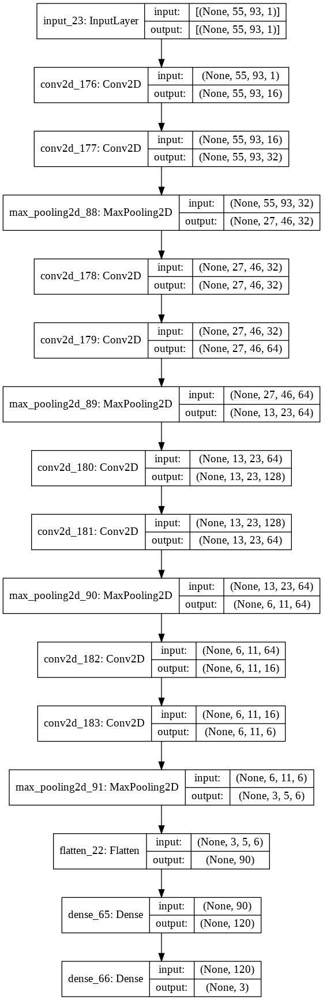

In [ ]:
model=model_1_tel(classes=len(np.unique(np.array([0,1,2,2,2,2,2]))),filtros=[[16, 32], [32, 64], [128,64], [16, 6]],batch_init=False,last_layers=[120],learning_rate=4e-6)
tf.keras.utils.plot_model(model,show_shapes=1,expand_nested=1)

In [ ]:
y_train_new=y_train.copy()
y_test_new=y_test.copy()
for m,n in enumerate([0,1,2,2,2,2,2]):
    y_train_new[y_train==m]=n
    y_test_new[y_test==m]=n
y_train_new=tf.keras.utils.to_categorical(y_train_new)
y_test_new=tf.keras.utils.to_categorical(y_test_new)

In [ ]:
hist_aux=model.fit(x_train,y_train_new,epochs=6,validation_data=(x_test,y_test_new))


Epoch 1/6
1050/1050 [==============================] - 10s 9ms/step - loss: 0.9839 - accuracy: 0.6890 - val_loss: 0.7828 - val_accuracy: 0.8516
Epoch 2/6
1050/1050 [==============================] - 9s 9ms/step - loss: 0.5373 - accuracy: 0.8631 - val_loss: 0.4041 - val_accuracy: 0.8746
Epoch 3/6
1050/1050 [==============================] - 9s 9ms/step - loss: 0.3658 - accuracy: 0.8867 - val_loss: 0.3471 - val_accuracy: 0.8919
Epoch 4/6
1050/1050 [==============================] - 9s 9ms/step - loss: 0.3302 - accuracy: 0.8990 - val_loss: 0.3245 - val_accuracy: 0.8966
Epoch 5/6
1050/1050 [==============================] - 9s 9ms/step - loss: 0.3121 - accuracy: 0.9058 - val_loss: 0.3116 - val_accuracy: 0.9021
Epoch 6/6
1050/1050 [==============================] - 9s 9ms/step - loss: 0.3001 - accuracy: 0.9113 - val_loss: 0.3051 - val_accuracy: 0.9077


In [ ]:
confusion_matrix(np.argmax(y_test_new,axis=-1),np.argmax(model.predict(x_test),axis=-1))

array([[1177,    4,   24],
       [  25,  389,  375],
       [  11,   73, 9964]])

In [ ]:
confusion_matrix(np.argmax(y_test_new,axis=-1),np.argmax(model.predict(x_test),axis=-1))

array([[1176,    4,   25],
       [  26,  359,  404],
       [   9,   64, 9975]])

In [ ]:
confusion_matrix(np.argmax(y_test_new,axis=-1),np.argmax(model.predict(x_test),axis=-1))

array([[1195,   23,   31],
       [  69,  570,  572],
       [   8,   72, 5856]])

#Resultados agrupaciones 1 tel

In [ ]:
with open("/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_1_telescopio/agrupaciones_1tel_parte1.json","r") as json_file:
    resultados1 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_1_telescopio/agrupaciones_1tel_parte2.json","r") as json_file:
    resultados2 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_1_telescopio/agrupaciones_1tel_parte3.json","r") as json_file:
    resultados3 = json.load(json_file)

In [ ]:
resultados=resultados1.copy()
resultados.update(resultados2)
resultados.update(resultados3)
labels=list(resultados.keys())

In [ ]:
len(labels)

35

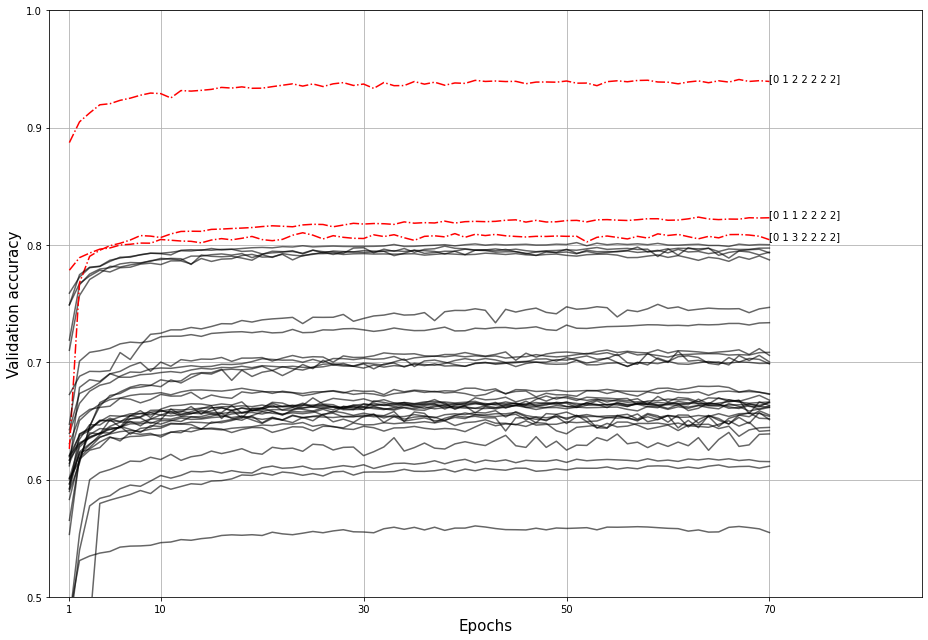

In [ ]:
plt.figure(figsize=(13,9))
for i,j in enumerate(resultados):
    plt.grid()
    plt.xlim([-1,85])
    plt.ylim([0.5,1])
    plt.xticks([1,10,30,50,70])
    plt.xlabel("Epochs",fontsize=15)
    plt.ylabel("Validation accuracy",fontsize=15)
    if resultados[j]["val_accuracy"][-1]>0.802:
        plt.text(70,resultados[j]["val_accuracy"][-1],str(j))
        plt.plot(np.arange(1,71),resultados[j]["val_accuracy"],"r-.")
    else:
        plt.plot(np.arange(1,71),resultados[j]["val_accuracy"],"k",alpha=0.6)
plt.tight_layout()
#plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_1_telescopio/acs_1tle_difagrupaciones.png",dpi=200)



#Diferentes agrupaciones 4 telescopios

In [ ]:
#cargamos los datos una vez con diferentes labels 
npy_base="/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/npy_data"
a=create_lista_list_runs(num_events=[8,33,30,35,20,39,33],random_select=False)
x_train,x_test,y_train,y_test=load_dataset_completo(npy_base,elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon'],labels_asign=[0,1,2,3,4,5,6],lista_list_runs=a,telescopios=[4,5,6,11],test_size=0.2,same_quant="approx",fill=True,verbose=True,categorical=False)

gamma 1 [1 2 3 4 5 6 7 8] (4, 1999)
gamma 2 [1 2 3 4 5 6 7 8] (4, 1999)
gamma 3 [1 2 3 4 5 6 7 8] (4, 1999)
gamma 4 [1 2 3 4 5 6 7 8] (4, 1997)
gamma 5 [1 2 3 4 5 6 7 8] (4, 1998)
gamma 6 [1 2 3 4 5 6 7 8] (4, 1998)
gamma 7 [1 2 3 4 5 6 7 8] (4, 1999)
gamma 8 [1 2 3 4 5 6 7 8] (4, 1997)
electron 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33] (4, 115)
electron 2 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33] (4, 106)
electron 3 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33] (4, 104)
electron 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33] (4, 128)
electron 5 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33] (4, 128)
electron 6 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30

In [ ]:
#prueba 4 telescopio diferentes agrupaciones 
#vamos a darle diferentes labels
elements=np.array(["gamma","electron",'proton', 'helium', 'iron', 'nitrogen', 'silicon'])
aux_save_dir="/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_4_telescopios"
lista_labels=np.array([[0,1,2,2,3,2,3],[0,1,2,2,2,3,3],[0,1,3,3,3,2,2],[0,1,3,3,2,3,2],[0,1,3,3,2,2,3],
                       [0,1,3,2,3,3,2],[0,1,3,2,3,2,3],[0,1,3,2,2,3,3],[0,1,2,3,3,3,2],[0,1,2,3,3,2,3],[0,1,2,3,2,3,3],[0,1,2,2,3,3,3]])
"""
[0,1,1,2,2,2,2],[0,1,2,1,2,2,2],[0,1,1,2,2,3,3],[0,1,1,1,2,2,2],[0,1,1,2,3,2,3],[0,1,1,1,2,1,2],[0,1,2,2,3,1,3],[0,1,1,2,3,1,3],[0,1,1,2,2,1,2],
                       [0,1,3,2,2,2,2],[0,1,2,3,2,2,2],[0,1,2,2,3,2,2],[0,1,2,2,2,3,2],[0,1,2,2,2,2,3],[0,1,2,2,2,2,2],
                       [0,1,3,3,2,2,2],[0,1,3,2,3,2,2],[0,1,3,2,2,3,2],[0,1,3,2,2,2,3],[0,1,2,3,3,2,2],[0,1,2,3,2,3,2],

[0,1,3,2,2,2,2],[0,1,2,3,2,2,2],[0,1,2,2,3,2,2],[0,1,2,2,2,3,2],[0,1,2,2,2,2,3],[0,1,2,2,2,2,2],[0,1,2,3,2,2,3],[0,1,2,2,3,3,2],
                       [0,1,3,3,2,2,2],[0,1,3,2,3,2,2],[0,1,3,2,2,3,2],[0,1,3,2,2,2,3],[0,1,2,3,3,2,2],[0,1,2,3,2,3,2],[0,1,2,3,2,2,3],

[0,1,2,2,3,3,2],[0,1,2,2,3,2,3],[0,1,2,2,2,3,3],
                       [0,1,3,3,3,2,2],[0,1,3,3,2,3,2],[0,1,3,3,2,2,3],[0,1,3,2,3,3,2],[0,1,3,2,3,2,3],[0,1,3,2,2,3,3],[0,1,2,3,3,3,2],[0,1,2,3,3,2,3],[0,1,2,3,2,3,3],[0,1,2,2,3,3,3]
"""
i_aux=4
hist_total={}
for i,j in enumerate(lista_labels):
    #vamos a cambiar los y_test y y_train
    y_train_new=y_train.copy()
    y_test_new=y_test.copy()
    for m,n in enumerate(j):
        y_train_new[y_train==m]=n
        y_test_new[y_test==m]=n
    y_train_new=tf.keras.utils.to_categorical(y_train_new)
    y_test_new=tf.keras.utils.to_categorical(y_test_new)

    model=model_multi_tel(len_inputs=4,input_shapes=[(55,93,1)],classes=len(np.unique(j)),learning_rate=1e-5,last_dense=[150,50],filtros=[[32, 64], [128, 256], [64, 32], [16, 6]],common_pre=True)
    hist_aux=model.fit(x_train,y_train_new,epochs=50,batch_size=64,validation_data=(x_test,y_test_new))

    #vamos a guardar la conf matrix y la hist

    hist_total[str(j)]=hist_aux.history
    comp_and_diplay_conf_matrix(y_test_new,model.predict(x_test),["gamma","electron","others",str(elements[j==3])],sin_diag=False)
    plt.savefig(f"{aux_save_dir}/{str(j)}_confmatrix_4tels.png")
    #if i in[10,20,30]:
    aux2=json.dumps(hist_total)
    with open(f"{aux_save_dir}/agrupaciones_4tel_parte_{i_aux}.json","w") as fil2:
        fil2.write(aux2)
#i_aux+=1


NameError: ignored

#Resultados agrupaciones 4 tels

In [ ]:
with open("/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_4_telescopios/agrupaciones_4tel_parte_1.json","r") as json_file:
    resultados1 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_4_telescopios/agrupaciones_4tel_parte_2.json","r") as json_file:
    resultados2 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_4_telescopios/agrupaciones_4tel_parte_3.json","r") as json_file:
    resultados3 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_4_telescopios/agrupaciones_4tel_parte_4.json","r") as json_file:
    resultados4 = json.load(json_file)

with open("/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_4_telescopios/agrupaciones_4tel_parte_5.json","r") as json_file:
    resultados5 = json.load(json_file)



In [ ]:
resultados=resultados1
resultados.update(resultados2)
resultados.update(resultados3)
resultados.update(resultados4)
resultados.update(resultados5)

labels=list(resultados.keys())
len(labels)

35

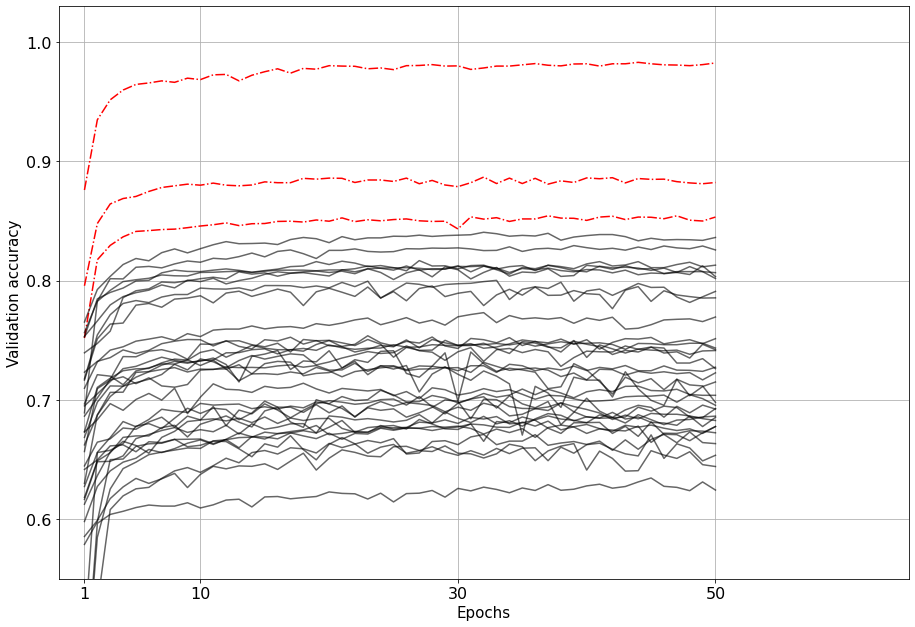

In [ ]:
plt.figure(figsize=(13,9))
for i,j in enumerate(resultados):
    plt.grid()
    plt.xlim([-1,65])
    plt.ylim([0.55,1.03])
    plt.xticks([1,10,30,50])
    plt.xlabel("Epochs",fontsize=15)
    plt.ylabel("Validation accuracy",fontsize=15)
    if resultados[j]["val_accuracy"][-1]>0.838:
        #plt.text(50.2,resultados[j]["val_accuracy"][-1],str(j))
        plt.plot(np.arange(1,51),resultados[j]["val_accuracy"],"r-.")
    else:
        plt.plot(np.arange(1,51),resultados[j]["val_accuracy"],"k",alpha=0.6)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_4_telescopios/group_4tels_sinnombre.png",dpi=230)

#Innecesario, AGRUPACIONES 6 TELS


In [ ]:
#cargar datos para 6 tels
npy_base="/content/drive/MyDrive/prediccion_datos_muchos_telescopios/datos_muchos_tels_seleccion_6_03_21/npy_data"

a=create_lista_list_runs(num_events=[8,39,39,39,20,39,39],random_select=False)
x_train_1,x_test_1,y_train_1,y_test_1=load_dataset_completo(npy_base,elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon'],labels_asign=[0,1,2,3,4,5,6],lista_list_runs=a,telescopios=[4,5,6,11,29,30],test_size=0.2,same_quant="approx",fill=True,verbose=True)
x_train_2,x_test_2,y_train_2,y_test_2=load_dataset_completo(npy_base,elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon'],labels_asign=[0,1,2,3,4,5,6],lista_list_runs=a,telescopios=[4,5,6,11,31,32],test_size=0.2,same_quant="approx",fill=True,verbose=True)
x_train_3,x_test_3,y_train_3,y_test_3=load_dataset_completo(npy_base,elementos=['gamma', 'electron', 'proton', 'helium', 'iron', 'nitrogen', 'silicon'],labels_asign=[0,1,2,3,4,5,6],lista_list_runs=a,telescopios=[4,5,6,11,33,34],test_size=0.2,same_quant="approx",fill=True,verbose=True)

In [ ]:
#juntamos todo 6 tels 
x_train=[]
x_test=[]

for i in range(6):
    x_train.append(np.concatenate((x_train_1[i],x_train_2[i],x_train_3[i]),axis=0))
    x_test.append(np.concatenate((x_test_1[i],x_test_2[i],x_test_3[i]),axis=0))

y_train=np.concatenate((y_train_1,y_train_2,y_train_3),axis=0)
y_test=np.concatenate((y_test_1,y_test_2,y_test_3),axis=0)



In [ ]:
#prueba 6 telescopio diferentes agrupaciones 
#vamos a darle diferentes labels
elements=np.array(["gamma","electron",'proton', 'helium', 'iron', 'nitrogen', 'silicon'])
aux_save_dir="/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_6_telescopios"

lista_labels=np.array([[0,1,2,2,3,2,3],[0,1,2,2,2,3,3],[0,1,3,3,3,2,2],[0,1,3,3,2,3,2],[0,1,3,3,2,2,3],[0,1,1,2,2,2,2],
                       [0,1,2,1,2,2,2],[0,1,1,2,2,3,3],[0,1,1,1,2,2,2],[0,1,1,2,3,2,3],[0,1,1,1,2,1,2],[0,1,2,2,3,1,3],
                       [0,1,1,2,3,1,3],[0,1,1,2,2,1,2],[0,1,3,2,2,2,2],[0,1,2,3,2,2,2],[0,1,2,2,3,2,2],[0,1,2,2,2,3,2],
                       [0,1,2,2,2,2,3],[0,1,2,2,2,2,2],[0,1,3,3,2,2,2],[0,1,3,2,3,2,2],[0,1,3,2,2,3,2],[0,1,3,2,2,2,3],
                       [0,1,2,3,3,2,2],[0,1,2,3,2,3,2],[0,1,3,2,3,3,2],[0,1,3,2,3,2,3],[0,1,3,2,2,3,3],[0,1,2,3,3,3,2],
                       [0,1,2,3,3,2,3],[0,1,2,3,2,3,3],[0,1,2,2,3,3,3]])

i_aux=1
hist_total={}
for i,j in enumerate(lista_labels):
    #vamos a cambiar los y_test y y_train
    y_train_new=y_train.copy()
    y_test_new=y_test.copy()
    for m,n in enumerate(j):
        y_train_new[y_train==m]=n
        y_test_new[y_test==m]=n
    y_train_new=tf.keras.utils.to_categorical(y_train_new)
    y_test_new=tf.keras.utils.to_categorical(y_test_new)

    model=model_multi_tel(len_inputs=6,input_shapes=[(55,93,1),(55,93,1),(55,93,1),(55,93,1),(84,56,1),(84,56,1)],
                          classes=len(np.unique(j)),learning_rate=2e-5,last_dense=[150,50],filtros=[[32, 64], [128, 256], [64, 32], [16, 6]],common_pre=True)
    hist_aux=model.fit(x_train,y_train_new,epochs=50,batch_size=64,validation_data=(x_test,y_test_new))

    #vamos a guardar la conf matrix y la hist

    hist_total[str(j)]=hist_aux.history
    comp_and_diplay_conf_matrix(y_test_new,model.predict(x_test),["gamma","electron","others",str(elements[j==3])],sin_diag=False)
    plt.savefig(f"{aux_save_dir}/{str(j)}_confmatrix_6tels.png")
    aux2=json.dumps(hist_total)
    with open(f"{aux_save_dir}/agrupaciones_6tel_parte_{i_aux}.json","w") as fil2:
        fil2.write(aux2)
    print(i+1, "de", len(lista_labels),"\n")
print("Termino!")


#Resultados agrupaciones 6 tels

In [ ]:
os.listdir("/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_6_telescopios")

['[0 1 2 2 3 2 3]_confmatrix_6tels.png',
 '[0 1 2 2 2 3 3]_confmatrix_6tels.png',
 '[0 1 3 3 3 2 2]_confmatrix_6tels.png',
 '[0 1 3 3 2 3 2]_confmatrix_6tels.png',
 '[0 1 3 3 2 2 3]_confmatrix_6tels.png',
 '[0 1 1 2 2 2 2]_confmatrix_6tels.png',
 '[0 1 2 1 2 2 2]_confmatrix_6tels.png',
 '[0 1 1 2 2 3 3]_confmatrix_6tels.png',
 '[0 1 1 1 2 2 2]_confmatrix_6tels.png',
 '[0 1 1 2 3 2 3]_confmatrix_6tels.png',
 '[0 1 1 1 2 1 2]_confmatrix_6tels.png',
 '[0 1 2 2 3 1 3]_confmatrix_6tels.png',
 'agrupaciones_6tel_parte_1.json',
 '[0 1 1 2 3 1 3]_confmatrix_6tels.png',
 '[0 1 1 2 2 1 2]_confmatrix_6tels.png',
 '[0 1 3 2 2 2 2]_confmatrix_6tels.png',
 '[0 1 2 3 2 2 2]_confmatrix_6tels.png',
 '[0 1 2 2 3 2 2]_confmatrix_6tels.png',
 '[0 1 2 2 2 3 2]_confmatrix_6tels.png',
 '[0 1 2 2 2 2 3]_confmatrix_6tels.png',
 '[0 1 2 2 2 2 2]_confmatrix_6tels.png',
 '[0 1 3 3 2 2 2]_confmatrix_6tels.png',
 '[0 1 3 2 3 2 2]_confmatrix_6tels.png',
 '[0 1 3 2 2 3 2]_confmatrix_6tels.png',
 '[0 1 3 2 2 2 3]_conf

In [ ]:
with open("/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_6_telescopios/agrupaciones_6tel_parte_1.json","r") as json_file:
    resultados1 = json.load(json_file)
with open("/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_6_telescopios/agrupaciones_6tel_parte_2.json","r") as json_file:
    resultados2 = json.load(json_file)




In [ ]:
resultados=resultados1
resultados.update(resultados2)


labels=list(resultados.keys())
len(labels)

33

[0 1 2 2 3 2 3] 0.8869202733039856
[0 1 3 3 2 3 2] 0.8863991498947144
[0 1 1 1 2 1 2] 0.8989056944847107
[0 1 2 2 3 2 2] 0.9739447832107544
[0 1 2 2 2 2 3] 0.8858780860900879
[0 1 2 2 2 2 2] 0.9744658470153809


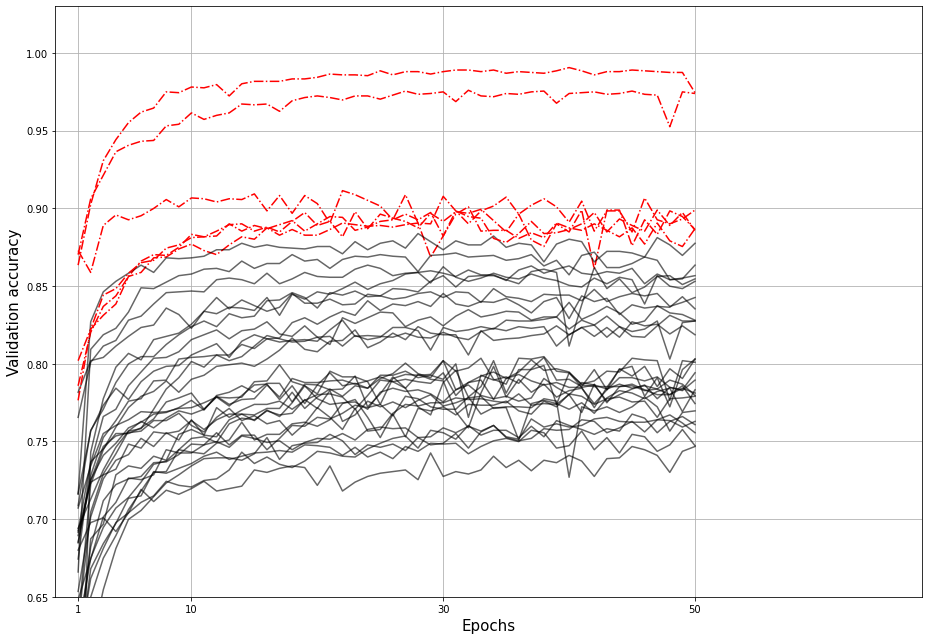

In [ ]:
plt.figure(figsize=(13,9))
for i,j in enumerate(resultados):
    plt.grid()
    plt.xlim([-0.8,68])
    plt.ylim([0.65,1.03])
    plt.xticks([1,10,30,50])
    plt.xlabel("Epochs",fontsize=15)
    plt.ylabel("Validation accuracy",fontsize=15)
    if resultados[j]["val_accuracy"][-1]>0.88:
        #plt.text(50.2,resultados[j]["val_accuracy"][-1],str(j))
        plt.plot(np.arange(1,51),resultados[j]["val_accuracy"],"r-.")
        print(j,resultados[j]["val_accuracy"][-1])
    else:
        plt.plot(np.arange(1,51),resultados[j]["val_accuracy"],"k",alpha=0.6)
plt.tight_layout()
#plt.savefig("/content/drive/MyDrive/MAIN_TFG/final_results/agrupaciones_6_telescopios/group_6tels_sinnombre.png",dpi=230)